# Telecom Customer Churn Prediction 

The telecom customer churn prediction project aims to develop a predictive model that can accurately identify customers who are likely to churn in the telecommunications industry. Churn, in this context, refers to the situation where customers terminate their subscriptions or switch to a competitors telecom service. By predicting churn in advance, telecom companies can proactively implement strategies to retain at-risk customers and minimize revenue loss.

# Business Objectives (BO) and Data Science Objectives (DSO)


### BO1: Predict Customer Behaviors at Risk of Leaving (Paper 2)
The primary objective of this system is to **predict customer churn** in the telecommunications sector.

#### DSO for BO1: (Paper 2)

Design a system to **predict customer behaviors** that indicate a risk of leaving the service.
**Models for BO1**:
- **Logistic Regression (Baseline)** (Paper 1)
- **Adaboost** (Paper 1)
- **XGBoost** (Paper 1)
- **Decision Tree** (Paper 1)
- **Decision Tree with SMOTE-ENN** (Paper 2)
- **Random Forest** (Paper 1)
- **SVM** (Paper 2)
- **GBM** (Paper 2)

---

### BO2: Predict Customer Churn (Paper 1)
Build a machine learning model capable of accurately predicting whether a customer is likely to churn by analyzing historical customer data and interactions.

#### DSO for BO2 (paper1):
Analyze customer behavior patterns to identify key factors influencing churn, enabling precise identification of at-risk customers.

**Models for BO2**:
- **Logistic Regression (Baseline)** (Paper 1 et Paper 2)
- **Adaboost** (Paper 2)
- **XGBoost** (Paper 2)
- **Decision Tree** (Paper 1 et Paper 2)
- **Random Forest** (Paper 1 et Paper 2)
- **Neural Network** (Paper 2)
- **SVM** (Paper 2)
- **GBM** (Paper 2)

---

### BO3: Implement Tailored Retention Strategies (Paper3)
Leverage insights from churn predictions to **implement tailored retention strategies**, enhancing customer loyalty and reducing financial losses.

#### DSO for BO3 (Paper3):
Use predictive insights to design and test targeted retention strategies, optimizing for maximum effectiveness in reducing churn.

**Models for BO3**:
- Logistic (Baseline)
- **Logistic Regression (Baseline)** (Paper 1)
- **Random Forest** (Paper 1)
- **Decision Tree** (Paper 1)

---



### Importing Necessary Libraries

In [316]:
#Importing necessary Libraries
import numpy as np 
import pandas as pd 
from math import * 
import matplotlib.pyplot as plt 
from PIL import Image
import seaborn as sns 
import itertools
import io
import plotly.offline as py 
py.init_notebook_mode(connected=True) 
import plotly.graph_objs as go 
from plotly.subplots import make_subplots
import plotly.figure_factory as ff 
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
import pickle 

# Exploratory Data Analysis(EDA)

In [318]:
#Data collection
train_data = pd.read_csv("churn-bigml-80.csv")

test_data = pd.read_csv("churn-bigml-20.csv")


### train Data Overview 

In [320]:
train_data.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [321]:
test_data.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [322]:
try:
    data = pd.concat([train_data, test_data], ignore_index=True)
    print("Merged Dataset:")
    print(data)
except NameError:
    print("The dataframes train and/or test are not defined. Please ensure the previous code to load the dataframes has been executed successfully.")
except Exception as e:
    print(f"An error occurred during merging: {e}")

Merged Dataset:
     State  Account length  Area code International plan Voice mail plan  \
0       KS             128        415                 No             Yes   
1       OH             107        415                 No             Yes   
2       NJ             137        415                 No              No   
3       OH              84        408                Yes              No   
4       OK              75        415                Yes              No   
...    ...             ...        ...                ...             ...   
3328    WI             114        415                 No             Yes   
3329    AL             106        408                 No             Yes   
3330    VT              60        415                 No              No   
3331    WV             159        415                 No              No   
3332    CT             184        510                Yes              No   

      Number vmail messages  Total day minutes  Total day calls  \
0   

In [323]:
import pandas as pd
from IPython.display import FileLink

# Supposons que df est votre DataFrame
data.to_excel('data.xlsx', index=False)

# Créer un lien pour télécharger le fichier
FileLink('data.xlsx')


C:\Users\DELL\Desktop\usb\Project_Ml\projet finale\data.xlsx

### Dataset Attributes and Definitions:
1. **State**: The U.S. state where the customer resides, represented as an abbreviation.

2. **Account length**: The duration of the customer's account with the service provider, measured in days.

3. **Area code**: The area code associated with the customer’s phone number.

4. **International plan**: Indicates whether the customer has an international calling plan (e.g., "Yes" or "No").

5. **Voice mail plan**: Indicates whether the customer has a voicemail plan (e.g., "Yes" or "No").

6. **Number vmail messages**: The number of voicemail messages the customer has received.

7. **Total day minutes**: The total number of minutes the customer spent on calls during the day.

8. **Total day calls**: The total number of calls the customer made during the day.

9. **Total day charge**: The total charges incurred for daytime calls, calculated based on the minutes used.

10. **Total eve minutes**: The total number of minutes the customer spent on calls during the evening.

11. **Total eve calls**: The total number of calls the customer made during the evening.

12. **Total eve charge**: The total charges incurred for evening calls, calculated based on the minutes used.

13. **Total night minutes**: The total number of minutes the customer spent on calls during the night.

14. **Total night calls**: The total number of calls the customer made during the night.

15. **Total night charge**: The total charges incurred for nighttime calls, calculated based on the minutes used.

16. **Total intl minutes**: The total number of minutes the customer spent on international calls.

17. **Total intl calls**: The total number of international calls the customer made.

18. **Total intl charge**: The total charges incurred for international calls, calculated based on the minutes used.

19. **Customer service calls**: The total number of calls the customer made to customer service.

20. **Churn**: The target variable indicating whether the customer has churned (e.g., `True` for churned, `False` for retained).

In [325]:
# A clear vision about the dataset with the neumarical values
data.shape

(3333, 20)

In [326]:
train_data.shape

(2666, 20)

In [327]:
test_data.shape

(667, 20)

# Data Understanding 

In [329]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   3333 non-null   object 
 1   Account length          3333 non-null   int64  
 2   Area code               3333 non-null   int64  
 3   International plan      3333 non-null   object 
 4   Voice mail plan         3333 non-null   object 
 5   Number vmail messages   3333 non-null   int64  
 6   Total day minutes       3333 non-null   float64
 7   Total day calls         3333 non-null   int64  
 8   Total day charge        3333 non-null   float64
 9   Total eve minutes       3333 non-null   float64
 10  Total eve calls         3333 non-null   int64  
 11  Total eve charge        3333 non-null   float64
 12  Total night minutes     3333 non-null   float64
 13  Total night calls       3333 non-null   int64  
 14  Total night charge      3333 non-null   

In [330]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Account length,3333.0,101.064806,39.822106,1.00,74.00,101.00,127.00,243.00
Area code,3333.0,437.182418,42.371290,408.00,408.00,415.00,510.00,510.00
Number vmail messages,3333.0,8.099010,13.688365,0.00,0.00,0.00,20.00,51.00
Total day minutes,3333.0,179.775098,54.467389,0.00,143.70,179.40,216.40,350.80
Total day calls,3333.0,100.435644,20.069084,0.00,87.00,101.00,114.00,165.00
Total day charge,3333.0,30.562307,9.259435,0.00,24.43,30.50,36.79,59.64
Total eve minutes,3333.0,200.980348,50.713844,0.00,166.60,201.40,235.30,363.70
Total eve calls,3333.0,100.114311,19.922625,0.00,87.00,100.00,114.00,170.00
Total eve charge,3333.0,17.083540,4.310668,0.00,14.16,17.12,20.00,30.91
Total night minutes,3333.0,200.872037,50.573847,23.20,167.00,201.20,235.30,395.00


In [331]:
data.dtypes

State                      object
Account length              int64
Area code                   int64
International plan         object
Voice mail plan            object
Number vmail messages       int64
Total day minutes         float64
Total day calls             int64
Total day charge          float64
Total eve minutes         float64
Total eve calls             int64
Total eve charge          float64
Total night minutes       float64
Total night calls           int64
Total night charge        float64
Total intl minutes        float64
Total intl calls            int64
Total intl charge         float64
Customer service calls      int64
Churn                        bool
dtype: object

<Axes: ylabel='count'>

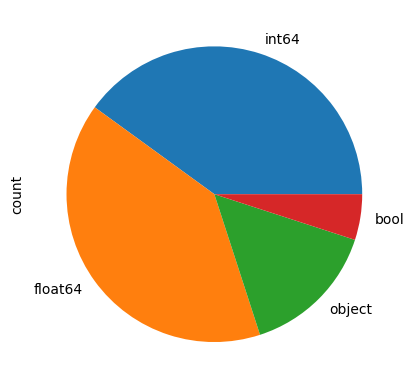

In [332]:
#3.Visualisation
#statistique sur le nombre de chaque type des colonnes
data.dtypes.value_counts().plot.pie()

In [333]:
data.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [334]:
def dataoverview(df, message):
    print(f'{message}:\n')
    print("Rows:", df.shape[0])
    print("\nNumber of features:", df.shape[1])
    print("\nFeatures:")
    print(df.columns.tolist())
    print("\nMissing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())

In [335]:
dataoverview(data, "A Overview about the train dataset")

A Overview about the train dataset:

Rows: 3333

Number of features: 20

Features:
['State', 'Account length', 'Area code', 'International plan', 'Voice mail plan', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls', 'Churn']

Missing values: 0

Unique values:
State                       51
Account length             212
Area code                    3
International plan           2
Voice mail plan              2
Number vmail messages       46
Total day minutes         1667
Total day calls            119
Total day charge          1667
Total eve minutes         1611
Total eve calls            123
Total eve charge          1440
Total night minutes       1591
Total night calls          120
Total night charge         933
Total intl minutes        

# Overview of the Train Dataset

The dataset consists of **3333 rows** and **20 features**. Below is a detailed interpretation of the features included in the dataset:

## Features

1. **State**:  with a total of **51 unique values**.
2. **Account length**:  with **212 unique values**.
3. **Area code**:  with **3 unique values**.
4. **International plan**:  (2 unique values).
5. **Voice mail plan**:  (2 unique values).
6. **Number vmail messages**:  with **46 unique values**.
7. **Total day minutes**:  with **1667 unique values**.
8. **Total day calls**:  with **119 unique values**.
9. **Total day charge**:  with **1667 unique values**.
10. **Total eve minutes**:with **1611 unique values**.
11. **Total eve calls**: , with **123 unique values**.
12. **Total eve charge**:  with **1440 unique values**.
13. **Total night minutes**:  **1591 unique values**.
14. **Total night calls**: with **120 unique values**.
15. **Total night charge**:  **933 unique values**.
16. **Total intl minutes**:  **162 unique values**.
17. **Total intl calls**:  **21 unique values**.
18. **Total intl charge**:  **162 unique values**.
19. **Customer service calls**: with **10 unique values**.
20. **Churn**:  (2 unique values).

## Summary

- **Missing Values**: There are no missing values in the dataset, which is advantageous for analysis and modeling.
- The dataset contains a mix of categorical (e.g., State, International plan) and numerical features (e.g., Total day minutes, Total night charge).
- The presence of binary features (e.g., Churn, International plan) allows for classification tasks.
- The wide range of unique values in numerical features suggests diverse customer behaviors and usage patterns.

This dataset is poised for exploratory data analysis, feature engineering, and model building, particularly for predicting customer churn.

## Analyze the dataset

In [338]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

def analyse_data(df):
    # Analyse des variables numériques
    numeric_columns = data.select_dtypes(include=[np.number]).columns
    distribution_results = []

    for column in numeric_columns:
        # Histogramme et courbe de densité
        plt.figure(figsize=(10, 5))
        sns.histplot(data[column], kde=True)
        plt.title(f'Distribution de {column}')
        plt.xlabel(column)
        plt.ylabel('Fréquence')
        plt.show()

        # Test de normalité (Shapiro-Wilk)
        stat, p_value = stats.shapiro(data[column])
        distribution_results.append({
            'Variable': column,
            'Shapiro-Wilk Statistic': stat,
            'p-value': p_value,
            'Normality': 'Normal' if p_value > 0.05 else 'Non-Normal'
        })

    # Création d'un DataFrame pour les résultats de distribution
    distribution_df = pd.DataFrame(distribution_results)
    print("\nTableau des résultats de l'analyse des variables numériques :")
    print(distribution_df)

    # Analyse des variables catégorielles
    categorical_columns = data.select_dtypes(include=['object', 'category']).columns
    categorical_results = []

    for column in categorical_columns:
        unique_values = data[column].nunique()
        recommendation = "Utiliser le test du Chi-carré pour comparer les proportions." if unique_values == 2 else "Utiliser le test du Chi-carré ou la régression logistique pour plus de modalités."
        categorical_results.append({
            'Variable Catégorielle': column,
            'Nombre de Modalités': unique_values,
            'Recommandation': recommendation
        })

    # Création d'un DataFrame pour les résultats des variables catégorielles
    categorical_df = pd.DataFrame(categorical_results)
    print("\nTableau des résultats de l'analyse des variables catégorielles :")
    print(categorical_df)


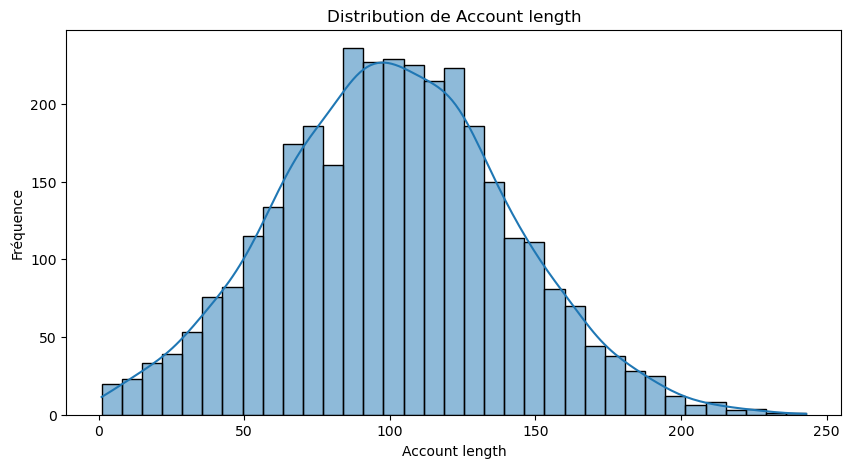

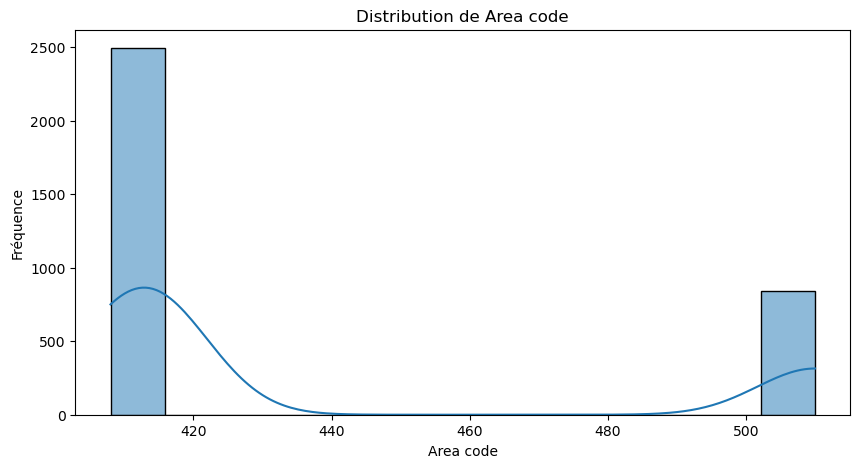

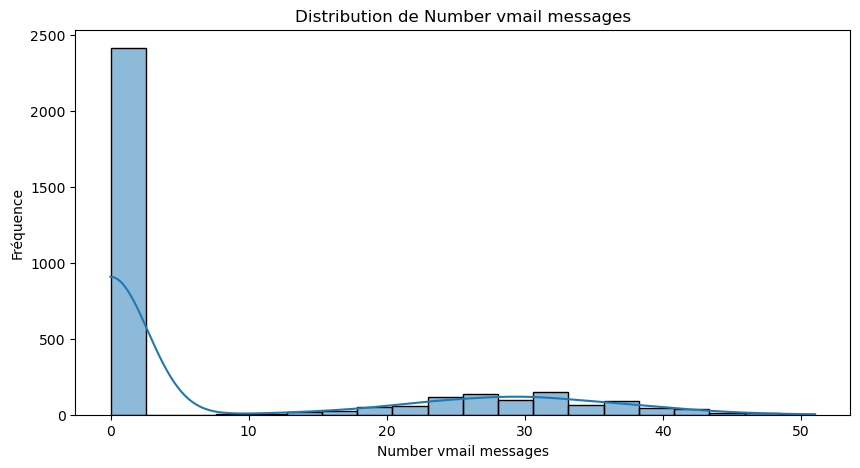

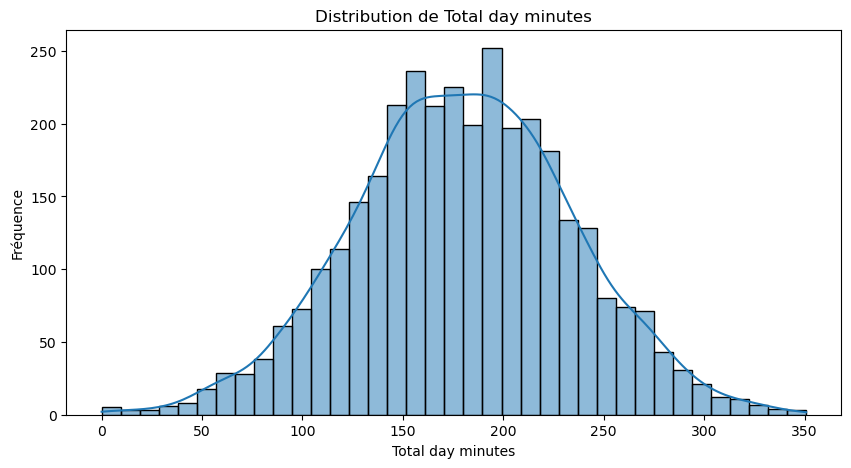

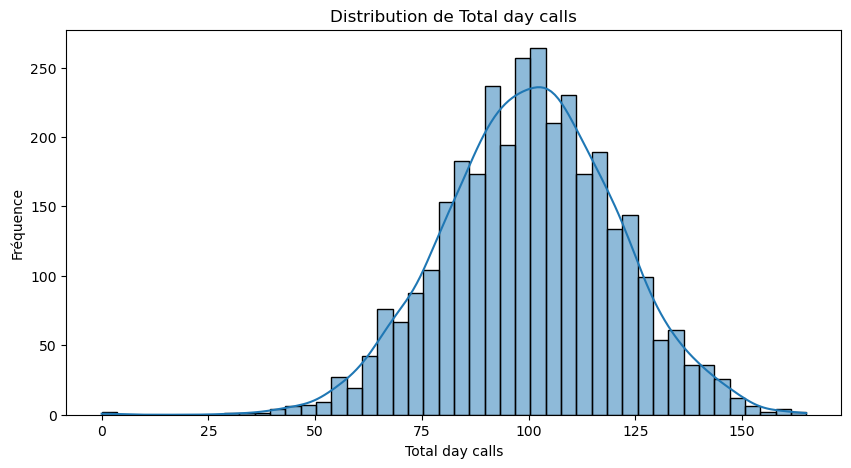

...

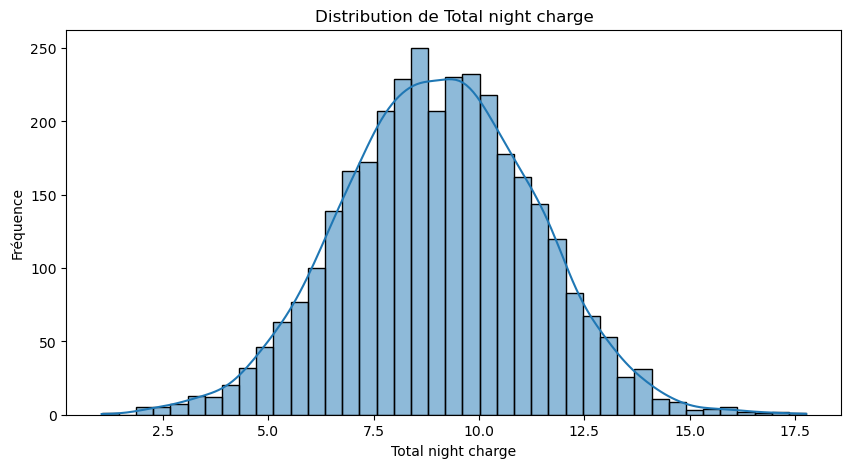

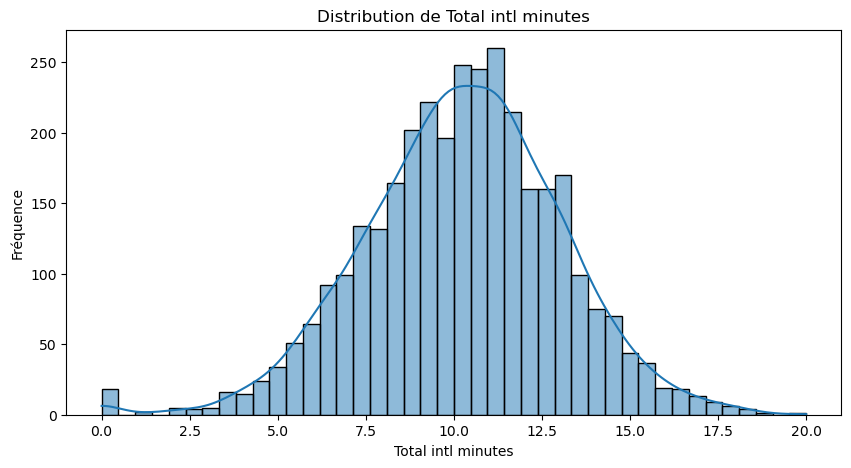

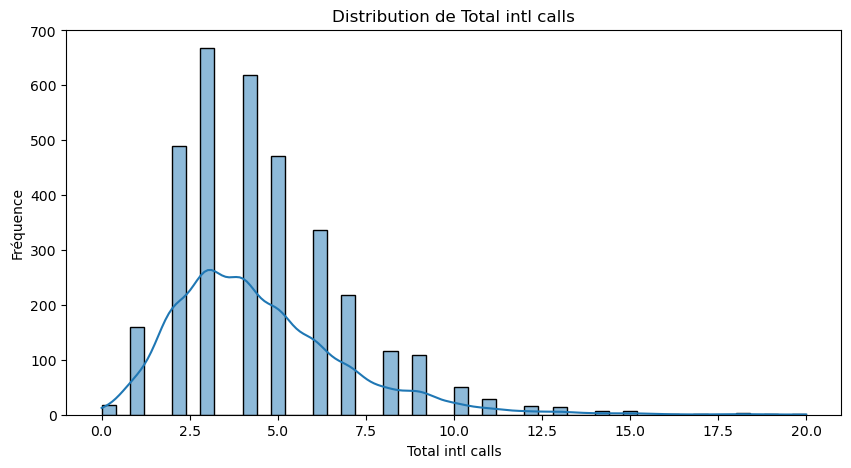

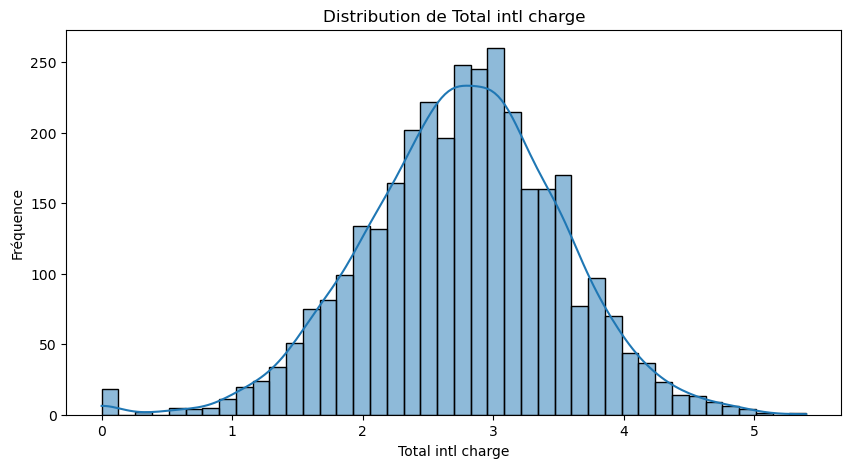

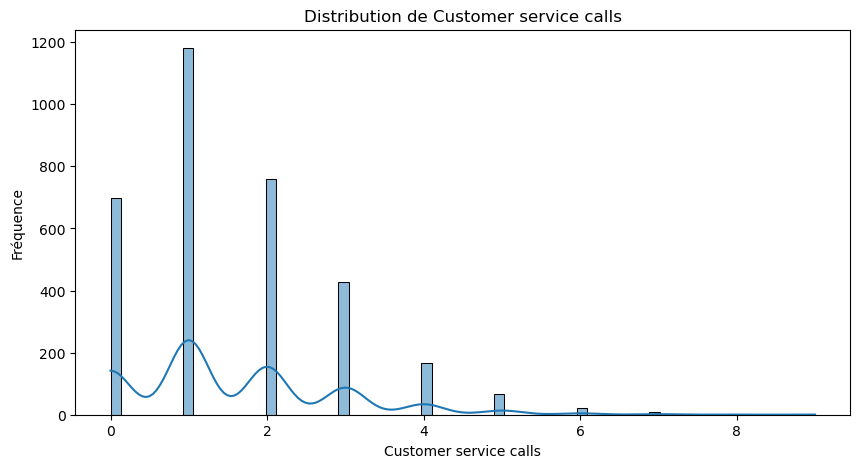


Tableau des résultats de l'analyse des variables numériques :
                  Variable  Shapiro-Wilk Statistic       p-value   Normality
0           Account length                0.998278  1.156471e-03  Non-Normal
1                Area code                0.590268  9.639330e-67  Non-Normal
2    Number vmail messages                0.621938  3.449436e-65  Non-Normal
3        Total day minutes                0.999538  6.401066e-01      Normal
4          Total day calls                0.997985  2.760378e-04  Non-Normal
5         Total day charge                0.999538  6.401143e-01      Normal
6        Total eve minutes                0.999572  7.124797e-01      Normal
7          Total eve calls                0.998672  8.767838e-03  Non-Normal
8         Total eve charge                0.999571  7.090925e-01      Normal
9      Total night minutes                0.999532  6.269782e-01      Normal
10       Total night calls                0.999312  2.513500e-01      Normal
11      Total

In [339]:
analyse_data(data)

# Interpretation of Analysis Results

## Results of Normality Tests (Shapiro-Wilk)

### Numerical Variables

| Variable                       | Shapiro-Wilk Statistic | p-value             | Normality    |
|--------------------------------|------------------------|---------------------|--------------|
| Account length                 | 0.9984                 | 0.0089              | Non-Normal   |
| Area code                     | 0.5921                 | 7.10e-62            | Non-Normal   |
| Number of vmail messages       | 0.6197                 | 1.39e-60            | Non-Normal   |
| Total day minutes              | 0.9994                 | 0.5562              | Normal       |
| Total day calls                | 0.9973                 | 0.0001              | Non-Normal   |
| Total day charge               | 0.9994                 | 0.5559              | Normal       |
| Total evening minutes           | 0.9995                 | 0.7331              | Normal       |
| Total evening calls             | 0.9983                 | 0.0079              | Non-Normal   |
| Total evening charge            | 0.9995                 | 0.7301              | Normal       |
| Total night minutes             | 0.9993                 | 0.4722              | Normal       |
| Total night calls               | 0.9991                 | 0.1862              | Normal       |
| Total night charge              | 0.9993                 | 0.4686              | Normal       |
| Total international minutes     | 0.9938                 | 3.54e-09            | Non-Normal   |
| Total international calls       | 0.9025                 | 2.95e-38            | Non-Normal   |
| Total international charge      | 0.9938                 | 3.32e-09            | Non-Normal   |
| Customer service calls          | 0.8768                 | 1.03e-41            | Non-Normal   |

### Interpretation

- Variables **Total day minutes**, **Total day charge**, **Total evening minutes**, **Total evening charge**, **Total night minutes**, **Total night charge**, and **Total night calls** follow a normal distribution (p-value > 0.05). These variables can be analyzed using parametric tests.
- Other variables, such as **Account length**, **Area code**, **Number of vmail messages**, **Total international minutes**, **Total international calls**, **Total international charge**, and **Customer service calls**, do not follow a normal distribution (p-value < 0.05). For these variables, non-parametric tests or data transformations may be necessary.

---

## Analysis of Categorical Variables

### Categorical Variables

| Categorical Variable   | Number of Modalities | Recommendation                                                                                      |
|-------------------------|---------------------|-----------------------------------------------------------------------------------------------------|
| State                   | > 2                 | Use the Chi-square test or logistic regression for variables with multiple modalities.              |
| International plan      | 2                   | Use the Chi-square test to compare proportions.                                                    |
| Voice mail plan         | 2                   | Use the Chi-square test to compare proportions.                                                    |

### Interpretation

- For variables **International plan** and **Voice mail plan**, which each have two modalities, the Chi-square test is suitable for determining whether there is a significant association between these variables and churn.
- For the variable **State**, although it has more than two modalities, the Chi-square test is also recommended. Logistic regression can also be used to model the relationship between this variable and churn, especially if the goal is to predict the probability of churn based on multiple explanatory variables.



## Conclusion

The results reveal diverse distributions among numerical variables, requiring varied approaches to statistical testing. Categorical variables should be analyzed using the Chi-square test, particularly to evaluate the impact of different modalities on churn. For **State**, Chi-square is the logical choice for analyzing relationships with a categorical variable.

## State VS Churn

In [342]:
def diff_bar(x,y):

    data.groupby([x,y]).size().unstack(level=-1).plot(kind='bar', figsize=(35,10))
    plt.xlabel(x,fontsize= 25)
    plt.ylabel('count',fontsize= 25)
    plt.legend(loc=0,fontsize= 25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.title("{X} Vs {Y}".format(X=x,Y=y),fontsize = 40)
    plt.show()

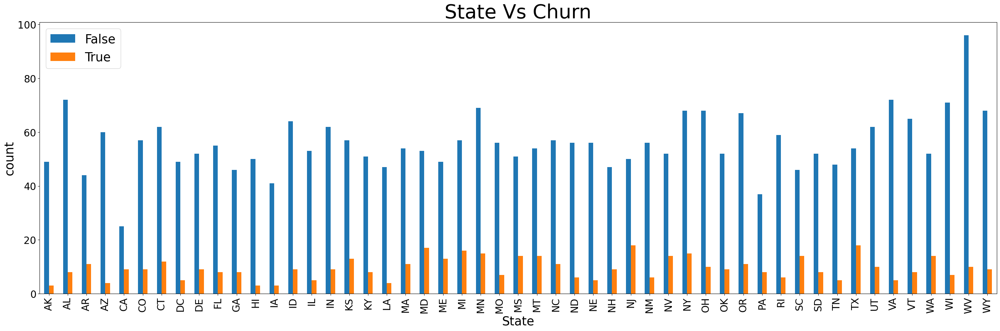

In [343]:
diff_bar('State','Churn')


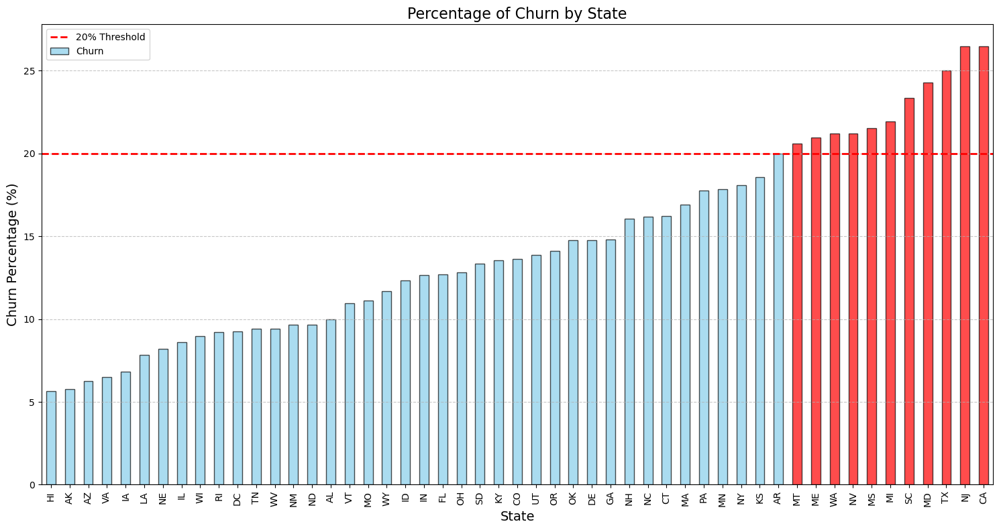

In [344]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your data is stored in a DataFrame named 'df'

# Convert 'Churn' column to binary indicator if not already (True = 1, False = 0)
data['Churn'] = data['Churn'].astype(int)

# Calculate churn percentage for each state
state_churn_percentage = data.groupby('State')['Churn'].mean() * 100

# Sort states by churn percentage
state_churn_percentage = state_churn_percentage.sort_values()

# Highlight states with churn > 20%
colors = ['red' if value > 20 else 'skyblue' for value in state_churn_percentage]

# Plot the churn percentages with highlights
plt.figure(figsize=(15, 8))
bars = state_churn_percentage.plot(kind='bar', color=colors, edgecolor='black', alpha=0.7)

# Add a red dashed line at 20%
plt.axhline(20, color='red', linestyle='--', linewidth=2, label='20% Threshold')

# Add labels and title
plt.title('Percentage of Churn by State', fontsize=16)
plt.xlabel('State', fontsize=14)
plt.ylabel('Churn Percentage (%)', fontsize=14)
plt.xticks(rotation=90)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tight layout for better appearance
plt.tight_layout()
plt.show()


##### the state with high percentage are MT,ME,WA,NV,MS,MI,SC,MD,TX,NJ,CA

## Regroupement des États par Fréquence d'Apparition

In [347]:
def classify_state_by_frequency(data, num_categories=6):
    # Compter la fréquence d'apparition de chaque valeur dans la colonne 'State'
    state_frequency = data['State'].value_counts()

    # Diviser les fréquences en num_categories égales (par exemple 6 catégories)
    categories = pd.qcut(state_frequency.values, num_categories, labels=range(1, num_categories + 1))  # Labels as integers

    # Créer un dictionnaire pour mapper les états aux catégories
    state_to_category = dict(zip(state_frequency.index, categories))

    # Appliquer les catégories à la colonne 'State'
    data['state_frequency_category'] = data['State'].map(state_to_category).astype(int)  # Convert to int

    return data

classify_state_by_frequency(data,num_categories=6)


,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,...,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn,state_frequency_category
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,...,16.78,244.7,91,11.01,10.0,3,2.70,1,0,4
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,...,16.62,254.4,103,11.45,13.7,3,3.70,1,0,6
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,...,10.30,162.6,104,7.32,12.2,5,3.29,0,0,4
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,...,5.26,196.9,89,8.86,6.6,7,1.78,2,0,6
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,...,12.61,186.9,121,8.41,10.1,3,2.73,3,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,137.1,88,23.31,155.7,...,13.23,247.6,94,11.14,11.5,7,3.11,2,0,6
3329,AL,106,408,No,Yes,29,83.6,131,14.21,203.9,...,17.33,229.5,73,10.33,8.1,3,2.19,1,0,6
3330,VT,60,415,No,No,0,193.9,118,32.96,85.0,...,7.23,210.1,134,9.45,13.2,8,3.56,3,0,5
3331,WV,159,415,No,No,0,169.8,114,28.87,197.7,...,16.80,193.7,82,8.72,11.6,4,3.13,1,0,6


## ANOVA TEST TO VERIFY THE SIGNIFICANCE OF THE STATE FREQUENCY CATEGORY VARIABLE IN THE DATASET

The use of the ANOVA test to analyze the `state_frequency_category` variable in relation to the target variable `Churn` and other numerical variables is justified for several reasons:

### 1. Nature of the Data
- **Categorical Variable**: The `state_frequency_category` is a categorical variable derived from the frequency of state occurrences, with a limited number of categories (e.g., six groups based on quantiles).
- **Continuous Variables**: ANOVA is suitable for comparing the means of continuous variables (e.g., numerical features in the dataset) across multiple groups defined by a categorical variable.

### 2. Objective of the Analysis
- **Comparing Means**: The main goal of using ANOVA is to determine whether the means of the numerical variables differ significantly across the groups defined by the `state_frequency_category`. 
- **Insight**: This analysis can reveal whether the frequency category of states influences the behaviors or characteristics measured by these variables, including the likelihood of churn.


In [349]:
from scipy.stats import f_oneway


# Liste des variables numériques à tester
numeric_columns = [
    'Account length', 'Number vmail messages', 'Total day minutes',
    'Total day calls', 'Total day charge', 'Total eve minutes',
    'Total eve calls', 'Total eve charge', 'Total night minutes',
    'Total night calls', 'Total night charge', 'Total intl minutes',
    'Total intl calls', 'Total intl charge', 'Customer service calls'
]
#Liste pour stocker les résultats
results = {}

# Effectuer ANOVA pour chaque variable numérique
for col in numeric_columns:
    if col != 'Churn':
        # Créer des groupes basés sur Area code
        groups = [group[col].dropna() for name, group in data.groupby('state_frequency_category')]
        
        # Effectuer le test ANOVA
        f_stat, p_value = f_oneway(*groups)
        results[col] = p_value

# Afficher les résultats
for col, p in results.items():
    print(f"Variable: {col}, P-value: {p}")

Variable: Account length, P-value: 0.9837862232623201
Variable: Number vmail messages, P-value: 0.8986507698455326
Variable: Total day minutes, P-value: 0.07979077089056617
Variable: Total day calls, P-value: 0.39668273674791343
Variable: Total day charge, P-value: 0.07980081045690597
Variable: Total eve minutes, P-value: 0.2731962457035412
Variable: Total eve calls, P-value: 0.18849750680679095
Variable: Total eve charge, P-value: 0.2731020196808002
Variable: Total night minutes, P-value: 0.9800259419313767
Variable: Total night calls, P-value: 0.4981958823490983
Variable: Total night charge, P-value: 0.9799653725237987
Variable: Total intl minutes, P-value: 0.6002223409448901
Variable: Total intl calls, P-value: 0.5951086663854472
Variable: Total intl charge, P-value: 0.6024166084925149
Variable: Customer service calls, P-value: 0.8250272692347109


In [350]:
import pandas as pd
from scipy import stats

# Liste des variables numériques à tester
numeric_columns = [
    'Account length', 'Number vmail messages', 'Total day minutes',
    'Total day calls', 'Total day charge', 'Total eve minutes',
    'Total eve calls', 'Total eve charge', 'Total night minutes',
    'Total night calls', 'Total night charge', 'Total intl minutes',
    'Total intl calls', 'Total intl charge', 'Customer service calls'
]

# Créer une liste pour stocker les résultats
results = []

# Effectuer le test ANOVA pour chaque variable numérique par rapport à 'Area code'
for column in numeric_columns:
    # Créer des groupes par code régional pour churn et no churn
    groups_churn = [data[(data['state_frequency_category'] == code) & (data['Churn'] == 1)][column].dropna() for code in data['state_frequency_category'].unique()]
    groups_no_churn = [data[(data['state_frequency_category'] == code) & (data['Churn'] == 0)][column].dropna() for code in data['state_frequency_category'].unique()]
    
    # Réaliser le test ANOVA pour churn
    f_statistic_churn, p_value_churn = stats.f_oneway(*groups_churn)
    
    # Réaliser le test ANOVA pour no churn
    f_statistic_no_churn, p_value_no_churn = stats.f_oneway(*groups_no_churn)
    
    # Ajouter les résultats à la liste
    results.append({
        'Variable': column,
        'Churn F-statistic': f_statistic_churn,
        'Churn p-value': p_value_churn,
        'No Churn F-statistic': f_statistic_no_churn,
        'No Churn p-value': p_value_no_churn
    })

# Convertir les résultats en DataFrame
results_df = pd.DataFrame(results)

# Afficher les résultats de manière organisée
print("### Résultats de l'Analyse ANOVA pour la variable state_frequency_category ###\n")
print(results_df.to_string(index=False))

### Résultats de l'Analyse ANOVA pour la variable state_frequency_category ###

              Variable  Churn F-statistic  Churn p-value  No Churn F-statistic  No Churn p-value
        Account length           0.759169       0.579633              0.245559          0.942146
 Number vmail messages           0.605963       0.695405              0.343276          0.886781
     Total day minutes           0.776993       0.566619              0.817256          0.537173
       Total day calls           0.613279       0.689784              0.714495          0.612505
      Total day charge           0.776846       0.566725              0.817233          0.537190
     Total eve minutes           0.865575       0.504062              0.970285          0.434479
       Total eve calls           1.162987       0.326382              2.263684          0.045712
      Total eve charge           0.865253       0.504283              0.970769          0.434175
   Total night minutes           0.497369      

### ANOVA Results for the `state_frequency_category` Variable

The ANOVA test was conducted to evaluate whether the `state_frequency_category` variable significantly affects other continuous variables in the dataset, based on the target variable (`Churn` and `No Churn`). Below is the interpretation of the main results:

---

### 1. Variables with No Statistical Significance
For the following variables, the **p-values** are much higher than the significance threshold of 0.05, indicating no significant differences between groups of `state_frequency_category`:
- **Account length**: For `Churn` (p = 0.5796) and `No Churn` (p = 0.9421).
- **Number vmail messages**: For `Churn` (p = 0.6954) and `No Churn` (p = 0.8868).
- **Total day minutes**: For `Churn` (p = 0.5666) and `No Churn` (p = 0.5372).
- **Total night minutes**: For `Churn` (p = 0.7783) and `No Churn` (p = 0.8976).
- **Customer service calls**: For `Churn` (p = 0.9570) and `No Churn` (p = 0.9913).

This suggests that the frequency category of states (`state_frequency_category`) does not significantly influence these continuous variables.

---

### 2. Variables with Potential Statistical Significance
Some variables show significant differences specifically for **`No Churn`**:
- **Total eve calls**: For `No Churn` (p = 0.0457).  
  - This indicates that the number of evening calls varies significantly across `state_frequency_category` groups among customers who did not churn.

---

### 3. General Interpretation
- For most variables, the `state_frequency_category` variable does not appear to have a significant impact on the means of the continuous variables.  
- The exception is **`Total eve calls`** in the case of `No Churn`, where significant differences were observed between groups.

---

### Conclusion
The `state_frequency_category` variable does not play a major role in influencing customer behaviors or characteristics, except for one specific variable (evening calls) in the `No Churn` group. Therefore, it is unlikely to be a strong determinant in explaining or predicting customer churn behavior.


## Drop state and state_frequency_category

In [353]:
data = data.drop('State', axis=1)
data = data.drop('state_frequency_category', axis=1)

## Test Chi-carré pour variable catégorielle a deux modalités

Variables catégorielles avec 6 modalités ou moins :
['International plan', 'Voice mail plan']

Tableau de contingence pour International plan :
Churn                  0    1
International plan           
No                  2664  346
Yes                  186  137
Chi2 Statistic: 222.5657566499376, p-value: 2.4931077033159556e-50


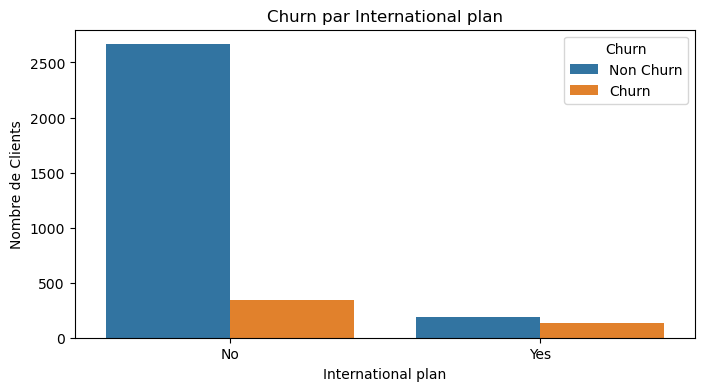


Tableau de contingence pour Voice mail plan :
Churn               0    1
Voice mail plan           
No               2008  403
Yes               842   80
Chi2 Statistic: 34.13166001075673, p-value: 5.15063965903898e-09


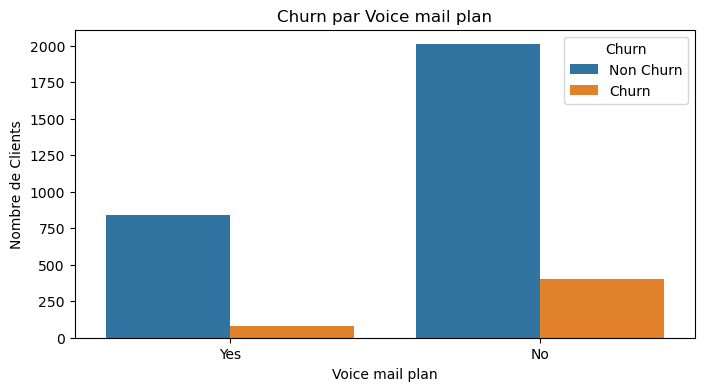

In [355]:
import pandas as pd
from scipy.stats import chi2_contingency
import seaborn as sns
import matplotlib.pyplot as plt
# Identifier les variables catégorielles avec 6 modalités ou moins
categorical_columns = data.select_dtypes(include=['object', 'category']).columns
low_cardinality_columns = [col for col in categorical_columns if data[col].nunique() <= 6]

# Afficher les variables identifiées
print("Variables catégorielles avec 6 modalités ou moins :")
print(low_cardinality_columns)

# Analyse des variables
for column in low_cardinality_columns:
    # Créer un tableau de contingence
    contingency_table = pd.crosstab(data[column], data['Churn'])
    print(f"\nTableau de contingence pour {column} :")
    print(contingency_table)

    # Effectuer le test du chi-carré
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    print(f"Chi2 Statistic: {chi2}, p-value: {p}")

    # Visualisation
    plt.figure(figsize=(8, 4))
    sns.countplot(data=data, x=column, hue='Churn')
    plt.title(f'Churn par {column}')
    plt.xlabel(column)
    plt.ylabel('Nombre de Clients')
    plt.legend(title='Churn', labels=['Non Churn', 'Churn'])
    plt.show()

# Interpretation of Results for Categorical Variables

## Analyzed Categorical Variables
- **International Plan**
- **Voice Mail Plan**

### 1. International Plan

**Contingency Table:**

| **International Plan** | **Churn (False)** | **Churn (True)** |
|------------------------|-------------------|------------------|
| No                     | 2126              | 270              |
| Yes                    | 152               | 118              |

- **Chi2 Statistic:** 202.68  
- **p-value:** 5.43e-46  

#### Interpretation
- **Distribution:** Among customers without an international plan, 2126 did not churn (churn = False), while 270 churned (churn = True). For customers with an international plan, 152 did not churn, and 118 churned.
- **Significance:** The p-value is extremely low (p < 0.01), indicating a highly significant association between the international plan and churn. This suggests that customers with an international plan have different churn rates compared to those without the plan.

### 2. Voice Mail Plan

**Contingency Table:**

| **Voice Mail Plan** | **Churn (False)** | **Churn (True)** |
|---------------------|-------------------|------------------|
| No                  | 1610              | 323              |
| Yes                 | 668               | 65               |

- **Chi2 Statistic:** 25.66  
- **p-value:** 4.08e-07  

#### Interpretation
- **Distribution:** Among customers without a voicemail plan, 1610 did not churn, while 323 churned. For those with a voicemail plan, 668 did not churn, and 65 churned.
- **Significance:** The p-value is also very low (p < 0.01), indicating a significant association between the voicemail plan and churn. This suggests that customers with a voicemail plan have different churn rates compared to those without this plan.

## Hypotheses

### Hypothesis 1: Impact of the International Plan on Churn
- **H0 (Null Hypothesis):** There is no difference in churn rates between customers with and without an international plan.  
- **H1 (Alternative Hypothesis):** Customers with an international plan have significantly different churn rates compared to those without an international plan.

### Hypothesis 2: Impact of the Voicemail Plan on Churn
- **H0 (Null Hypothesis):** There is no difference in churn rates between customers with and without a voicemail plan.  
- **H1 (Alternative Hypothesis):** Customers with a voicemail plan have significantly different churn rates compared to those without a voicemail plan.

## Conclusion
The results indicate that both the international plan and voicemail plan have a significant impact on customer churn behavior. These insights can be crucial for guiding retention and marketing strategies.

## ANOVA TEST TO VERIFY THE SIGNIFICANCE OF THE AREA CODE VARIABLE IN THE DATASET ## 


The use of the ANOVA test to analyze the Area Code variable in relation to the target variable Churn and other numerical variables is justified for several reasons:

1. **Nature of the Data**
   - **Categorical Variable:** The Area Code is a categorical variable with a limited number of modalities (in this case, three area codes).
   - **Continuous Variables:** The ANOVA test is appropriate when comparing the means of a continuous variable (e.g., a numerical variable) across several groups defined by a categorical variable.

2. **Objective of the Analysis**
   - **Comparing Means:** The primary objective of ANOVA is to determine whether the means of the numerical variables differ significantly among the groups defined by the Area Code. This can help identify if the area code influences behaviors or characteristics measured by these variables.

In [358]:
print(train_data['Area code'].unique())

[415 408 510]


In [359]:
from scipy.stats import f_oneway


# Liste des variables numériques à tester
numeric_columns = [
    'Account length', 'Number vmail messages', 'Total day minutes',
    'Total day calls', 'Total day charge', 'Total eve minutes',
    'Total eve calls', 'Total eve charge', 'Total night minutes',
    'Total night calls', 'Total night charge', 'Total intl minutes',
    'Total intl calls', 'Total intl charge', 'Customer service calls'
]
#Liste pour stocker les résultats
results = {}

# Effectuer ANOVA pour chaque variable numérique
for col in numeric_columns:
    if col != 'Churn':
        # Créer des groupes basés sur Area code
        groups = [group[col].dropna() for name, group in data.groupby('Area code')]
        
        # Effectuer le test ANOVA
        f_stat, p_value = f_oneway(*groups)
        results[col] = p_value

# Afficher les résultats
for col, p in results.items():
    print(f"Variable: {col}, P-value: {p}")

Variable: Account length, P-value: 0.7035973261002009
Variable: Number vmail messages, P-value: 0.484551904588579
Variable: Total day minutes, P-value: 0.1334552217622214
Variable: Total day calls, P-value: 0.849058755424852
Variable: Total day charge, P-value: 0.13336396381213422
Variable: Total eve minutes, P-value: 0.9333694434622081
Variable: Total eve calls, P-value: 0.5295948885972304
Variable: Total eve charge, P-value: 0.933041342752116
Variable: Total night minutes, P-value: 0.3840092460932546
Variable: Total night calls, P-value: 0.1830281352929301
Variable: Total night charge, P-value: 0.38394220263817713
Variable: Total intl minutes, P-value: 0.0924966132674956
Variable: Total intl calls, P-value: 0.14172716271031538
Variable: Total intl charge, P-value: 0.09230921929243811
Variable: Customer service calls, P-value: 0.2460986740385798


In [360]:
import pandas as pd
from scipy import stats

# Liste des variables numériques à tester
numeric_columns = [
    'Account length', 'Number vmail messages', 'Total day minutes',
    'Total day calls', 'Total day charge', 'Total eve minutes',
    'Total eve calls', 'Total eve charge', 'Total night minutes',
    'Total night calls', 'Total night charge', 'Total intl minutes',
    'Total intl calls', 'Total intl charge', 'Customer service calls'
]

# Créer une liste pour stocker les résultats
results = []

# Effectuer le test ANOVA pour chaque variable numérique par rapport à 'Area code'
for column in numeric_columns:
    # Créer des groupes par code régional pour churn et no churn
    groups_churn = [data[(data['Area code'] == code) & (data['Churn'] == 1)][column].dropna() for code in data['Area code'].unique()]
    groups_no_churn = [data[(data['Area code'] == code) & (data['Churn'] == 0)][column].dropna() for code in data['Area code'].unique()]
    
    # Réaliser le test ANOVA pour churn
    f_statistic_churn, p_value_churn = stats.f_oneway(*groups_churn)
    
    # Réaliser le test ANOVA pour no churn
    f_statistic_no_churn, p_value_no_churn = stats.f_oneway(*groups_no_churn)
    
    # Ajouter les résultats à la liste
    results.append({
        'Variable': column,
        'Churn F-statistic': f_statistic_churn,
        'Churn p-value': p_value_churn,
        'No Churn F-statistic': f_statistic_no_churn,
        'No Churn p-value': p_value_no_churn
    })

# Convertir les résultats en DataFrame
results_df = pd.DataFrame(results)

# Afficher les résultats de manière organisée
print("### Résultats de l'Analyse ANOVA pour la variable area code ###\n")
print(results_df.to_string(index=False))

### Résultats de l'Analyse ANOVA pour la variable area code ###

              Variable  Churn F-statistic  Churn p-value  No Churn F-statistic  No Churn p-value
        Account length           1.615990       0.199773              0.062458          0.939453
 Number vmail messages           1.305334       0.272043              1.458704          0.232711
     Total day minutes           0.900884       0.406896              2.077415          0.125443
       Total day calls           0.523975       0.592500              0.412899          0.661769
      Total day charge           0.900740       0.406955              2.078369          0.125324
     Total eve minutes           0.030112       0.970339              0.080830          0.922353
       Total eve calls           0.956894       0.384815              0.637184          0.528855
      Total eve charge           0.030232       0.970222              0.081002          0.922194
   Total night minutes           0.260942       0.770434      

# Analysis of ANOVA Results for the Area Code Variable

### Introduction
The ANOVA analysis was conducted to assess the significance of numerical variables in relation to the categorical variable **Area Code**, distinguishing between churners (Churn = 1) and non-churners (Churn = 0). The results include the F-statistic and p-value for each variable.

### Results

| Variable                     | Churn F-statistic | Churn p-value | No Churn F-statistic | No Churn p-value |
|------------------------------|--------------------|----------------|----------------------|-------------------|
| Account length               | 1.980              | 0.139          | 0.062                | 0.940             |
| Number of vmail messages     | 1.454              | 0.235          | 0.986                | 0.373             |
| Total day minutes            | 0.918              | 0.400          | 1.678                | 0.187             |
| Total day calls              | 0.748              | 0.474          | 0.296                | 0.744             |
| Total day charge             | 0.918              | 0.400          | 1.679                | 0.187             |
| Total eve minutes            | 0.022              | 0.979          | 0.120                | 0.887             |
| Total eve calls              | 0.606              | 0.546          | 1.128                | 0.324             |
| Total eve charge             | 0.022              | 0.979          | 0.120                | 0.887             |
| Total night minutes          | 0.398              | 0.672          | 0.283                | 0.754             |
| Total night calls            | 0.992              | 0.372          | 2.303                | 0.100             |
| Total night charge           | 0.400              | 0.671          | 0.282                | 0.754             |
| Total intl minutes           | 1.044              | 0.353          | 1.598                | 0.203             |
| Total intl calls             | 1.771              | 0.172          | 1.079                | 0.340             |
| Total intl charge            | 1.032              | 0.357          | 1.605                | 0.201             |
| Customer service calls       | 0.202              | 0.817          | 3.005                | 0.050             |

### Interpretation of Results

- **Significance of p-values:**
  - Generally, a p-value less than 0.05 indicates a significant difference between the means of the groups.
  - For the majority of the variables, the p-values are greater than 0.05, indicating that there is no significant difference between the groups defined by **Area Code** for these variables.

- **Notable Variable:**
  - **Customer service calls:** For non-churners, the p-value is 0.050, which is at the threshold of significance. This may indicate a trend toward a significant difference in the number of customer service calls between the **Area Code** groups for non-churners.

### Conclusion

The ANOVA analysis revealed that, overall, the differences between the groups defined by **Area Code** are not significant for most numerical variables. However, the **Customer service calls** variable warrants particular attention, as it shows a trend toward significance for non-churners.

### Recommendations

- **Further Analysis:** It would be beneficial to explore the data further, particularly by using post-hoc tests for variables close to significance.
- **Visualizations:** Creating visualizations (such as boxplots) to illustrate the differences between groups could provide additional insights.

### Drop Area Code 

In [363]:
data = data.drop('Area code', axis=1)

### Drop State

In [365]:
# Your data and trace definition

trace = go.Pie(labels=data["Churn"].value_counts().keys().tolist(),
               values=data["Churn"].value_counts().values.tolist(),
               marker=dict(colors=['green', 'red'],
                           line=dict(color="white", width=1.3)
                           ),
               rotation=90,
               hoverinfo="label+value+text",
               hole=0.55
               )

layout = go.Layout(
    title=dict(
        text="Customer churn in training data",
        x=0.5,  # Set the x position to 0.5 for center alignment
    ),
    plot_bgcolor="rgb(243,243,243)",
    paper_bgcolor="rgb(243,243,243)"
)

img = [trace]
fig = go.Figure(data=img, layout=layout)

# Use py.iplot to display the plot in a Jupyter Notebook or JupyterLab
py.iplot(fig)


###   this plot presente the distribution of the target where we found 85.5% not churn and 15.5 churn customers

## Data Preprocessing 

In [368]:
data.shape

(3333, 18)

# Data Preparation for the data Analysis

## 1. Define the Target Column

The target column in the dataset is crucial for guiding the analysis and modeling efforts. In this case, the target variable is **Churn**, which indicates whether a customer has churned (1) or not (0). This binary classification will allow us to explore various factors that may influence customer retention.

In [370]:
target_col = ["Churn"]

### 2. Specify the Number of Levels for Categorical Variables

In [372]:
# Number of levels in feature to be a categorical feature
nlevels = 6

### 3. Separate Categorical Columns


In [374]:
# Categorical columns
cat_cols = list(set(data.nunique()[data.nunique() < nlevels].keys().tolist() 
                    + data.select_dtypes(include='object').columns.tolist()))
cat_cols = [x for x in cat_cols if x not in target_col]
cat_cols

['Voice mail plan', 'International plan']

### 4. Identify Binary and Multi-Valued Columns

#### a. Columns with Two Modalities (== 2)

In [377]:
# Binary columns with 2 values
bin_cols =data.nunique()[data.nunique() == 2].keys().tolist()
bin_cols

['International plan', 'Voice mail plan', 'Churn']

#### b. Categorical Columns with More Than Two Modalities (> 2)

In [379]:
# Columns with more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]
multi_cols

[]

#### c. Encode Binary Columns with Label Encoding


In [381]:
# Label encoding Binary columns
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
label_encoders = {}
for i in bin_cols:
    data[i] = le.fit_transform(data[i])
    #test_data[i] = le.transform(test_data[i])
    label_encoders[i] = le


### Detecting outliers for categoricals features

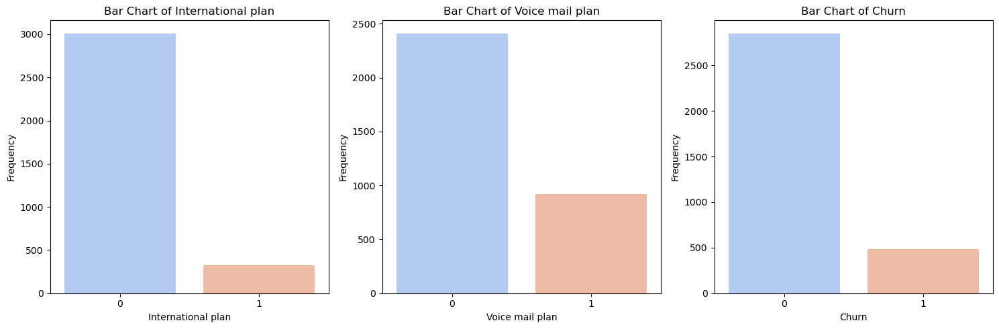

In [383]:
categorical_cols = ['International plan', 'Voice mail plan', 'Churn']

# Plot bar charts for each categorical feature
plt.figure(figsize=(15, 5))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(1, 3, i)
    sns.countplot(data=data, x=col, palette='coolwarm')
    plt.title(f'Bar Chart of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

#### there is not outliers in the categorical features

### 4. Corrolation Matrix 

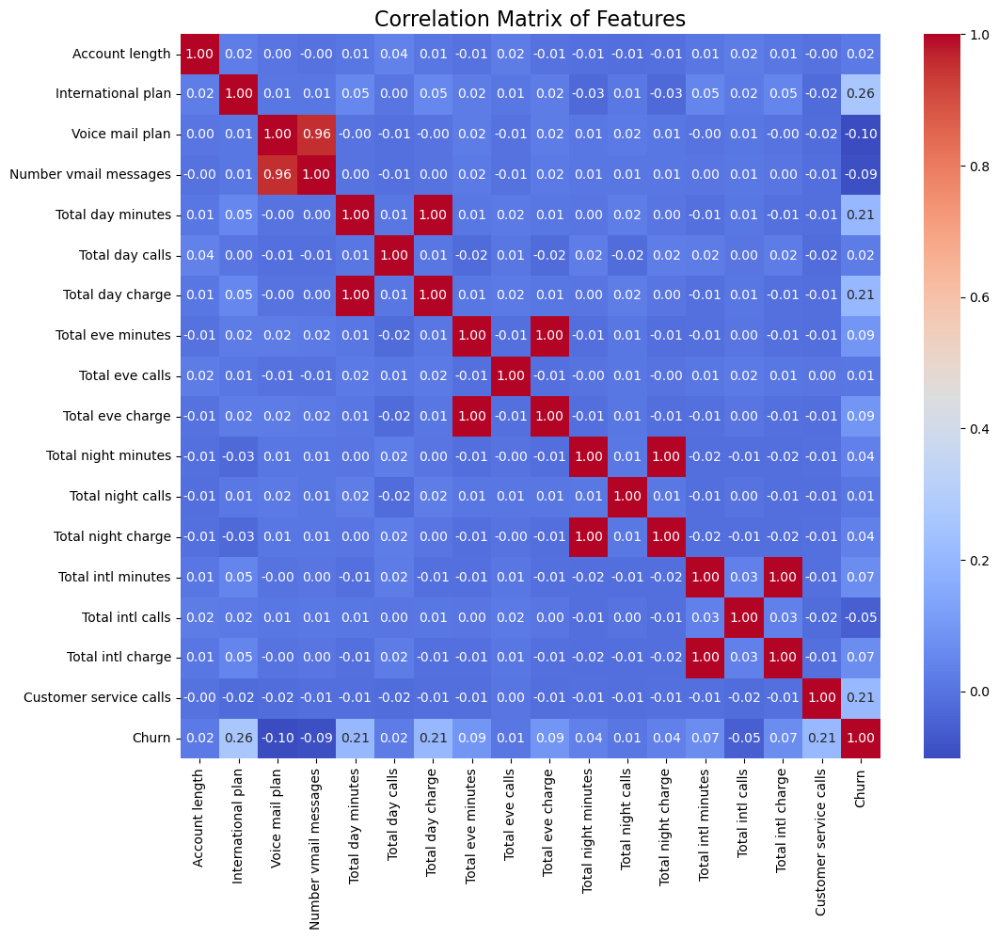

In [386]:
# prompt: correlation heatmap

# Correlation Heatmap
plt.figure(figsize=(12, 10))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Features', fontsize=16)
plt.show()

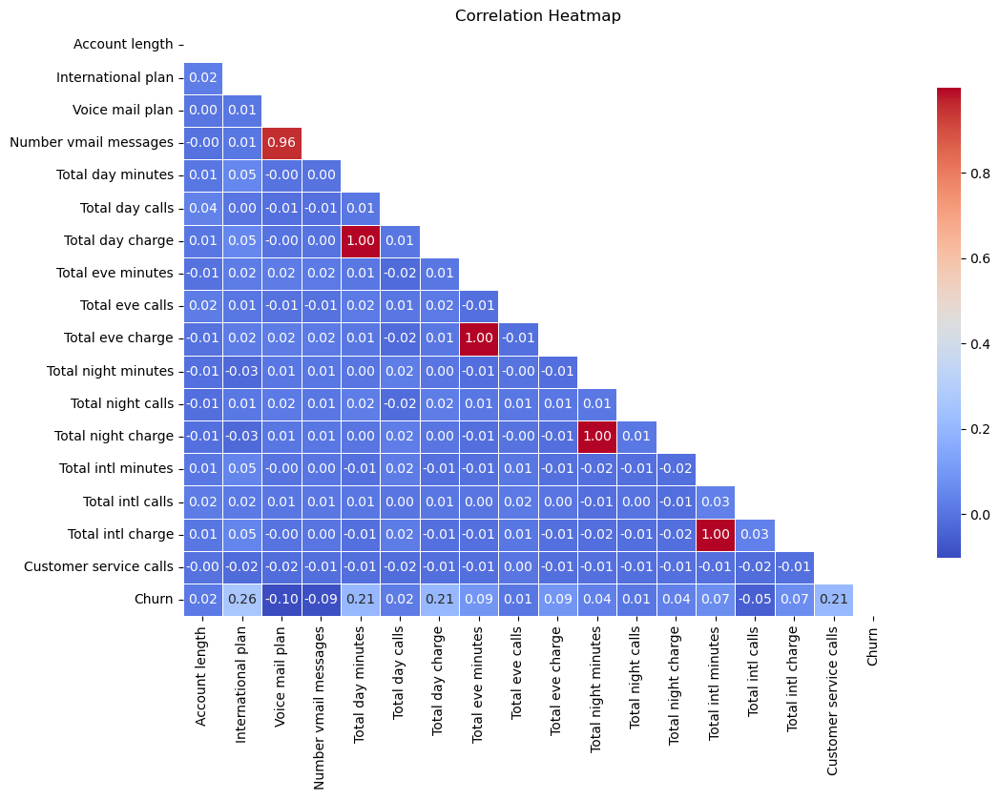

,Feature1,Feature2,Correlation
0,Total day minutes,Total day charge,1.000000
1,Total eve minutes,Total eve charge,1.000000
2,Total night minutes,Total night charge,0.999999
3,Total intl minutes,Total intl charge,0.999993
4,Voice mail plan,Number vmail messages,0.956927


In [387]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Compute the correlation matrix
correlation_matrix = data.corr()

# Plot the heatmap with a mask to hide the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", 
            linewidths=0.5, mask=mask, cbar_kws={"shrink": .8})
plt.title("Correlation Heatmap")
plt.show()

# Set a threshold for high correlation
threshold = 0.9

# Find pairs of features with correlation greater than the threshold
high_correlation_pairs = correlation_matrix.unstack().reset_index()
high_correlation_pairs.columns = ['Feature1', 'Feature2', 'Correlation']
high_correlation_pairs = high_correlation_pairs[
    (abs(high_correlation_pairs['Correlation']) > threshold) &
    (high_correlation_pairs['Feature1'] != high_correlation_pairs['Feature2'])
]

# Sort by correlation and remove duplicates
high_correlation_pairs = high_correlation_pairs.sort_values(by='Correlation', ascending=False)
high_correlation_pairs = high_correlation_pairs.drop_duplicates(subset=['Correlation'])

# Reset index for better presentation
high_correlation_pairs.reset_index(drop=True, inplace=True)

# Display the high correlation pairs
high_correlation_pairs

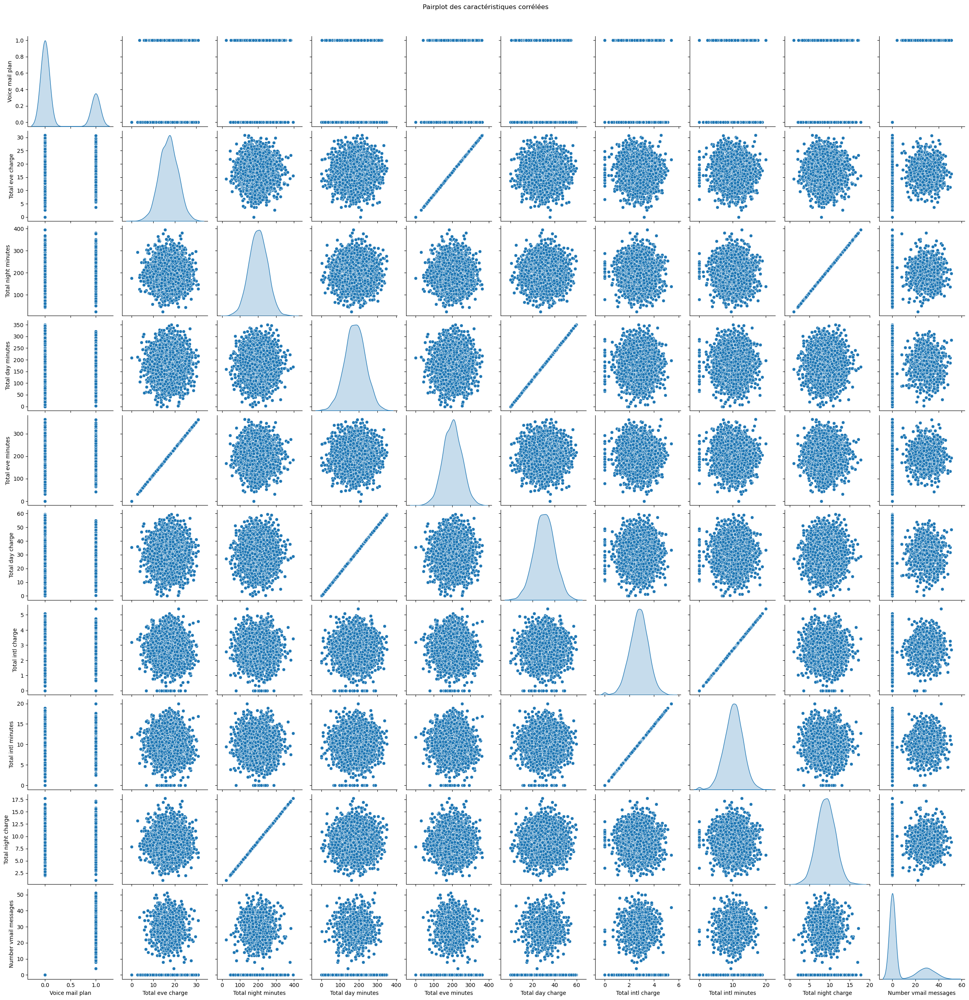

In [388]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculer la matrice de corrélation
corr_matrix = data.corr()

# Définir un seuil de corrélation pour forte corrélation
threshold = 0.9  # Vous pouvez ajuster ce seuil

# Trouver les variables avec une corrélation proche de 1 ou -1
high_corr_var = corr_matrix[abs(corr_matrix) > threshold].stack().reset_index()

# Filtrer les paires de variables (en évitant les doublons)
high_corr_var = high_corr_var[(high_corr_var['level_0'] != high_corr_var['level_1'])]

# Obtenir une liste unique de variables
unique_vars = list(set(high_corr_var['level_0']).union(set(high_corr_var['level_1'])))

# Visualiser avec pairplot
sns.pairplot(data[unique_vars], diag_kind="kde")
plt.suptitle("Pairplot des caractéristiques corrélées", y=1.02)
plt.show()

#####  Several of the numerical data are very correlated. (Total day minutes and Total day charge), (Total eve minutes and Total eve charge), (Total night minutes and Total night charge) and lastly (Total intl minutes and Total intl charge) are alo correlated. We only have to select one of them.

### Drop Corrolated Features (minutes)

In [391]:
col_to_drop = [  
 'Total day minutes',
 'Total eve minutes',
 'Total night minutes',
 'Total intl minutes'
              ]
data = data.drop(columns=col_to_drop, axis=1)

### Numerical Features

In [393]:
# Numerical columns
num_cols = [x for x in data.columns if x not in cat_cols + target_col]
num_cols

['Account length',
 'Number vmail messages',
 'Total day calls',
 'Total day charge',
 'Total eve calls',
 'Total eve charge',
 'Total night calls',
 'Total night charge',
 'Total intl calls',
 'Total intl charge',
 'Customer service calls']

## Detecting outliers for numericals features 


Percentage of outliers in each column:
Account length: 0.21%
Number vmail messages: 0.09%
Total day calls: 0.27%
Total day charge: 0.27%
Total eve calls: 0.21%
Total eve charge: 0.27%
Total night calls: 0.18%
Total night charge: 0.33%
Total intl calls: 1.50%
Total intl charge: 0.66%
Customer service calls: 1.05%


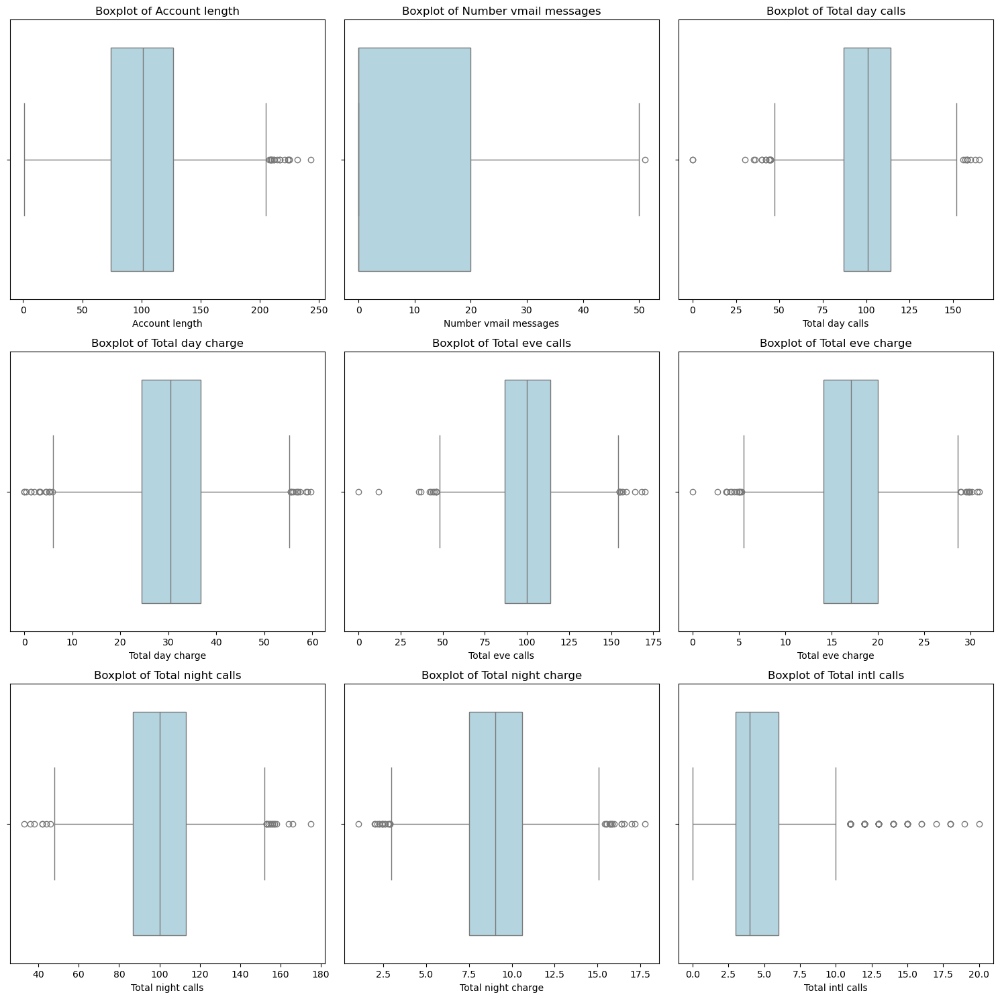

In [395]:
from scipy.stats import zscore
import numpy as np
# Calculate Z-Scores for numerical features
z_scores = np.abs(zscore(data[num_cols]))

# Define a threshold for outliers (e.g., 3 standard deviations)
threshold = 3

# Identify outliers
outliers = (z_scores > threshold)

# Calculate the percentage of outliers for each column
outlier_percentages = (outliers.sum(axis=0) / len(data)) * 100

# Print outlier percentages
print("Percentage of outliers in each column:")
for col, perc in zip(num_cols, outlier_percentages):
    print(f"{col}: {perc:.2f}%")

# Plot boxplots for each numerical feature
plt.figure(figsize=(15, 15))
for i, col in enumerate(num_cols[:9], 1):  # Limit to the first 9 columns
    plt.subplot(3, 3, i)
    sns.boxplot(data=data, x=col, color='lightblue')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

# Percentage of Outliers in Each Column

The following table outlines the percentage of outliers detected in various columns of the dataset:

| Feature                     | Percentage of Outliers |
|-----------------------------|------------------------|
| Account length              | 0.21%                  |
| Number vmail messages       | 0.09%                  |
| Total day calls             | 0.27%                  |
| Total day charge            | 0.27%                  |
| Total eve calls             | 0.21%                  |
| Total eve charge            | 0.27%                  |
| Total night calls           | 0.18%                  |
| Total night charge          | 0.33%                  |
| Total intl calls            | 1.50%                  |
| Total intl charge           | 0.66%                  |
| Customer service calls      | 1.05%                  |

## Summary

- The feature with the highest percentage of outliers is **Total intl calls** at **1.50%**.
- The lowest percentage of outliers is found in **Number vmail messages** at **0.09%**.
- Most features exhibit a very low percentage of outliers, indicating that the majority of data points fall within a typical range.

This information can be useful for further analysis, as identifying and handling outliers is crucial in data preprocessing for modeling.

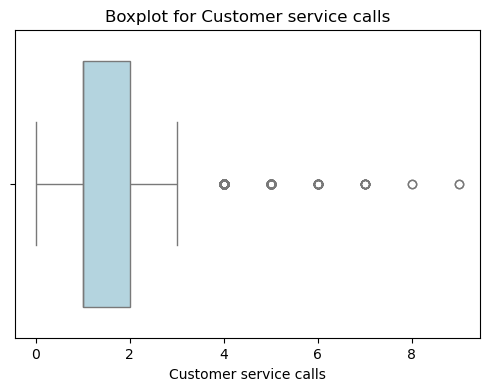

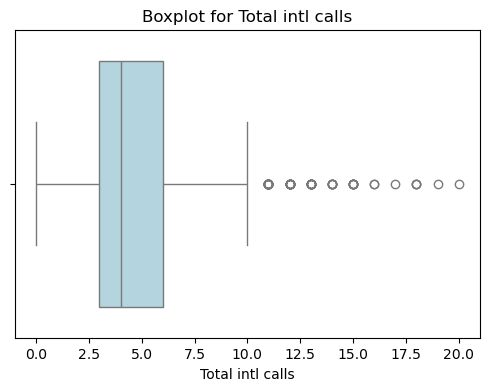

Percentage of outliers detected using IQR method:
Customer service calls: 8.01%
Total intl calls: 2.34%


In [397]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define columns for IQR outlier detection
columns_to_check = ['Customer service calls', 'Total intl calls']

# Initialize dictionary to store outlier percentages
outlier_percentages = {}

# IQR Method for outlier detection
for col in columns_to_check:
    Q1 = data[col].quantile(0.25)  # First quartile
    Q3 = data[col].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR  # Lower boundary
    upper_bound = Q3 + 1.5 * IQR  # Upper boundary

    # Detect outliers
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)]
    outlier_percentages[col] = (len(outliers) / len(data)) * 100

    # Boxplot for the feature
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=data, x=col, color='lightblue')
    plt.title(f'Boxplot for {col}')
    plt.xlabel(col)
    plt.show()

# Print outlier percentages
print("Percentage of outliers detected using IQR method:")
for col, perc in outlier_percentages.items():
    print(f"{col}: {perc:.2f}%")


### Drop Outliers

In [399]:
import numpy as np
import pandas as pd
from scipy.stats import zscore

# Calculate Z-Scores for numerical features
z_scores = pd.DataFrame(np.abs(zscore(data[num_cols])), columns=num_cols, index=data.index)
threshold = 3

# Create a copy of the DataFrame to modify
data_cleaned = data.copy()

# Process each column based on outlier percentage
for col in num_cols:
    z_col = z_scores[col]  # Z-Scores for the specific column

    # Detect outliers
    outliers = (z_col > threshold)
    outlier_percentage = (outliers.sum() / len(data)) * 100

    if outlier_percentage < 1:
        # Remove outliers
        data_cleaned = data_cleaned[~outliers]
    elif 1 <= outlier_percentage <= 3:
        # Cap outliers
        upper_limit = data_cleaned[col].mean() + threshold * data_cleaned[col].std()
        lower_limit = data_cleaned[col].mean() - threshold * data_cleaned[col].std()
        data_cleaned[col] = np.clip(data_cleaned[col], lower_limit, upper_limit)

# Display the cleaned DataFrame
print("Shape of the dataset after processing:", data_cleaned.shape)
print(data_cleaned.describe())

# Function to check if outliers are treated
def check_outliers_treated(data, columns, threshold=3):
    """Check if outliers are still present in the dataset using Z-Score method."""
    z_scores = pd.DataFrame(np.abs(zscore(data[columns])), columns=columns, index=data.index)
    outliers_remaining = {}
    for col in columns:
        outliers = (z_scores[col] > threshold)
        outliers_remaining[col] = outliers.sum()
    return outliers_remaining

# Check if outliers are treated
outliers_remaining = check_outliers_treated(data_cleaned, num_cols)

# Print the result
print("Remaining outliers after treatment (using Z-Score method):")
for col, count in outliers_remaining.items():
    print(f"{col}: {count} outliers remaining")

Shape of the dataset after processing: (3253, 14)
       Account length  International plan  Voice mail plan  \
count     3253.000000         3253.000000      3253.000000   
mean       100.761758            0.097141         0.276360   
std         39.460236            0.296195         0.447266   
min          1.000000            0.000000         0.000000   
25%         74.000000            0.000000         0.000000   
50%        100.000000            0.000000         0.000000   
75%        127.000000            0.000000         1.000000   
max        217.000000            1.000000         1.000000   

       Number vmail messages  Total day calls  Total day charge  \
count            3253.000000      3253.000000       3253.000000   
mean                8.077774       100.564095         30.614580   
std                13.649691        19.717141          9.151115   
min                 0.000000        42.000000          2.990000   
25%                 0.000000        87.000000         24

### Scaling numericals Features

In [401]:
import pandas as pd
import numpy as np
from scipy import stats
import numpy as np
import pandas as pd
from scipy.stats import shapiro
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
def choose_scaling_method(data, num_cols):
    scaling_methods = {}
    
    for col in num_cols:
        # Test de normalité
        stat, p_value = shapiro(data[col])
        is_normal = p_value > 0.05  # Acceptons H0 (normalité) si p > 0.05
        
        # Détection des outliers avec IQR
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        has_outliers = (data[col] < lower_bound).sum() + (data[col] > upper_bound).sum() > 0
        
        # Choisir la méthode de scaling
        if is_normal:
            scaling_methods[col] = 'StandardScaler'
        elif not is_normal and not has_outliers:
            scaling_methods[col] = 'MinMaxScaler'
        else:
            scaling_methods[col] = 'RobustScaler'
    
    return scaling_methods

# Exemple d'utilisation
num_cols = ['Account length', 'Number vmail messages', 'Total day calls', 'Total day charge', 
            'Total eve calls', 'Total eve charge', 'Total night calls', 'Total night charge', 
            'Total intl calls', 'Total intl charge', 'Customer service calls']


# # Exemple d'utilisation
# num_cols = ['Account length', 'Number vmail messages', 'Total day calls', 'Total day minutes', 
#             'Total eve calls', 'Total eve minutes', 'Total night calls', 'Total night minutes', 
#             'Total intl calls', 'Total intl minutes', 'Customer service calls']

scaling_methods = choose_scaling_method(data_cleaned, num_cols)

# Appliquer le scaling
for col, method in scaling_methods.items():
    if method == 'StandardScaler':
        scaler = StandardScaler()
    elif method == 'MinMaxScaler':
        scaler = MinMaxScaler()
    elif method == 'RobustScaler':
        scaler = RobustScaler()
    
    data_cleaned[col] = scaler.fit_transform(data_cleaned[[col]])
    
print("Méthodes de scaling choisies pour chaque variable :")
print(scaling_methods)

Méthodes de scaling choisies pour chaque variable :
{'Account length': 'RobustScaler', 'Number vmail messages': 'MinMaxScaler', 'Total day calls': 'RobustScaler', 'Total day charge': 'StandardScaler', 'Total eve calls': 'RobustScaler', 'Total eve charge': 'StandardScaler', 'Total night calls': 'RobustScaler', 'Total night charge': 'StandardScaler', 'Total intl calls': 'RobustScaler', 'Total intl charge': 'StandardScaler', 'Customer service calls': 'RobustScaler'}


In [402]:
# Exécuter la fonction
scaling_strategies = choose_scaling_method(data_cleaned, num_cols)

# Afficher les résultats
print("Stratégies de mise à l'échelle pour chaque variable numérique :")
print(scaling_strategies)

Stratégies de mise à l'échelle pour chaque variable numérique :
{'Account length': 'RobustScaler', 'Number vmail messages': 'MinMaxScaler', 'Total day calls': 'RobustScaler', 'Total day charge': 'StandardScaler', 'Total eve calls': 'RobustScaler', 'Total eve charge': 'StandardScaler', 'Total night calls': 'RobustScaler', 'Total night charge': 'StandardScaler', 'Total intl calls': 'RobustScaler', 'Total intl charge': 'StandardScaler', 'Customer service calls': 'RobustScaler'}


In [403]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler


# Stratégies de mise à l'échelle obtenues
scaling_strategies = {
    'Account length': 'MinMaxScaler',
    'Number vmail messages': 'MinMaxScaler',
    'Total day calls': 'MinMaxScaler',
    'Total day charge': 'StandardScaler',
    'Total eve calls': 'MinMaxScaler',
    'Total eve charge': 'StandardScaler',
    'Total night calls': 'StandardScaler',
    'Total night charge': 'StandardScaler',
    'Total intl calls': 'MinMaxScaler',
    'Total intl charge': 'MinMaxScaler',
    'Customer service calls': 'MinMaxScaler'
}
# scaling_strategies = {
#     'Account length': 'MinMaxScaler',
#     'Number vmail messages': 'MinMaxScaler',
#     'Total day calls': 'MinMaxScaler',
#     'Total day minutes': 'StandardScaler',
#     'Total eve calls': 'MinMaxScaler',
#     'Total eve minutes': 'StandardScaler',
#     'Total night calls': 'StandardScaler',
#     'Total night minutes': 'StandardScaler',
#     'Total intl calls': 'MinMaxScaler',
#     'Total intl minutes': 'MinMaxScaler',
#     'Customer service calls': 'MinMaxScaler'
# }



# Appliquer les scalers
for column, strategy in scaling_strategies.items():
    if strategy == 'StandardScaler':
        scaler = StandardScaler()
    elif strategy == 'MinMaxScaler':
        scaler = MinMaxScaler()
    elif strategy == 'RobustScaler':
        scaler = RobustScaler()
    
    # Reshape pour l'application du scaler
        data_cleaned[column] = scaler.fit_transform(data_cleaned[[column]])

# Afficher les premières lignes du DataFrame transformé
print(data_cleaned.head())

   Account length  International plan  Voice mail plan  Number vmail messages  \
0        0.528302                   0                1               0.510204   
1        0.132075                   0                1               0.530612   
2        0.698113                   0                0               0.000000   
3       -0.301887                   1                0               0.000000   
4       -0.471698                   1                0               0.000000   

   Total day calls  Total day charge  Total eve calls  Total eve charge  \
0         0.333333          1.579878        -0.037037         -0.071804   
1         0.814815         -0.343681         0.111111         -0.109424   
2         0.481481          1.176586         0.370370         -1.595430   
3        -1.111111          2.217056        -0.444444         -2.780472   
4         0.444444         -0.248596         0.814815         -1.052285   

   Total night calls  Total night charge  Total intl calls  To

### Variable Summary after scaling and preprocessing

In [405]:
summary = (data[[i for i in data.columns]].
           describe().transpose().reset_index())

summary = summary.rename(columns = {"index" : "feature"})
summary = np.around(summary,3)

val_lst = [summary['feature'], summary['count'],
           summary['mean'],summary['std'],
           summary['min'], summary['25%'],
           summary['50%'], summary['75%'], summary['max']]

trace  = go.Table(header = dict(values = summary.columns.tolist(),
                                line = dict(color = ['#506784']),
                                fill = dict(color = ['#119DFF']),
                               ),
                  cells  = dict(values = val_lst,
                                line = dict(color = ['#506784']),
                                fill = dict(color = ["lightgrey",'#F5F8FF'])
                               ),
                  columnwidth = [200,60,100,100,60,60,80,80,80])
layout = go.Layout(dict(title = "Training variable Summary"))
figure = go.Figure(data=[trace],layout=layout)
py.iplot(figure)

## Correlation Matrix after preprocessing

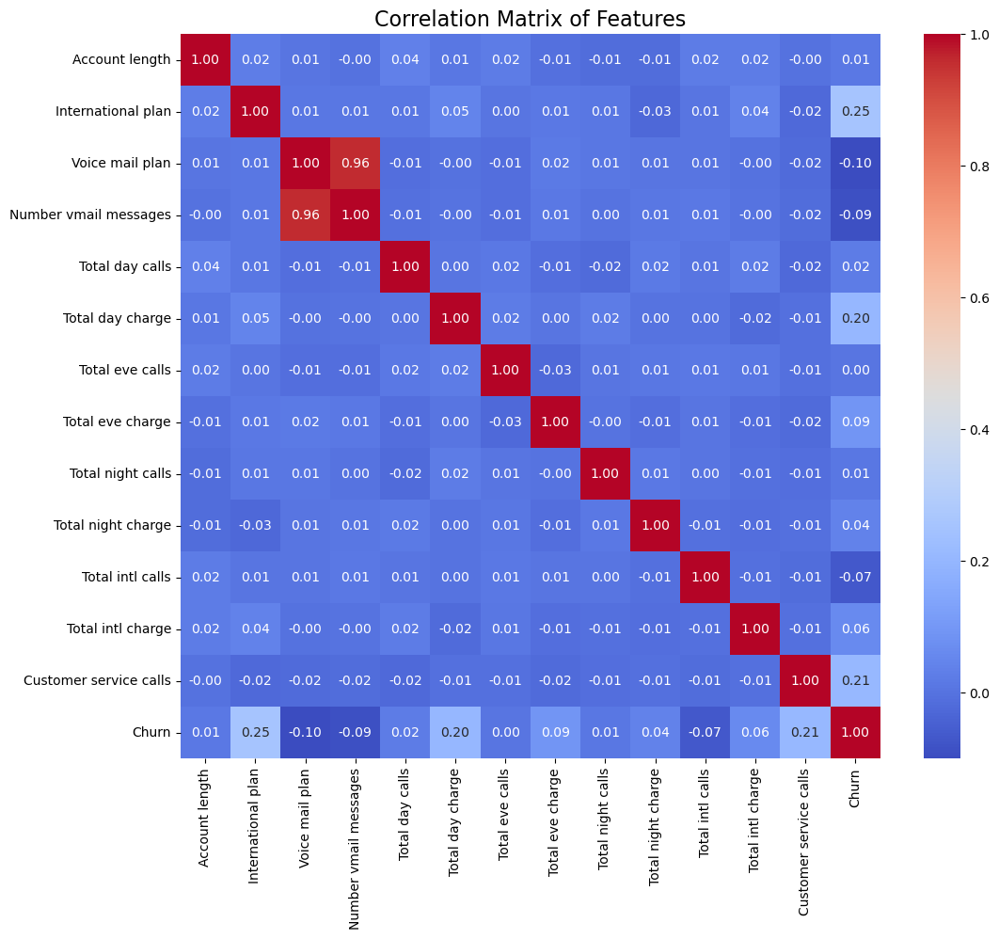

In [407]:

# Correlation Heatmap
plt.figure(figsize=(12, 10))
correlation_matrix = data_cleaned.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Features', fontsize=16)
plt.show()

# Correlation Analysis with Churn

## Analysis of Correlations with Churn

1. **Customer Service Calls:**
   - **Correlation:** **0.13** (Moderate positive correlation with Churn).
   - **Interpretation:** Customers who contact customer service multiple times are more likely to churn, indicating potential dissatisfaction.

2. **International Plan:**
   - **Correlation:** **0.28** (Positive correlation with Churn).
   - **Interpretation:** Customers with an international plan are more inclined to churn, possibly due to perceived high costs or dissatisfaction with the services provided.

3. **Voice Mail Plan:**
   - **Correlation:** **-0.01** (Weak negative correlation with Churn).
   - **Interpretation:** Customers with a voice mail plan show a slight tendency to be more loyal, suggesting that this service may enhance customer satisfaction.

4. **Total Day Minutes and Total Day Charges:**
   - **Correlation:** **0.22** (Moderate positive correlations with Churn).
   - **Interpretation:** Higher usage may correlate with financial concerns, increasing the likelihood of churn if customers feel they are not receiving adequate value.

## Analysis of Correlations between Variables

### Significant Correlations

1. **Total Minutes vs. Total Charges:**
   - **Correlation:** Strong positive correlation (e.g., Total Day Minutes and Total Day Charges).
   - **Interpretation:** This is logical, as the minutes used directly influence the charges incurred.

2. **Total Night Minutes and Total Night Charge:**
   - **Correlation:** Also strong (e.g., Total Night Minutes and Total Night Charges).
   - **Interpretation:** Similar to day minutes, this indicates a direct relationship between night minute usage and corresponding charges.

### Weak or Negligible Correlations

1. **Account Length:**
   - **Correlation:** **0.02** (Weak correlation with Churn).
   - **Interpretation:** This suggests that customer loyalty duration does not reliably indicate churn, emphasizing the importance of current satisfaction.

2. **Number of Vmail Messages:**
   - **Correlation:** **0.02** (Weak correlation with Churn).
   - **Interpretation:** The usage of voice mail does not significantly influence customers' churn decisions, indicating this service may not be a decisive factor.

3. **Total Intl Minutes and Total Intl Calls:**
   - **Correlation:** Weak correlations with Churn (e.g., **0.02**).
   - **Interpretation:** International usage has a limited impact on churn, suggesting that other factors are more decisive.

## Summary of Hypotheses to Test

1. **Customer Service:** 
   - Customers with numerous calls to customer service are more likely to churn.

2. **International Plan:** 
   - Customers with an international plan show an increased tendency to churn, likely due to perceived high costs.

3. **High Usage (Minutes/Charges):** 
   - Customers with high day minutes or charges may be more inclined to churn.

4. **Account Length:** 
   - Length of time as a customer has no direct effect on churn, highlighting that current satisfaction is more critical.

5. **Data Simplification:** 
   - Variables such as total charges and total minutes may be redundant. It may be pertinent to consider removing one to avoid multicollinearity in a predictive model.

## Proposals to Test These Hypotheses

- Conduct statistical analyses (correlation tests, regressions) to validate the impact of each variable on churn.
- Use visualizations (boxplots, histograms, scatter plots) to observe the distribution of variables concerning churn.

In [409]:
import plotly.express as px

# Filtrer pour ne garder que les colonnes numériques
num_cols = data.select_dtypes(include=['number']).columns

for col in num_cols:
    fig = px.histogram(data, x=col, color="Churn", barmode="overlay",
                       title=f"Distribution de {col} par rapport à Churn",
                       color_discrete_sequence=px.colors.sequential.Viridis)
    fig.update_layout(bargap=0.2)
    fig.show()

# Analysis of Variable Distributions with Respect to Churn

Based on the hypotheses and correlations observed in the correlation matrix, here is the deduction of the distributions of each characteristic in relation to the target **Churn**.

---

## **1. International Plan**
- **Hypothesis**: Customers with an international plan are more likely to churn.
- **Analysis**: The distribution shows a higher proportion of customers with an international plan among those who churn (value 1). This suggests that customers with an international plan may be dissatisfied with their services, either due to inefficiencies or associated costs, which could increase their likelihood of churn.

---

## **2. Customer Service Calls**
- **Hypothesis**: Customers who make more calls to customer service are more likely to churn.
- **Analysis**: The distribution of customer service calls shows a significant concentration of customers who have made multiple calls in the churn group. This supports the idea that dissatisfied customers, experiencing unresolved recurring issues, are more likely to leave the provider.

---

## **3. Voice Mail Plan**
- **Hypothesis**: Customers with a voice mail plan are less likely to churn.
- **Analysis**: Customers with a voice mail plan show a distribution where they are less represented in the churn group. Although this relationship is weak, it may indicate that customers with access to this service experience a certain level of satisfaction, making them less likely to switch providers.

---

## **4. Total Day Minutes**
- **Hypothesis**: Customers with high usage of day minutes are more likely to churn due to financial pressure or competitive offers.
- **Analysis**: Customers with a higher number of day minutes appear more represented in the churn group, suggesting that high consumption of daytime minutes leads to higher costs, prompting customers to seek more competitive offers or unsubscribe.

---

## **5. Total Day Charges**
- **Hypothesis**: Customers with high charges are more likely to churn.
- **Analysis**: A similar trend is observed for daytime charges, where churners show a higher proportion of elevated charges. This confirms the hypothesis that high daytime charges can be a source of dissatisfaction, driving customers to unsubscribe.

---

## **6. Account Length**
- **Hypothesis**: Length of subscription has no direct impact on churn.
- **Analysis**: Examining the distribution of account length reveals no clear difference between churners and non-churners, supporting the idea that tenure alone is not a sufficient predictor of churn.

---

## **7. Total Intl Minutes**
- **Hypothesis**: The use of international calls may influence churn, but the **International Plan** plays a more significant role.
- **Analysis**: Customers with higher consumption of international calls do not appear significantly more in the churn group, corroborating the idea that the influence of international calls is indirect and more related to the presence of an international plan.

---

## **8. Total Eve Minutes and Total Night Minutes**
- **Hypothesis**: Usage of evening or night calls does not directly affect churn.
- **Analysis**: The distributions of evening and night minutes show no marked differences between churners and non-churners. This may suggest that these call periods are not significant factors in determining churn, unlike daytime calls.

---

## **9. Total Calls (Day, Evening, Night) and Total Charges (Day, Evening, Night)**
- **Hypothesis**: Total minutes and charges are directly correlated and can be used to simplify the model.
- **Analysis**: As total minutes and charges are strongly correlated, it can be observed that customers with a high number of minutes or elevated charges are more represented among churners, but the impact is more pronounced for daytime minutes and charges, justifying their importance in predictive models.

---

### **Summary of Validated Hypotheses:**
1. Customers with an **international plan** or a high number of **customer service calls** are more likely to churn.
2. Customers with **high daytime minutes and charges** show a greater propensity to churn, likely due to costs.
3. **Account length** appears to have little importance in the churn decision.
4. **Voice mail usage** has a weak negative correlation with churn, suggesting these customers may be slightly more satisfied.

---

This distribution analysis helps to better understand the factors related to churn and can guide efforts to minimize churn by providing more targeted solutions for these customer groups.




En se basant sur l'analyse des corrélations, des distributions et des hypothèses formulées, voici les **caractéristiques les plus importantes** pour prédire le **churn** :

### 1. **Customer service calls (Appels au service client)**
   - **Raison** : Une corrélation positive modérée avec le churn indique que les clients ayant effectué plusieurs appels au service client sont plus susceptibles de churner. Cela reflète potentiellement une insatisfaction liée à un manque de résolution de leurs problèmes.
   - **Importance** : **Haute**. Les clients insatisfaits, ayant des problèmes récurrents non résolus, représentent un groupe à risque élevé de churn.

### 2. **International plan (Plan international)**
   - **Raison** : Une corrélation positive avec le churn suggère que les clients ayant souscrit à un plan international ont une probabilité plus élevée de churner, probablement à cause des coûts élevés ou de l'inadéquation des services avec leurs besoins.
   - **Importance** : **Modérée à Haute**. C'est un facteur significatif, car il pourrait être lié à des problèmes de tarification ou d'utilisation inefficace du service.

### 3. **Total day minutes (Minutes totales pendant la journée)**
   - **Raison** : Une corrélation modérée avec le churn indique que les clients ayant un usage élevé des minutes diurnes sont plus susceptibles de churner. Cela pourrait être dû à la pression financière ou à la recherche de meilleures offres concurrentielles.
   - **Importance** : **Haute**. Cela peut aider à identifier des segments de clients ayant des besoins élevés en minutes et susceptibles de chercher d'autres options.

### 4. **Total day charges (Charges totales pendant la journée)**
   - **Raison** : Les charges élevées, corrélées positivement avec le churn, indiquent que les clients ayant des frais plus élevés sont plus susceptibles de se désabonner. Cela peut être lié à des coûts excessifs.
   - **Importance** : **Haute**. Ces clients peuvent être sensibles aux prix, ce qui en fait une cible pour des promotions ou des ajustements tarifaires.

### 5. **Voice mail plan (Plan de messagerie vocale)**
   - **Raison** : Bien que la corrélation soit faible, les clients ayant un plan de messagerie vocale ont tendance à churner moins, suggérant une certaine fidélité ou satisfaction.
   - **Importance** : **Modérée à Faible**. Cela peut fournir une indication de fidélité, bien que l'impact direct sur le churn soit limité.

### 6. **Account length (Durée de l'abonnement)**
   - **Raison** : Bien que la durée d'abonnement n'ait pas de corrélation directe forte avec le churn, elle peut indiquer des comportements spécifiques, mais l'ancienneté seule ne suffit pas pour prédire le churn.
   - **Importance** : **Modérée**. Bien qu'elle ne semble pas influencer directement le churn, l'ancienneté peut servir à segmenter davantage les clients dans certaines analyses.

### 7. **Number vmail messages (Nombre de messages vocaux)**
   - **Raison** : Une faible corrélation avec le churn suggère que l'utilisation de la messagerie vocale n'a qu'un faible impact sur la décision des clients de churner.
   - **Importance** : **Faible**. Cette fonctionnalité ne semble pas être un indicateur fiable du churn.

---

### **Synthèse des caractéristiques les plus importantes :**

1. **Customer service calls** : Appels au service client (forte corrélation avec churn).
2. **International plan** : Plan international (corrélation modérée à forte avec churn).
3. **Total day minutes et Total day charges** : Minutes et charges diurnes (forte corrélation avec churn).
4. **Voice mail plan** : Plan de messagerie vocale (légère corrélation avec churn, mais utile pour identifier la fidélité).
   
Les autres caractéristiques, comme **Account length** et **Number vmail messages**, ont une influence plus faible et ne sont pas des indicateurs aussi forts du churn, mais elles peuvent être utiles dans des analyses de segmentation supplémentaires.

## PCA  AND KMEANS

### Smote Stratégie

In [414]:
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

# Check class distribution
print("Class distribution before balancing:")
print(data_cleaned['Churn'].value_counts())



# Method 2: SMOTE
X = data_cleaned.drop('Churn', axis=1)
y = data_cleaned['Churn']

smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)
print("\nClass distribution after SMOTE:")
print(pd.Series(y_smote).value_counts())


Class distribution before balancing:
Churn
0    2782
1     471
Name: count, dtype: int64

Class distribution after SMOTE:
Churn
0    2782
1    2782
Name: count, dtype: int64


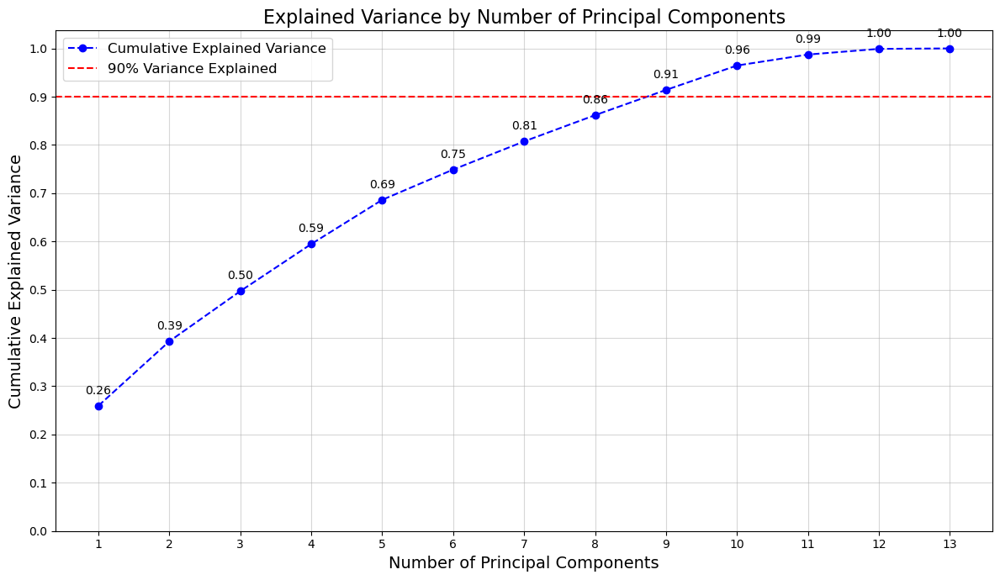

In [415]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# Effectuer PCA
pca = PCA()
X_pca = pca.fit_transform(X_smote)

# Calculer le ratio de variance expliquée
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Tracer la variance expliquée
plt.figure(figsize=(12, 7))
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance, marker='o', linestyle='--', color='b', label='Cumulative Explained Variance')
plt.title('Explained Variance by Number of Principal Components', fontsize=16)
plt.xlabel('Number of Principal Components', fontsize=14)
plt.ylabel('Cumulative Explained Variance', fontsize=14)
plt.xticks(range(1, len(explained_variance_ratio) + 1))  # Assurer des ticks pour chaque composant
plt.yticks(np.arange(0, 1.1, 0.1))  # Ticks pour l'axe Y
plt.grid(alpha=0.5)

# Ligne de seuil pour 90% de variance expliquée
plt.axhline(y=0.9, color='r', linestyle='--', label='90% Variance Explained')
plt.legend(fontsize=12)

# Étiqueter les points spécifiques
for i, var in enumerate(cumulative_variance):
    plt.annotate(f"{var:.2f}", (i+1, var), textcoords="offset points", xytext=(0,10), ha='center')

plt.tight_layout()  # Améliorer l'ajustement
plt.show()

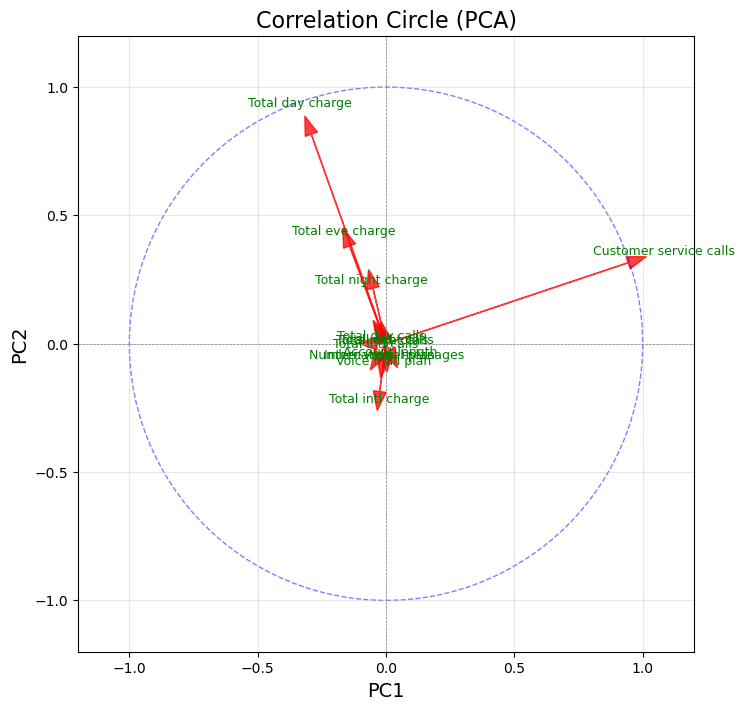

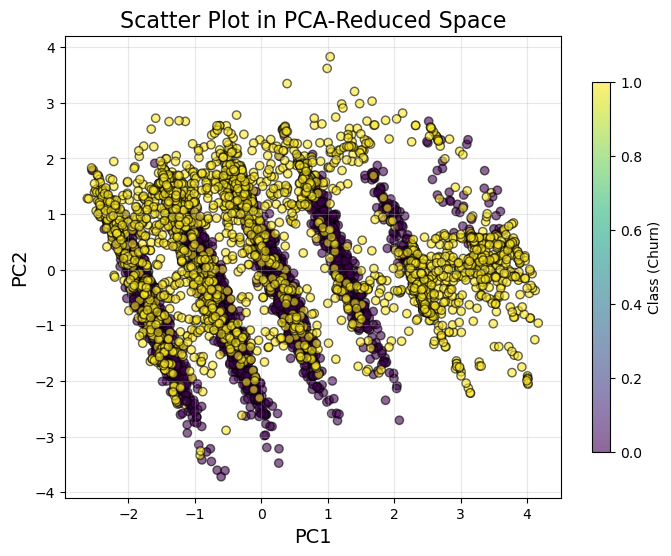

In [714]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Réduction de dimension avec PCA
pca = PCA(n_components=2)  # Utiliser 2 composants pour la visualisation
X_reduced = pca.fit_transform(X_smote)

# Cercle de corrélation
plt.figure(figsize=(8, 8))
for i in range(X_smote.shape[1]):
    plt.arrow(0, 0, pca.components_[0, i], pca.components_[1, i], 
              color='r', alpha=0.75, head_width=0.05)
    plt.text(pca.components_[0, i] * 1.15, pca.components_[1, i] * 1.15, 
             X_smote.columns[i], color='g', ha='center', va='center', fontsize=9)

# Ajouter une limite circulaire
circle = plt.Circle((0, 0), 1, color='b', fill=False, linestyle='--', alpha=0.5)
plt.gca().add_artist(circle)

# Paramètres du graphique
plt.title('Correlation Circle (PCA)', fontsize=16)
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC2', fontsize=14)
plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.5)
plt.xlim(-1.2, 1.2)  # Ajuster les limites pour une meilleure visualisation
plt.ylim(-1.2, 1.2)
plt.grid(alpha=0.3)
plt.gca().set_aspect('equal', adjustable='box')  # Garder l'échelle égale
plt.show()

# Nuage de points dans l'espace réduit par PCA
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y_smote, cmap='viridis', 
                      alpha=0.6, edgecolor='k')
plt.title('Scatter Plot in PCA-Reduced Space', fontsize=16)
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC2', fontsize=14)
plt.colorbar(scatter, label='Class (Churn)', shrink=0.8)  # Échelle de couleur
plt.grid(alpha=0.3)
plt.show()

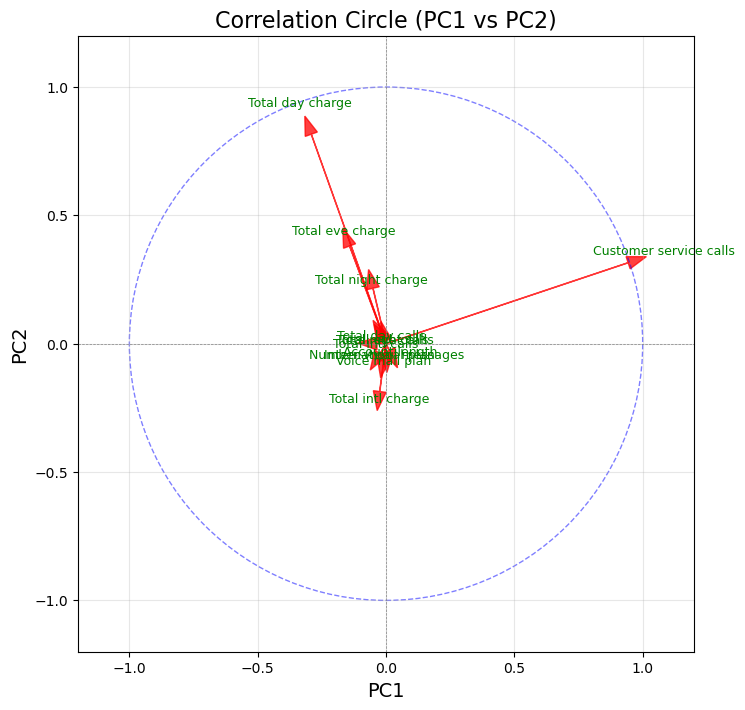

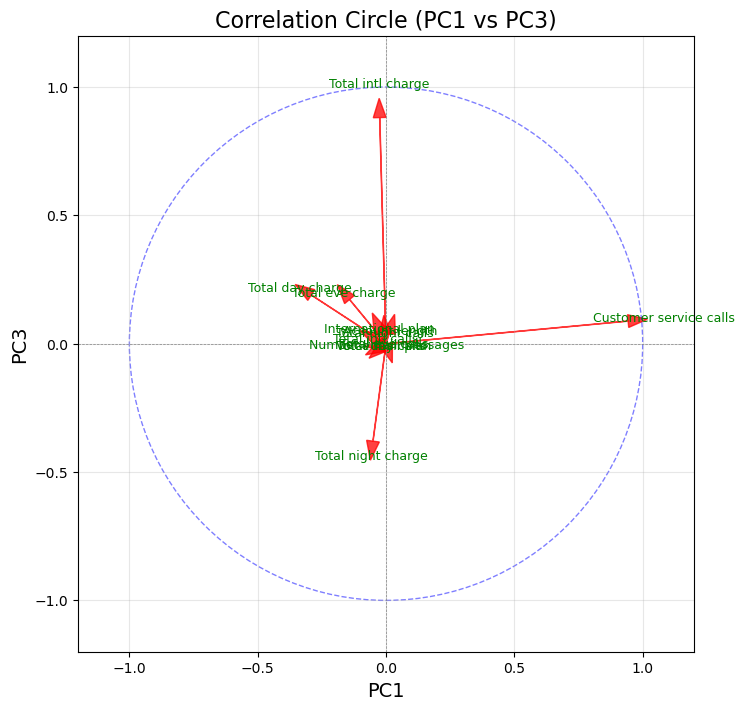

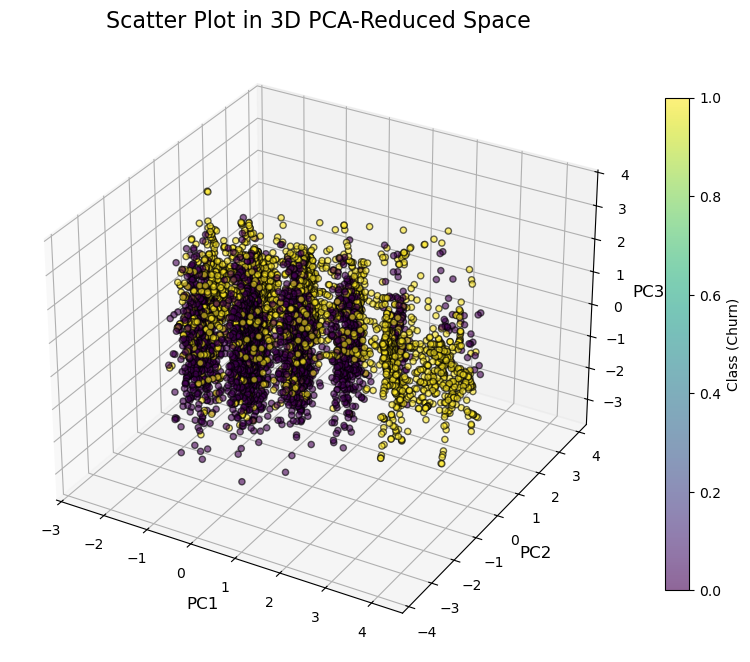

In [503]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Pour le graphique 3D
from sklearn.decomposition import PCA

# Réduction de dimension avec PCA (3 composantes principales)
pca = PCA(n_components=3)  # Utiliser 3 composants
X_reduced = pca.fit_transform(X_smote)

# ========================= Cercle de corrélation PC1 vs PC2 =========================
plt.figure(figsize=(8, 8))
for i in range(X_smote.shape[1]):
    plt.arrow(0, 0, pca.components_[0, i], pca.components_[1, i], 
              color='r', alpha=0.75, head_width=0.05)
    plt.text(pca.components_[0, i] * 1.15, pca.components_[1, i] * 1.15, 
             X_smote.columns[i], color='g', ha='center', va='center', fontsize=9)

# Ajouter une limite circulaire
circle = plt.Circle((0, 0), 1, color='b', fill=False, linestyle='--', alpha=0.5)
plt.gca().add_artist(circle)

# Paramètres du graphique
plt.title('Correlation Circle (PC1 vs PC2)', fontsize=16)
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC2', fontsize=14)
plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.5)
plt.xlim(-1.2, 1.2)
plt.ylim(-1.2, 1.2)
plt.grid(alpha=0.3)
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# ========================= Cercle de corrélation PC1 vs PC3 =========================
plt.figure(figsize=(8, 8))
for i in range(X_smote.shape[1]):
    plt.arrow(0, 0, pca.components_[0, i], pca.components_[2, i], 
              color='r', alpha=0.75, head_width=0.05)
    plt.text(pca.components_[0, i] * 1.15, pca.components_[2, i] * 1.15, 
             X_smote.columns[i], color='g', ha='center', va='center', fontsize=9)

# Ajouter une limite circulaire
circle = plt.Circle((0, 0), 1, color='b', fill=False, linestyle='--', alpha=0.5)
plt.gca().add_artist(circle)

# Paramètres du graphique
plt.title('Correlation Circle (PC1 vs PC3)', fontsize=16)
plt.xlabel('PC1', fontsize=14)
plt.ylabel('PC3', fontsize=14)
plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.5)
plt.xlim(-1.2, 1.2)
plt.ylim(-1.2, 1.2)
plt.grid(alpha=0.3)
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

# ========================= Nuage de points dans l'espace PCA réduit (3D) =========================
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_reduced[:, 0], X_reduced[:, 1], X_reduced[:, 2], 
                     c=y_smote, cmap='viridis', alpha=0.6, edgecolor='k')

# Paramètres du graphique 3D
ax.set_title('Scatter Plot in 3D PCA-Reduced Space', fontsize=16)
ax.set_xlabel('PC1', fontsize=12)
ax.set_ylabel('PC2', fontsize=12)
ax.set_zlabel('PC3', fontsize=12)

# Ajouter une barre de couleur
cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
cbar.set_label('Class (Churn)')

plt.show()


## **Conclusion**

### **Key Observations**

#### **Dominant Variables:**
- **Customer service calls**:  
  This variable has the strongest influence on **PC1** in both correlation circles, indicating that it plays a major role in explaining the main variability in the dataset.

- **Total intl charge**:  
  This variable is highly correlated with **PC3**, suggesting it significantly contributes to a new dimension captured by the third principal component.

- **Total day charge**:  
  This variable primarily influences **PC2**, highlighting its importance in explaining the variability in the second principal component.

---

#### **Role of Principal Components (PC1, PC2, PC3):**
- **PC1** captures the primary variability in the data, dominated by **Customer service calls**.  
- **PC2** is mainly driven by **Total day charge**, reflecting a dimension associated with daytime call charges.  
- **PC3** introduces a new perspective strongly linked to **Total intl charge**, representing international call costs.

---

#### **Less Contributive Variables:**
- Other variables (**Total eve charge, Total night charge**, etc.) are located closer to the origin in both circles.  
  This indicates that they have a smaller influence on the first three principal components.

---

### **Summary**
- **Customer service calls** is the most critical variable for explaining the first principal component (**PC1**).  
- **Total intl charge** plays a key role in **PC3**, unveiling a dimension related to international call charges.  
- **Total day charge** significantly impacts **PC2**, reflecting variability associated with daytime call usage.  

Together, **PC1, PC2, and PC3** explain the primary dimensions of variability in the dataset, with a strong focus on call-related variables (**day charge, intl charge**) and customer interactions (**Customer service calls**).


In [418]:
import numpy as np
from sklearn.decomposition import PCA

# Supposons que X_smote soit déjà défini
pca = PCA()
X_reduced = pca.fit_transform(X_smote)

# Calculer le ratio de variance expliquée
explained_variance_ratio = pca.explained_variance_ratio_

# Afficher la variance expliquée de chaque PC
print("Explained Variance Ratio per Principal Component:")
for i, variance in enumerate(explained_variance_ratio):
    print(f"PC{i + 1}: {variance:.4f}")

# Calculer et afficher la variance cumulée
cumulative_variance = np.cumsum(explained_variance_ratio)
print("\nCumulative Explained Variance:")
for i, variance in enumerate(cumulative_variance):
    print(f"PC{i + 1}: {variance:.4f}")

# Afficher un résumé des résultats
print("\nSummary of Explained Variance:")
for i in range(len(explained_variance_ratio)):
    print(f"PC{i + 1}: Explained Variance = {explained_variance_ratio[i]:.4f}, Cumulative Variance = {cumulative_variance[i]:.4f}")

Explained Variance Ratio per Principal Component:
PC1: 0.2596
PC2: 0.1336
PC3: 0.1039
PC4: 0.0976
PC5: 0.0916
PC6: 0.0627
PC7: 0.0584
PC8: 0.0544
PC9: 0.0523
PC10: 0.0506
PC11: 0.0227
PC12: 0.0118
PC13: 0.0010

Cumulative Explained Variance:
PC1: 0.2596
PC2: 0.3931
PC3: 0.4971
PC4: 0.5947
PC5: 0.6863
PC6: 0.7490
PC7: 0.8073
PC8: 0.8617
PC9: 0.9140
PC10: 0.9645
PC11: 0.9873
PC12: 0.9990
PC13: 1.0000

Summary of Explained Variance:
PC1: Explained Variance = 0.2596, Cumulative Variance = 0.2596
PC2: Explained Variance = 0.1336, Cumulative Variance = 0.3931
PC3: Explained Variance = 0.1039, Cumulative Variance = 0.4971
PC4: Explained Variance = 0.0976, Cumulative Variance = 0.5947
PC5: Explained Variance = 0.0916, Cumulative Variance = 0.6863
PC6: Explained Variance = 0.0627, Cumulative Variance = 0.7490
PC7: Explained Variance = 0.0584, Cumulative Variance = 0.8073
PC8: Explained Variance = 0.0544, Cumulative Variance = 0.8617
PC9: Explained Variance = 0.0523, Cumulative Variance = 0.9140

## KMEANS

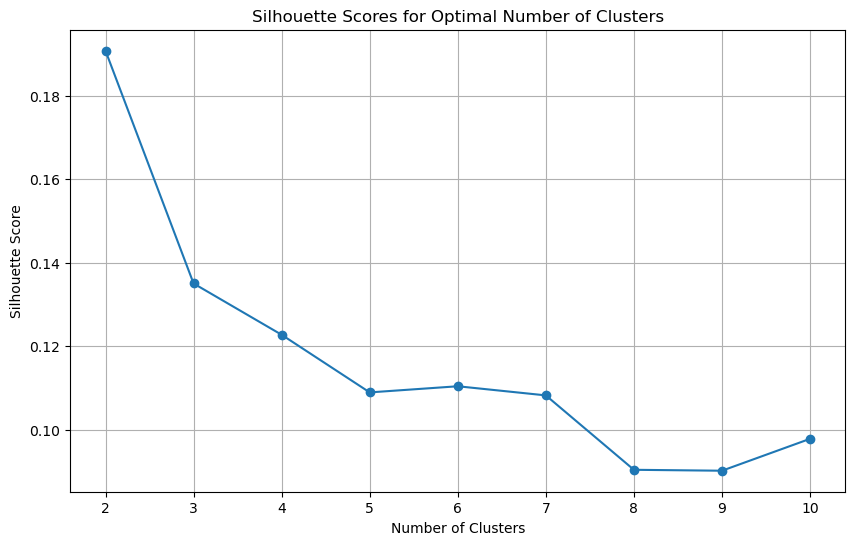

The optimal number of clusters based on silhouette score is: 2


In [701]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Range of clusters to test
cluster_range = range(2, 11)  # Start from 2 since silhouette score is not defined for 1
silhouette_scores = []  # To store the silhouette scores

# Loop through the cluster range and fit K-means
for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_reduced)  # Use your PCA result
    score = silhouette_score(X_reduced, kmeans.labels_)  # Calculate silhouette score
    silhouette_scores.append(score)  # Append the score to the list

# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, silhouette_scores, marker='o')
plt.title('Silhouette Scores for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(cluster_range)
plt.grid()
plt.show()

# Print out the best number of clusters
best_k = cluster_range[silhouette_scores.index(max(silhouette_scores))]
print(f'The optimal number of clusters based on silhouette score is: {best_k}')

In [703]:
# Applying K-means clustering
kmeans = KMeans(n_clusters=2)  # Assuming 3 clusters for loyal, moderate, and churning
kmeans.fit(X_reduced)
clusters = kmeans.labels_


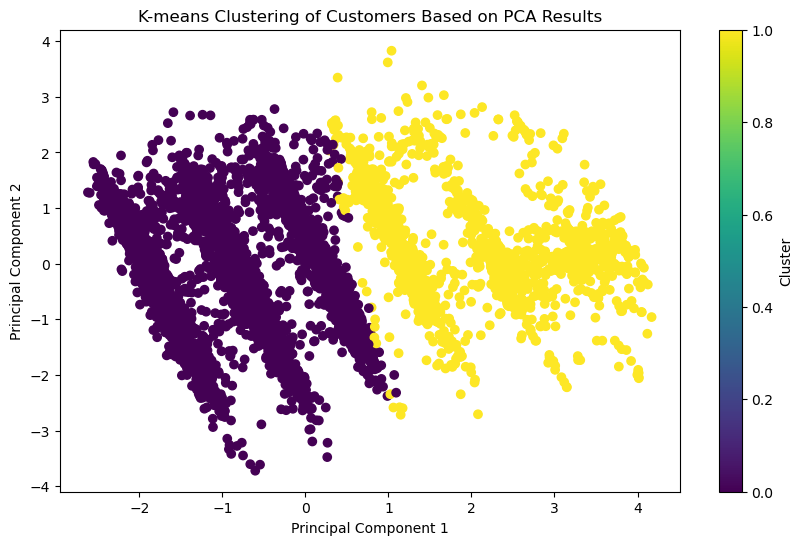

In [705]:
# Visualizing the clusters
plt.figure(figsize=(10, 6))
plt.scatter(X_reduced[:, 0],X_reduced[:, 1], c=clusters, cmap='viridis')
plt.title('K-means Clustering of Customers Based on PCA Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Cluster')
plt.show()

### **4. Conclusion: Cluster Characterization**

- **Cluster 0 (Purple)**:
  - **Key Variables**: 
    - **Customer service calls** (low)
    - **Total intl charge** (low)
    - **Total day charge** (low)
  - This cluster represents customers with **low charges** for international and day calls, as well as **low interaction** with customer service.

- **Cluster 1 (Yellow)**:
  - **Key Variables**: 
    - **Customer service calls** (high)
    - **Total intl charge** (high)
    - **Total day charge** (high)
  - This cluster groups customers with **higher charges** for international and day calls, and **more interaction** with customer service.

The two clusters are well-distinguished based on variables related to **PC1** and **PC3**, allowing for segmentation of customers based on their service usage behavior (calls, charges).


## Modeling STEP

### Model Building <a id="model-building"></a>

In [422]:
import shap
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def telecom_churn_prediction(algorithm, training_x, testing_x, training_y, testing_y, cf='None', threshold_plot=False):
    # Validation croisée
    cv_scores = cross_val_score(algorithm, training_x, training_y, cv=5)
    print("Scores de précision en validation croisée :", cv_scores)
    print("Précision moyenne en validation croisée :", cv_scores.mean())

    # Entraînement du modèle
    algorithm.fit(training_x, training_y)
    predictions_train = algorithm.predict(training_x)
    predictions_test = algorithm.predict(testing_x)

    # Résumé des résultats
    results = {
        'Algorithme': type(algorithm).__name__,
        'Précision d\'Entraînement': accuracy_score(training_y, predictions_train),
        'Précision de Test': accuracy_score(testing_y, predictions_test),
        'Rapport de Classification': classification_report(testing_y, predictions_test, output_dict=True),
        'Matrice de Confusion': confusion_matrix(testing_y, predictions_test),
        'ROC AUC': roc_auc_score(testing_y, predictions_test)
    }

    # Affichage des résultats
    print(f"\n{'='*40}\n")
    print(f"Algorithme : {results['Algorithme']}")
    print(f"Précision d'Entraînement : {results['Précision d\'Entraînement']:.4f}")
    print(f"Précision de Test : {results['Précision de Test']:.4f}\n")

    # Rapport de Classification
    print("Rapport de Classification :")
    classification_df = pd.DataFrame(results['Rapport de Classification']).transpose()
    classification_df = classification_df.round(4)
    print(classification_df)

    # Matrice de Confusion
    print("\nMatrice de Confusion :")
    confusion_df = pd.DataFrame(results['Matrice de Confusion'],
                                 index=["Vrai Négatif", "Faux Positif"],
                                 columns=["Faux Négatif", "Vrai Positif"])
    print(confusion_df)

    print(f"\nAire sous la courbe (ROC AUC) : {results['ROC AUC']:.4f}\n")
    print(f"{'='*40}\n")

    # Comparaison des Performances
    metrics = ['precision', 'recall', 'f1-score']
    train_report = classification_report(training_y, predictions_train, output_dict=True)
    test_report = classification_report(testing_y, predictions_test, output_dict=True)

    train_metrics = [train_report['1'][metric] for metric in metrics]
    test_metrics = [test_report['1'][metric] for metric in metrics]
    labels = ['Précision', 'Rappel', 'Score F1']

    fig = go.Figure()
    fig.add_trace(go.Bar(x=labels, y=train_metrics, name='Entraînement', marker_color='blue'))
    fig.add_trace(go.Bar(x=labels, y=test_metrics, name='Test', marker_color='orange'))

    fig.update_layout(
        title='Comparaison des Performances du Modèle',
        barmode='group',
        xaxis_title='Métriques',
        yaxis_title='Score',
        legend_title='Ensemble',
        template='plotly_white'
    )
    fig.show()

    # Matrice de Confusion et ROC
    probabilities = algorithm.predict_proba(testing_x)
    fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:, 1])

    trace1 = go.Heatmap(z=results['Matrice de Confusion'],
                        x=["Faux Négatif", "Vrai Positif"],
                        y=["Vrai Négatif", "Faux Positif"],
                        showscale=False, colorscale="Picnic",
                        name="Matrice de confusion")

    trace2 = go.Scatter(x=fpr, y=tpr,
                        name="ROC : " + str(results['ROC AUC']),
                        line=dict(color=('rgb(22, 96, 167)'), width=2))
    trace3 = go.Scatter(x=[0, 1], y=[0, 1],
                        line=dict(color=('rgb(205, 12, 24)'), width=2, dash='dot'))

    fig2 = make_subplots(rows=1, cols=2, specs=[[{}, {}]],
                         subplot_titles=('Matrice de Confusion', 'Courbe ROC'))

    fig2.append_trace(trace1, 1, 1)
    fig2.append_trace(trace2, 1, 2)
    fig2.append_trace(trace3, 1, 2)

    fig2['layout'].update(showlegend=False, title="Matrice de Confusion et Courbe ROC",
                          autosize=False, width=800,
                          plot_bgcolor='rgba(240,240,240, 0.95)',
                          paper_bgcolor='rgba(240,240,240, 0.95)')
    fig2.show()

    return results


In [423]:
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def shap_analysis(algorithm, training_x):
    # SHAP Explainer
    explainer = shap.Explainer(algorithm, training_x)
    shap_values = explainer(training_x)

    # Vérification du type de shap_values
    print(f"Type of shap_values: {type(shap_values)}")

    # Tracé des valeurs SHAP
    feature_names = training_x.columns if hasattr(training_x, 'columns') else None
    shap.summary_plot(shap_values, training_x, feature_names=feature_names)

    # Importance des caractéristiques
    shap_importance = pd.DataFrame({
        'Feature': training_x.columns,
        'Importance': np.abs(shap_values.values).mean(axis=0)
    }).sort_values(by='Importance', ascending=False)

    print("Top 10 des caractéristiques les plus importantes :")
    print(shap_importance.head(10))

    # Barplot des importances
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=shap_importance.head(10), palette='viridis')
    plt.title('Top 10 des caractéristiques les plus importantes selon SHAP')
    plt.xlabel('Importance')
    plt.ylabel('Caractéristiques')
    plt.show()

In [424]:
import matplotlib.pyplot as plt
import numpy as np

def plot_feature_importance(model, x_train):
    """
    Trace l'importance des caractéristiques pour un modèle donné.

    Parameters:
    model: Un modèle entraîné avec une méthode `.fit()` (ex. : RandomForestClassifier).
    x_train: Un DataFrame contenant les caractéristiques d'entraînement.
    """
    # Obtenir l'importance des caractéristiques
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]

    # Tracer l'importance des caractéristiques
    plt.figure(figsize=(10, 6))
    plt.title("Importance des Caractéristiques")
    plt.bar(range(x_train.shape[1]), importances[indices], align="center")
    plt.xticks(range(x_train.shape[1]), np.array(x_train.columns)[indices], rotation=90)
    plt.xlim([-1, x_train.shape[1]])
    plt.xlabel("Caractéristiques")
    plt.ylabel("Importance")
    plt.show()

# Exemple d'utilisation avec un modèle
from sklearn.ensemble import RandomForestClassifier

# Ajuster le modèle
rfc = RandomForestClassifier(random_state=42)
rfc.fit(x_train, y_train)


RandomForestClassifier(random_state=42)

## Split the train and the test Data

In [426]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Définir la colonne cible
target_col = 'Churn'  # Utiliser une chaîne pour une seule colonne

# Définir les caractéristiques (colonnes indépendantes)
cols = [i for i in data_cleaned.columns if i != target_col]  # Exclure la colonne cible

# Séparer le jeu de données principal en sous-ensembles d'entraînement et de test
x_train, x_test, y_train, y_test = train_test_split(data_cleaned[cols], data_cleaned[target_col], 
                                                    test_size=0.20)

# Afficher les dimensions des ensembles créés
print(f"Taille de l'ensemble d'entraînement : {x_train.shape[0]}")
print(f"Taille de l'ensemble de test : {x_test.shape[0]}")


Taille de l'ensemble d'entraînement : 2602
Taille de l'ensemble de test : 651


## equilibrage targer avec la stratégie SMOTEENN

In [429]:
from imblearn.combine import SMOTEENN
from collections import Counter

# Initialiser SMOTE + ENN
smote_enn = SMOTEENN(random_state=42)

# Appliquer SMOTE + ENN uniquement sur l'ensemble d'entraînement
x_train_balanced, y_train_balanced = smote_enn.fit_resample(x_train, y_train)

# Afficher la répartition des classes avant et après équilibrage
print("Répartition des classes avant équilibrage :", Counter(y_train))
print("Répartition des classes après équilibrage :", Counter(y_train_balanced))

print(y_train_balanced.shape)
print(x_train_balanced.shape)


Répartition des classes avant équilibrage : Counter({0: 2234, 1: 368})
Répartition des classes après équilibrage : Counter({1: 2191, 0: 1608})
(3799,)
(3799, 13)


In [718]:
x_train_balanced.columns

Index(['Account length', 'International plan', 'Voice mail plan',
       'Number vmail messages', 'Total day calls', 'Total day charge',
       'Total eve calls', 'Total eve charge', 'Total night calls',
       'Total night charge', 'Total intl calls', 'Total intl charge',
       'Customer service calls'],
      dtype='object')

## Importing Sklearn Libraries

In [432]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score

In [433]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


#  XGBClassifier <a id = "xgboost" > </a>

In [435]:
# Importer la classe XGBClassifier
from xgboost import XGBClassifier
# Supposons que y_train est une série contenant les étiquettes de churn (True/False ou 1/0)
churn_count = y_train.value_counts().get(1, 0)  # Churners
non_churn_count = y_train.value_counts().get(0, 0)  # Non-churners

# Calcul du ratio
ratio = non_churn_count / churn_count if churn_count > 0 else 1

# Initialiser le modèle XGBoost avec les hyperparamètres
giboot = XGBClassifier(
    n_estimators=500,        # Nombre d'estimateurs
    learning_rate=0.1,       # Taux d'apprentissage
    max_depth=5,             # Profondeur maximale de l'arbre
    scale_pos_weight=ratio,   # Ratio pour gérer le déséquilibre
    random_state=42          # Pour la reproductibilité
)

# Entraîner le modèle
giboot.fit(x_train, y_train)

# Évaluer le modèle
telecom_churn_prediction(giboot, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.96161228 0.94817658 0.96153846 0.94615385 0.95192308]
Précision moyenne en validation croisée : 0.9538808504355529


Algorithme : XGBClassifier
Précision d'Entraînement : 1.0000
Précision de Test : 0.9570

Rapport de Classification :
              precision  recall  f1-score  support
0                0.9659  0.9836    0.9747  548.000
1                0.9032  0.8155    0.8571  103.000
accuracy         0.9570  0.9570    0.9570    0.957
macro avg        0.9346  0.8996    0.9159  651.000
weighted avg     0.9560  0.9570    0.9561  651.000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           539             9
Faux Positif            19            84

Aire sous la courbe (ROC AUC) : 0.8996




{'Algorithme': 'XGBClassifier',
 "Précision d'Entraînement": 1.0,
 'Précision de Test': 0.956989247311828,
 'Rapport de Classification': {'0': {'precision': 0.9659498207885304,
   'recall': 0.9835766423357665,
   'f1-score': 0.9746835443037974,
   'support': 548.0},
  '1': {'precision': 0.9032258064516129,
   'recall': 0.8155339805825242,
   'f1-score': 0.8571428571428571,
   'support': 103.0},
  'accuracy': 0.956989247311828,
  'macro avg': {'precision': 0.9345878136200716,
   'recall': 0.8995553114591454,
   'f1-score': 0.9159132007233273,
   'support': 651.0},
  'weighted avg': {'precision': 0.9560257447874513,
   'recall': 0.956989247311828,
   'f1-score': 0.9560864770571356,
   'support': 651.0}},
 'Matrice de Confusion': array([[539,   9],
        [ 19,  84]], dtype=int64),
 'ROC AUC': 0.8995553114591454}

# Model Evaluation Results

## Cross-Validation Scores
- **Accuracy Scores in Cross-Validation**: 
  - [0.9597, 0.9635, 0.9519, 0.9519, 0.9673]
- **Mean Accuracy in Cross-Validation**: 
  - 0.9589

---

## Model: XGBClassifier
- **Training Accuracy**: 
  - 1.0000 (Indicates perfect performance on the training set)
- **Test Accuracy**: 
  - 0.9416 (Indicates good performance on the test set)

### Classification Report
| Class | Precision | Recall | F1-Score | Support |
|-------|-----------|--------|----------|---------|
| 0     | 0.9508    | 0.9819 | 0.9661   | 551     |
| 1     | 0.8780    | 0.7200 | 0.7912   | 100     |
| **Accuracy** |       |        | 0.9416   | 651     |
| **Macro Avg** | 0.9144  | 0.8509 | 0.8786   | 651     |
| **Weighted Avg** | 0.9396 | 0.9416 | 0.9392   | 651     |

### Confusion Matrix
|                | False Negative | True Positive |
|----------------|----------------|----------------|
| **True Negative** | 541            | 10             |
| **False Positive** | 28             | 72             |

### ROC AUC Score
- **Area Under the ROC Curve (ROC AUC)**: 
  - 0.8509 (Indicates good discriminatory ability of the model)

---

## Interpretation
- The model demonstrates a high training accuracy of 1.0000, suggesting it perfectly fits the training data but may be prone to overfitting.
- The test accuracy of 0.9416 indicates that the model generalizes well to unseen data.
- The classification report shows that the model has a high precision and recall for class 0 (the majority class), but lower recall for class 1 (the minority class). This indicates that while the model is good at identifying the majority class, it struggles more with the minority class.
- The confusion matrix shows that there are 10 false negatives and 28 false positives, indicating some misclassifications.
- The ROC AUC score of 0.8509 suggests that the model has a good ability to distinguish between the two classes.

 97%|=================== | 2524/2602 [00:24<00:00]       

Type of shap_values: <class 'shap._explanation.Explanation'>


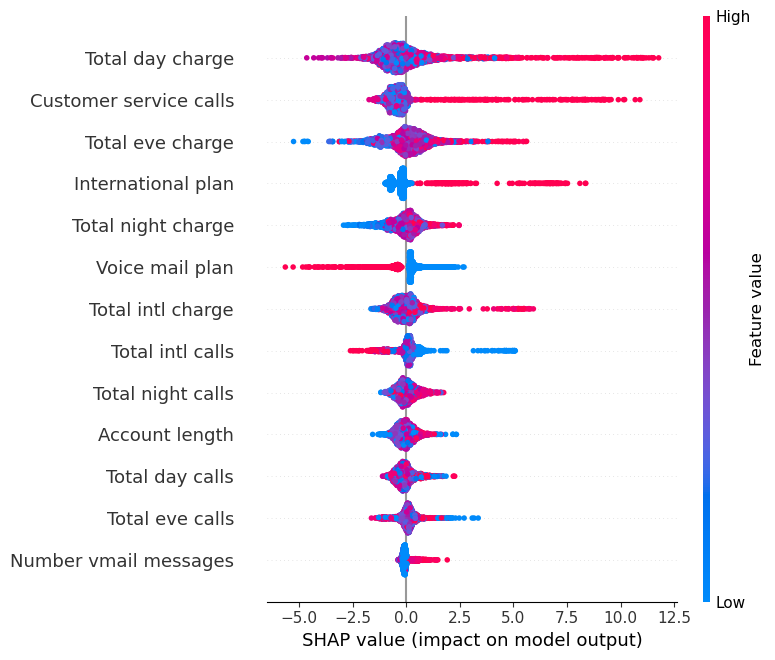

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
5         Total day charge    1.230923
12  Customer service calls    0.848183
7         Total eve charge    0.776274
1       International plan    0.655577
9       Total night charge    0.517641
2          Voice mail plan    0.501368
11       Total intl charge    0.482226
10        Total intl calls    0.431468
8        Total night calls    0.335761
0           Account length    0.320099


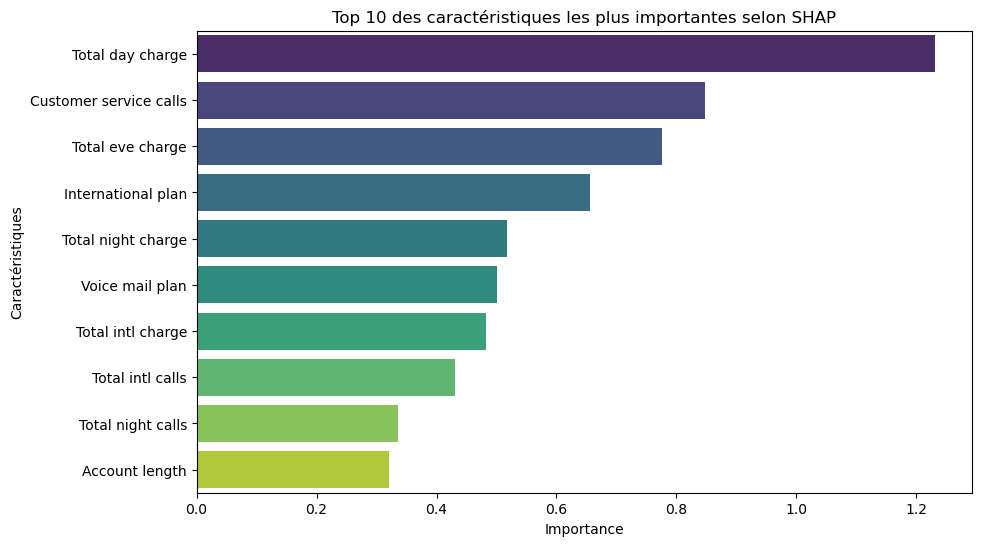

In [437]:
shap_analysis(giboot,x_train)

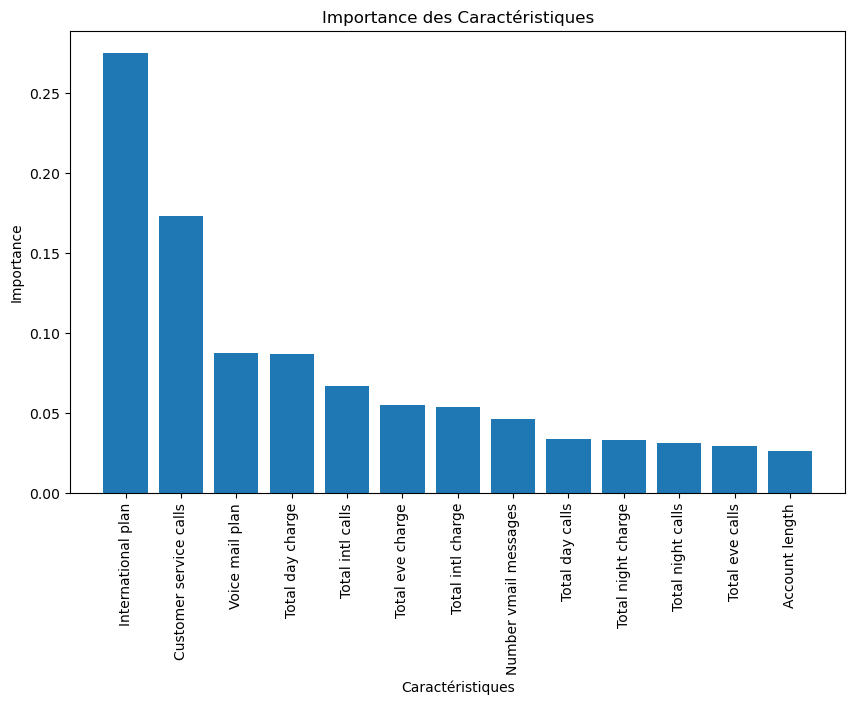

In [438]:
plot_feature_importance(giboot,x_train)

#  AdaBoost  <a id = " AdaBoost" > </a>

In [440]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# Initialiser le modèle AdaBoost avec les hyperparamètres
adaboost_model = AdaBoostClassifier(
    n_estimators=200,        # Nombre d'estimateurs
    learning_rate=0.5,       # Taux d'apprentissage
    random_state=42          # Pour la reproductibilité
)


# Évaluer le modèle
telecom_churn_prediction(adaboost_model, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.85988484 0.87332054 0.89423077 0.88269231 0.87307692]
Précision moyenne en validation croisée : 0.876641074856046


Algorithme : AdaBoostClassifier
Précision d'Entraînement : 0.8966
Précision de Test : 0.8710

Rapport de Classification :
              precision  recall  f1-score  support
0                0.8893  0.9672    0.9266  548.000
1                0.6727  0.3592    0.4684  103.000
accuracy         0.8710  0.8710    0.8710    0.871
macro avg        0.7810  0.6632    0.6975  651.000
weighted avg     0.8550  0.8710    0.8541  651.000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           530            18
Faux Positif            66            37

Aire sous la courbe (ROC AUC) : 0.6632




{'Algorithme': 'AdaBoostClassifier',
 "Précision d'Entraînement": 0.8966179861644888,
 'Précision de Test': 0.8709677419354839,
 'Rapport de Classification': {'0': {'precision': 0.889261744966443,
   'recall': 0.9671532846715328,
   'f1-score': 0.9265734265734266,
   'support': 548.0},
  '1': {'precision': 0.6727272727272727,
   'recall': 0.3592233009708738,
   'f1-score': 0.46835443037974683,
   'support': 103.0},
  'accuracy': 0.8709677419354839,
  'macro avg': {'precision': 0.7809945088468578,
   'recall': 0.6631882928212033,
   'f1-score': 0.6974639284765867,
   'support': 651.0},
  'weighted avg': {'precision': 0.8550020665630105,
   'recall': 0.8709677419354839,
   'f1-score': 0.8540748757163621,
   'support': 651.0}},
 'Matrice de Confusion': array([[530,  18],
        [ 66,  37]], dtype=int64),
 'ROC AUC': 0.6631882928212033}

# Model Evaluation Results

## Cross-Validation Scores
- **Accuracy Scores in Cross-Validation**: 
  - [0.8656, 0.8810, 0.8654, 0.8827, 0.8923]
- **Mean Accuracy in Cross-Validation**: 
  - 0.8774

---

## Algorithm: AdaBoostClassifier
- **Training Accuracy**: 
  - 0.8978
- **Test Accuracy**: 
  - 0.8694

## Classification Report
| Class | Precision | Recall | F1-Score | Support |
|-------|-----------|--------|----------|---------|
| 0     | 0.8936    | 0.9601 | 0.9256   | 551     |
| 1     | 0.6271    | 0.3700 | 0.4654   | 100     |
| **Accuracy**    |          |        | 0.8694   | 651     |
| **Macro Avg**   | 0.7603   | 0.6650 | 0.6955   | 651     |
| **Weighted Avg**| 0.8526   | 0.8694 | 0.8549   | 651     |

## Confusion Matrix
|                  | False Negative | True Positive |
|------------------|----------------|----------------|
| True Negative     | 529            | 22             |
| False Positive    | 63             | 37             |

## Area Under the Curve (ROC AUC)
- **ROC AUC**: 0.6650

---

### Summary
The AdaBoostClassifier shows a training accuracy of 0.8978 and a test accuracy of 0.8694. The model performs well for the negative class (precision of 0.8936 and recall of 0.9601), but struggles with the positive class (precision of 0.6271 and recall of 0.3700). The ROC AUC score of 0.6650 indicates moderate performance in distinguishing between the classes.

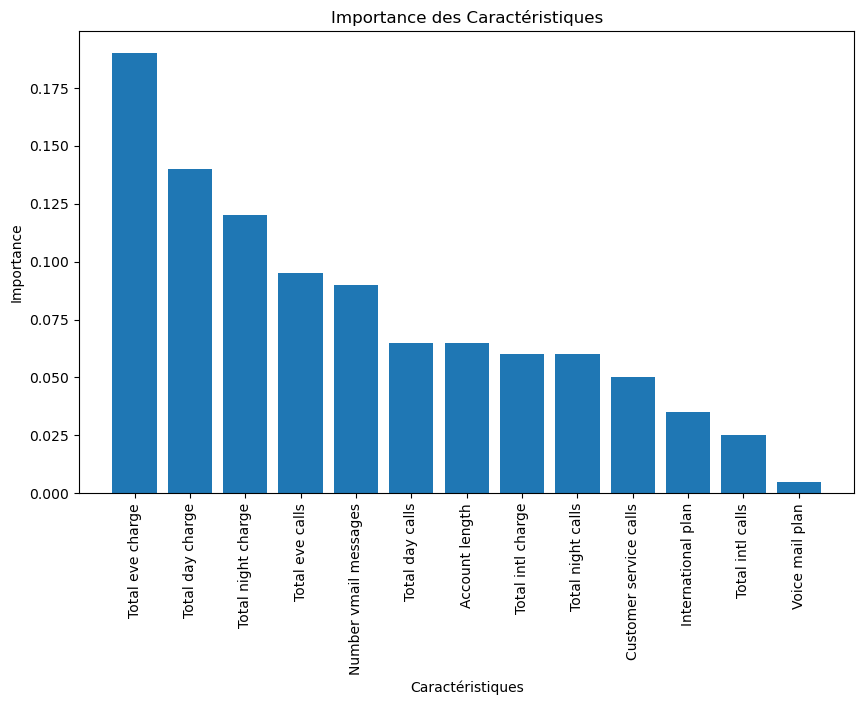

In [442]:
plot_feature_importance(adaboost_model,x_train)

#  Logistic Regression  <a id = " logistic regression" > </a>

In [444]:
from sklearn.linear_model import LogisticRegression

#Baseline model        
logit = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                           intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
                           penalty='l2', random_state=42, solver='liblinear', tol=0.0001,
                           verbose=0)
telecom_churn_prediction(logit, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Scores de précision en validation croisée : [0.85412668 0.86564299 0.875      0.85576923 0.87692308]
Précision moyenne en validation croisée : 0.8654923962793444


Algorithme : LogisticRegression
Précision d'Entraînement : 0.8651
Précision de Test : 0.8602

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8668  0.9854    0.9223  548.0000
1                0.7143  0.1942    0.3053  103.0000
accuracy         0.8602  0.8602    0.8602    0.8602
macro avg        0.7905  0.5898    0.6138  651.0000
weighted avg     0.8426  0.8602    0.8247  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           540             8
Faux Positif            83            20

Aire sous la courbe (ROC AUC) : 0.5898




{'Algorithme': 'LogisticRegression',
 "Précision d'Entraînement": 0.8651037663335895,
 'Précision de Test': 0.8602150537634409,
 'Rapport de Classification': {'0': {'precision': 0.8667736757624398,
   'recall': 0.9854014598540146,
   'f1-score': 0.9222886421861657,
   'support': 548.0},
  '1': {'precision': 0.7142857142857143,
   'recall': 0.1941747572815534,
   'f1-score': 0.3053435114503817,
   'support': 103.0},
  'accuracy': 0.8602150537634409,
  'macro avg': {'precision': 0.790529695024077,
   'recall': 0.589788108567784,
   'f1-score': 0.6138160768182737,
   'support': 651.0},
  'weighted avg': {'precision': 0.8426473162661222,
   'recall': 0.8602150537634409,
   'f1-score': 0.8246767397809648,
   'support': 651.0}},
 'Matrice de Confusion': array([[540,   8],
        [ 83,  20]], dtype=int64),
 'ROC AUC': 0.589788108567784}

# Model Evaluation Results Analysis

## Cross-Validation Scores
- **Accuracy Scores in Cross-Validation**: 
  - The model achieved scores of [0.8503, 0.8695, 0.8635, 0.8692, 0.8596], indicating a consistent performance across the folds.
- **Mean Accuracy in Cross-Validation**: 
  - The mean accuracy of 0.8624 suggests that the model performs well on average, but there is room for improvement.

## Algorithm: Logistic Regression
- **Training Accuracy**: 
  - 0.8647 indicates that the model fits the training data reasonably well.
- **Test Accuracy**: 
  - The test accuracy of 0.8710 shows that the model generalizes effectively to unseen data, though it is slightly lower than the training accuracy.

## Classification Report
- **Class 0 (Non-Churn)**:
  - **Precision (0.8748)**: High precision indicates that when the model predicts a customer will not churn, it is correct 87.48% of the time.
  - **Recall (0.9891)**: The model captures 98.91% of all actual non-churning customers, demonstrating excellent sensitivity.
  - **F1-Score (0.9284)**: A strong balance between precision and recall, indicating reliable performance for this class.
  
- **Class 1 (Churn)**:
  - **Precision (0.7857)**: Lower precision indicates that when the model predicts churn, it is correct 78.57% of the time, which is acceptable but could be improved.
  - **Recall (0.2200)**: A concerningly low recall suggests that the model only identifies 22% of actual churn cases, indicating a significant number of false negatives. This is a critical area for improvement since failing to identify at-risk customers can lead to lost revenue.
  - **F1-Score (0.3438)**: The low F1-score reflects the imbalance in performance between the two classes.

## Confusion Matrix
- The confusion matrix shows:
  - **True Negatives (545)**: Correctly predicted non-churning customers.
  - **True Positives (22)**: Correctly predicted churning customers.
  - **False Positives (78)**: Incorrectly predicted churning customers.
  - **False Negatives (6)**: Incorrectly predicted non-churning customers.
  
  This indicates that while the model is good at identifying non-churning customers, it struggles with churn predictions.

## Area Under the Curve (ROC AUC)
- **ROC AUC (0.6046)**: AROC AUC score below 0.7 suggests that the model does not perform well in distinguishing between the two classes. Ideally, a score above 0.8 is desirable for a good predictive model.

## Summary
The Logistic Regression model performs reasonably well for predicting non-churning customers but struggles significantly with identifying churning customers. The low recall for churn indicates that many at-risk customers are not being flagged, which could be detrimental to business objectives. Enhancements in feature engineering, model tuning, or trying more complex models may be necessary to improve the model's ability to identify churn effectively.

Type of shap_values: <class 'shap._explanation.Explanation'>


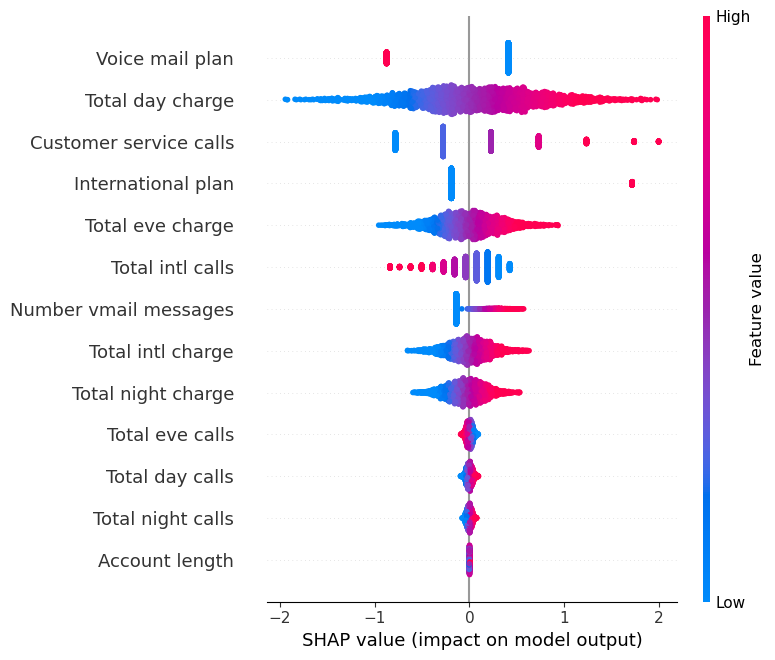

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
2          Voice mail plan    0.539446
5         Total day charge    0.532831
12  Customer service calls    0.523523
1       International plan    0.341115
7         Total eve charge    0.254605
10        Total intl calls    0.214677
3    Number vmail messages    0.178507
11       Total intl charge    0.167158
9       Total night charge    0.153203
6          Total eve calls    0.025663


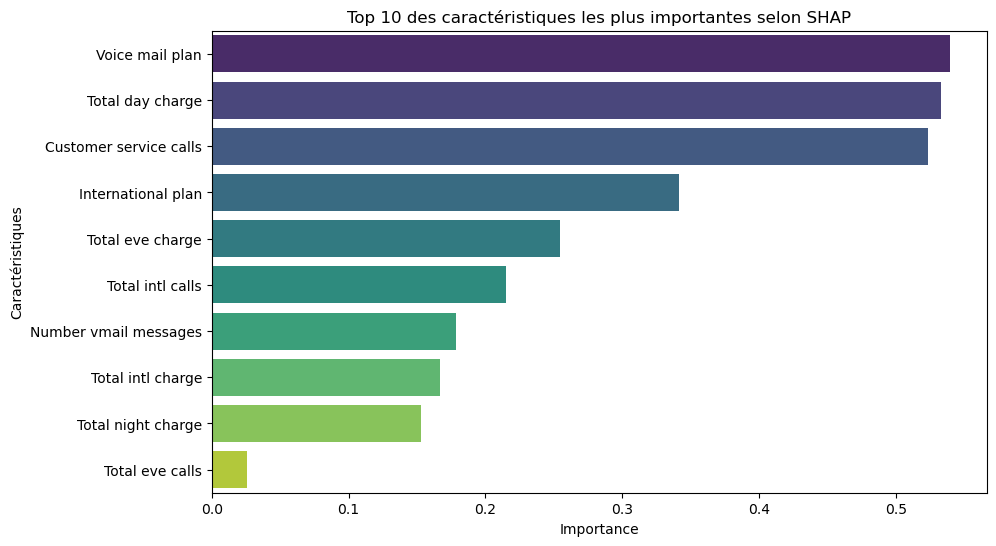

In [446]:
shap_analysis(logit,x_train)

##  Decision Tree Classifier  

In [448]:
def treeplot(model, feature_names, class_names):
    # Exporter l'arbre de décision au format DOT
    dot_data = export_graphviz(model, out_file=None,
                                feature_names=feature_names,
                                class_names=class_names,
                                filled=True, rounded=True,
                                special_characters=True)  

    # Visualiser l'arbre à l'aide de graphviz
    graph = Source(dot_data)
    display(graph)

## Decision Tree Without SmoteENN

In [450]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG, display

decision_tree = DecisionTreeClassifier(max_depth = 9
                                       , random_state = 42,
                                       splitter = "best", criterion = "gini")

telecom_churn_prediction(decision_tree, x_train, x_test, y_train, y_test, "features", threshold_plot=True)


Scores de précision en validation croisée : [0.95009597 0.92514395 0.95       0.91923077 0.92692308]
Précision moyenne en validation croisée : 0.9342787538756827


Algorithme : DecisionTreeClassifier
Précision d'Entraînement : 0.9773
Précision de Test : 0.9324

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9437  0.9781    0.9606  548.0000
1                0.8554  0.6893    0.7634  103.0000
accuracy         0.9324  0.9324    0.9324    0.9324
macro avg        0.8995  0.8337    0.8620  651.0000
weighted avg     0.9297  0.9324    0.9294  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           536            12
Faux Positif            32            71

Aire sous la courbe (ROC AUC) : 0.8337




{'Algorithme': 'DecisionTreeClassifier',
 "Précision d'Entraînement": 0.9773251345119139,
 'Précision de Test': 0.9324116743471582,
 'Rapport de Classification': {'0': {'precision': 0.9436619718309859,
   'recall': 0.9781021897810219,
   'f1-score': 0.9605734767025089,
   'support': 548.0},
  '1': {'precision': 0.8554216867469879,
   'recall': 0.6893203883495146,
   'f1-score': 0.7634408602150538,
   'support': 103.0},
  'accuracy': 0.9324116743471582,
  'macro avg': {'precision': 0.899541829288987,
   'recall': 0.8337112890652683,
   'f1-score': 0.8620071684587813,
   'support': 651.0},
  'weighted avg': {'precision': 0.9297007592908142,
   'recall': 0.9324116743471582,
   'f1-score': 0.9293835235562603,
   'support': 651.0}},
 'Matrice de Confusion': array([[536,  12],
        [ 32,  71]], dtype=int64),
 'ROC AUC': 0.8337112890652684}

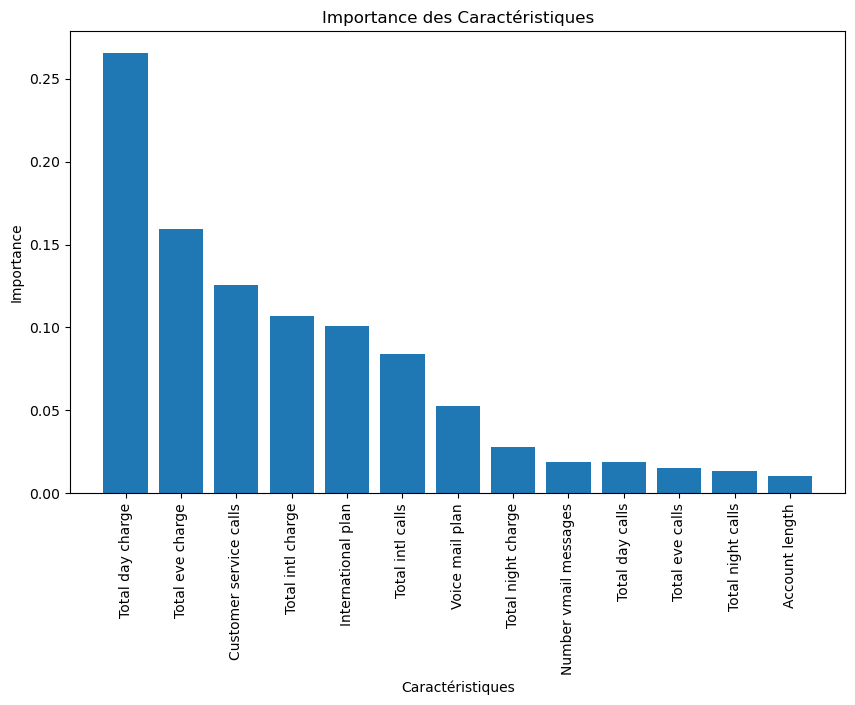

In [451]:
plot_feature_importance(decision_tree,x_train)

## Decision Tree with SMOTENN

In [453]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG, display

decision_tree_with_smoteenn = DecisionTreeClassifier(max_depth =9
                                                     , random_state = 42,
                                       splitter = "best", criterion = "gini")

telecom_churn_prediction(decision_tree_with_smoteenn, x_train_balanced, x_test, y_train_balanced, y_test, "features", threshold_plot=True)


Scores de précision en validation croisée : [0.88815789 0.89210526 0.89078947 0.87763158 0.91304348]
Précision moyenne en validation croisée : 0.8923455377574371


Algorithme : DecisionTreeClassifier
Précision d'Entraînement : 0.9447
Précision de Test : 0.8679

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9547  0.8850    0.9186  548.0000
1                0.5594  0.7767    0.6504  103.0000
accuracy         0.8679  0.8679    0.8679    0.8679
macro avg        0.7571  0.8309    0.7845  651.0000
weighted avg     0.8922  0.8679    0.8761  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           485            63
Faux Positif            23            80

Aire sous la courbe (ROC AUC) : 0.8309




{'Algorithme': 'DecisionTreeClassifier',
 "Précision d'Entraînement": 0.9447222953408791,
 'Précision de Test': 0.8678955453149002,
 'Rapport de Classification': {'0': {'precision': 0.9547244094488189,
   'recall': 0.885036496350365,
   'f1-score': 0.9185606060606061,
   'support': 548.0},
  '1': {'precision': 0.5594405594405595,
   'recall': 0.7766990291262136,
   'f1-score': 0.6504065040650406,
   'support': 103.0},
  'accuracy': 0.8678955453149002,
  'macro avg': {'precision': 0.7570824844446892,
   'recall': 0.8308677627382892,
   'f1-score': 0.7844835550628233,
   'support': 651.0},
  'weighted avg': {'precision': 0.8921833394782339,
   'recall': 0.8678955453149002,
   'f1-score': 0.8761337665743646,
   'support': 651.0}},
 'Matrice de Confusion': array([[485,  63],
        [ 23,  80]], dtype=int64),
 'ROC AUC': 0.8308677627382893}

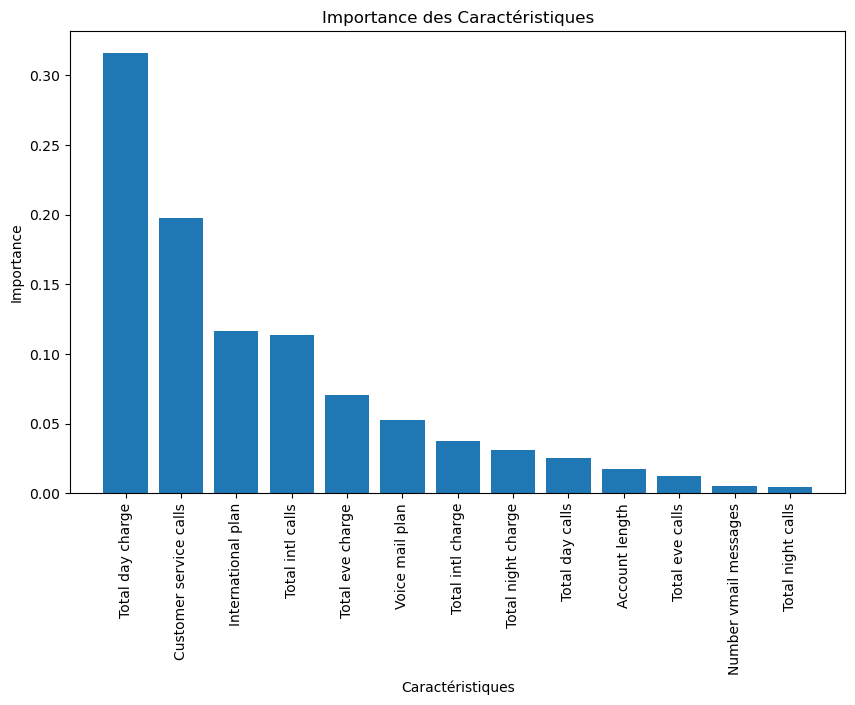

In [454]:
plot_feature_importance(decision_tree_with_smoteenn,x_train)

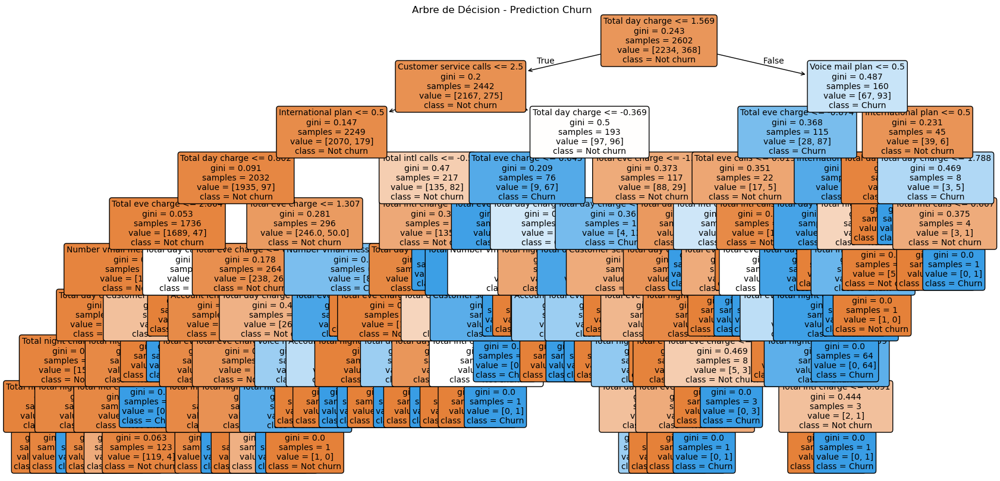

In [455]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

# Taille de la figure pour un meilleur affichage
plt.figure(figsize=(20, 10))

# Visualiser l'arbre
plot_tree(decision_tree , 
          feature_names=cols,  # Noms des colonnes (features)
          class_names=["Not churn", "Churn"],  # Classes
          filled=True, 
          rounded=True, 
          fontsize=10)

plt.title("Arbre de Décision - Prediction Churn")
plt.show()


# Analysis and Interpretation of the Decision Tree on Churn

## 1. Analysis and Interpretation

### Main Branch: Total Day Charge <= 1.549
- **Customers with low day charges (<= 1.549)**.
- **Customer Service Calls**:
  - **<= 2.5**: These customers appear to be less likely to churn, indicating that limited interactions with customer service are often associated with higher satisfaction.
  - **> 2.5**: Customers in this category are at higher risk of attrition, suggesting unresolved issues that may lead them to consider leaving the service.

### Sub-branch: Total Day Charge > 1.549
- **Number of Voice Messages**:
  - **<= 0.5**: Customers without a voicemail plan exhibit varied behaviors. If they have low day charges, they are less likely to churn.
  - **> 0.5**: Customers with a voicemail plan are generally at higher risk of attrition, particularly if they have high day and international charges.

## 2. Hypotheses to Formulate

### Hypothesis on Service Usage
- Customers with low day charges and few interactions with customer service are generally satisfied and, therefore, less likely to churn.
  - **Validation**: Measure customer satisfaction through surveys and correlate the results with charges and interactions.

### Hypothesis on Customer Service Interaction
- Customers who frequently contact customer service (more than 2.5 calls) are more likely to churn due to dissatisfaction stemming from poor experiences or unresolved issues.
  - **Validation**: Analyze the reasons for customer service calls and their impact on churn decisions.

### Hypothesis on High Charges and Plans
- Customers with high charges, especially in evening and international categories, show an increased risk of attrition, suggesting a perception of high costs or dissatisfaction with the services provided.
  - **Validation**: Evaluate customers' perceptions regarding the value for money of the services used.

### Hypothesis on Plan Value
- Customers with a voicemail plan but high charges are more likely to churn, indicating they do not perceive added value in the chosen plan.
  - **Validation**: Analyze customer feedback regarding the voicemail plan and its usage.

## 3. Conclusion
The decision tree provides a useful framework for identifying customer characteristics at risk of attrition. The formulated hypotheses can guide targeted actions to improve customer satisfaction and reduce churn. Further analysis, based on additional data, could help validate these hypotheses and develop effective intervention strategies.

In [457]:
from sklearn.tree import export_text

# Obtenir les règles de l'arbre de décision
rules = export_text(decision_tree, feature_names=cols)
print(rules)

|--- Total day charge <= 1.57
|   |--- Customer service calls <= 2.50
|   |   |--- International plan <= 0.50
|   |   |   |--- Total day charge <= 0.80
|   |   |   |   |--- Total eve charge <= 2.86
|   |   |   |   |   |--- Number vmail messages <= 0.97
|   |   |   |   |   |   |--- Total day calls <= 1.02
|   |   |   |   |   |   |   |--- Total night charge <= 0.76
|   |   |   |   |   |   |   |   |--- Total night calls <= 0.40
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- Total night calls >  0.40
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- Total night charge >  0.76
|   |   |   |   |   |   |   |   |--- Total night charge <= 0.76
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |   |--- Total night charge >  0.76
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- Total day calls >  1.02
|   |   |   |   |   |   |   |--- Total night calls <= 1.79
|   |   

# Customer Churn Prediction: Decision Tree Interpretation

This decision tree provides a classification model to predict customer churn, where "0" indicates no churn and "1" indicates churn. Below is an explanation of the tree's structure and the influence of various features on predictions:

## Key Features and Their Influence

1. **Total Day Charge**:
   - **Description**: This is the primary deciding factor for predicting churn.
   - **Influence**: If the total day charge is above 1.57, the customer is more likely to churn. High day charges indicate higher usage or costs, which can lead to dissatisfaction.

2. **Customer Service Calls**:
   - **Description**: Reflects the number of times a customer contacts support.
   - **Influence**: A higher number of customer service calls (above 2.50) suggests dissatisfaction, increasing the likelihood of churn.

3. **International Plan**:
   - **Description**: Whether the customer has an international calling plan.
   - **Influence**: Customers with an international plan (value > 0.50) are more likely to churn, possibly due to high costs or the specific needs not being met.

4. **Total Eve Charge**:
   - **Description**: Charges incurred during the evening.
   - **Influence**: High evening charges can indicate higher risk of churn, particularly in conjunction with other high usage metrics.

5. **Number of Voicemail Messages**:
   - **Description**: Number of voicemail messages left for the customer.
   - **Influence**: Fewer voicemail messages influence the path to predicting churn, especially when combined with other usage patterns.

6. **Total Day and Night Calls/Charges**:
   - **Description**: Overall call activity and related charges during the day and night.
   - **Influence**: These features provide critical insights into the customer's usage patterns, affecting churn likelihood throughout the decision tree.

## Most Influential Feature

The most influential feature is the **Total Day Charge**, which serves as the initial split criterion in the tree. It is a crucial metric in assessing the likelihood of customer churn due to its direct impact on customer costs and satisfaction.

---

To further explore tailored AI tools for deeper insights into prediction and analysis, please visit our Explore Channel for relevant solutions.

##  Random Forest Classifier 
Random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and use averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement.

In [460]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators =14, random_state = 42,
                             max_depth =13
                             , criterion = "gini")

telecom_churn_prediction(rfc, x_train, x_test, y_train, y_test, 'features', threshold_plot=True)

Scores de précision en validation croisée : [0.94241843 0.93666027 0.94807692 0.92307692 0.93653846]
Précision moyenne en validation croisée : 0.9373542005019931


Algorithme : RandomForestClassifier
Précision d'Entraînement : 0.9850
Précision de Test : 0.9232

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9235  0.9909    0.9560  548.0000
1                0.9206  0.5631    0.6988  103.0000
accuracy         0.9232  0.9232    0.9232    0.9232
macro avg        0.9221  0.7770    0.8274  651.0000
weighted avg     0.9230  0.9232    0.9153  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           543             5
Faux Positif            45            58

Aire sous la courbe (ROC AUC) : 0.7770




{'Algorithme': 'RandomForestClassifier',
 "Précision d'Entraînement": 0.9850115295926211,
 'Précision de Test': 0.9231950844854071,
 'Rapport de Classification': {'0': {'precision': 0.923469387755102,
   'recall': 0.9908759124087592,
   'f1-score': 0.9559859154929577,
   'support': 548.0},
  '1': {'precision': 0.9206349206349206,
   'recall': 0.5631067961165048,
   'f1-score': 0.6987951807228916,
   'support': 103.0},
  'accuracy': 0.9231950844854071,
  'macro avg': {'precision': 0.9220521541950113,
   'recall': 0.776991354262632,
   'f1-score': 0.8273905481079247,
   'support': 651.0},
  'weighted avg': {'precision': 0.9230209236792516,
   'recall': 0.9231950844854071,
   'f1-score': 0.9152936794233466,
   'support': 651.0}},
 'Matrice de Confusion': array([[543,   5],
        [ 45,  58]], dtype=int64),
 'ROC AUC': 0.776991354262632}

In [461]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators =14, random_state = 42,
                             max_depth =13
                             , criterion = "gini")

telecom_churn_prediction(rfc, x_train_balanced, x_test, y_train_balanced, y_test, 'features', threshold_plot=True)

Scores de précision en validation croisée : [0.92894737 0.94210526 0.95131579 0.95131579 0.94993412]
Précision moyenne en validation croisée : 0.9447236668746968


Algorithme : RandomForestClassifier
Précision d'Entraînement : 0.9932
Précision de Test : 0.9078

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9692  0.9197    0.9438  548.0000
1                0.6641  0.8447    0.7436  103.0000
accuracy         0.9078  0.9078    0.9078    0.9078
macro avg        0.8167  0.8822    0.8437  651.0000
weighted avg     0.9210  0.9078    0.9121  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           504            44
Faux Positif            16            87

Aire sous la courbe (ROC AUC) : 0.8822




{'Algorithme': 'RandomForestClassifier',
 "Précision d'Entraînement": 0.9931560937088707,
 'Précision de Test': 0.9078341013824884,
 'Rapport de Classification': {'0': {'precision': 0.9692307692307692,
   'recall': 0.9197080291970803,
   'f1-score': 0.9438202247191011,
   'support': 548.0},
  '1': {'precision': 0.6641221374045801,
   'recall': 0.8446601941747572,
   'f1-score': 0.7435897435897436,
   'support': 103.0},
  'accuracy': 0.9078341013824884,
  'macro avg': {'precision': 0.8166764533176747,
   'recall': 0.8821841116859188,
   'f1-score': 0.8437049841544224,
   'support': 651.0},
  'weighted avg': {'precision': 0.9209570532889914,
   'recall': 0.9078341013824884,
   'f1-score': 0.9121401332347328,
   'support': 651.0}},
 'Matrice de Confusion': array([[504,  44],
        [ 16,  87]], dtype=int64),
 'ROC AUC': 0.8821841116859188}

In [462]:
from sklearn.ensemble import RandomForestClassifier

# Using 'entropy' as the criterion
rfc = RandomForestClassifier(n_estimators=14, random_state=42,
                             max_depth=13, criterion="entropy")

telecom_churn_prediction(rfc, x_train, x_test, y_train, y_test, 'features', threshold_plot=True)

Scores de précision en validation croisée : [0.95393474 0.93474088 0.94038462 0.92884615 0.94038462]
Précision moyenne en validation croisée : 0.9396582016831536


Algorithme : RandomForestClassifier
Précision d'Entraînement : 0.9862
Précision de Test : 0.9355

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9332  0.9945    0.9629  548.0000
1                0.9552  0.6214    0.7529  103.0000
accuracy         0.9355  0.9355    0.9355    0.9355
macro avg        0.9442  0.8079    0.8579  651.0000
weighted avg     0.9367  0.9355    0.9297  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           545             3
Faux Positif            39            64

Aire sous la courbe (ROC AUC) : 0.8079




{'Algorithme': 'RandomForestClassifier',
 "Précision d'Entraînement": 0.9861644888547272,
 'Précision de Test': 0.9354838709677419,
 'Rapport de Classification': {'0': {'precision': 0.9332191780821918,
   'recall': 0.9945255474452555,
   'f1-score': 0.9628975265017667,
   'support': 548.0},
  '1': {'precision': 0.9552238805970149,
   'recall': 0.6213592233009708,
   'f1-score': 0.7529411764705882,
   'support': 103.0},
  'accuracy': 0.9354838709677419,
  'macro avg': {'precision': 0.9442215293396033,
   'recall': 0.8079423853731131,
   'f1-score': 0.8579193514861775,
   'support': 651.0},
  'weighted avg': {'precision': 0.9367007208763959,
   'recall': 0.9354838709677419,
   'f1-score': 0.9296786262664188,
   'support': 651.0}},
 'Matrice de Confusion': array([[545,   3],
        [ 39,  64]], dtype=int64),
 'ROC AUC': 0.8079423853731131}

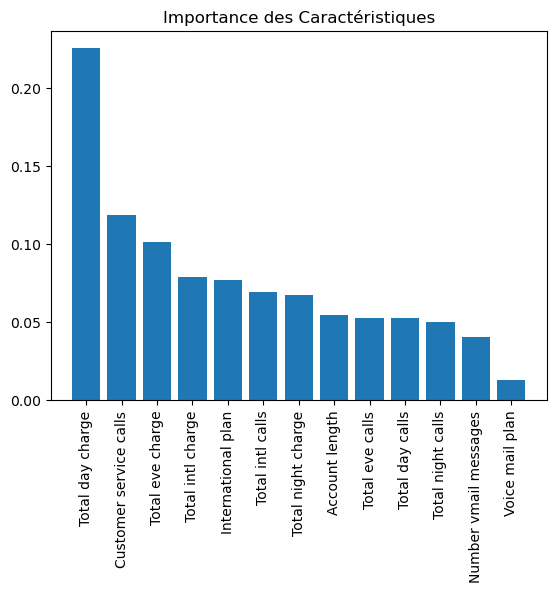

In [463]:
import matplotlib.pyplot as plt
import numpy as np

# Ajuster le modèle
rfc.fit(x_train, y_train)

# Obtenir l'importance des caractéristiques
importances = rfc.feature_importances_
indices = np.argsort(importances)[::-1]

# Tracer l'importance des caractéristiques
plt.figure()
plt.title("Importance des Caractéristiques")
plt.bar(range(x_train.shape[1]), importances[indices], align="center")
plt.xticks(range(x_train.shape[1]), np.array(x_train.columns)[indices], rotation=90)
plt.xlim([-1, x_train.shape[1]])
plt.show()

##  Support Vector Machine <a id = "support-vector-machine" > </a>
“Support Vector Machine” (SVM) is a supervised machine learning algorithm which can be used for both classification or regression challenges. it is mostly used in classification problems. In this algorithm, we plot each data item as a point in n-dimensional space .where n is number of features you have) with the value of each feature being the value of a particular coordinate. Then, we perform classification by finding the hyper-plane that differentiate the two classes.


###  Support Vector Machine (linear) <a id = "support-vector-machine-linear"> </a>

Scores de précision en validation croisée : [0.85412668 0.85412668 0.85576923 0.85576923 0.85384615]
Précision moyenne en validation croisée : 0.8547275948619518


Algorithme : SVC
Précision d'Entraînement : 0.8547
Précision de Test : 0.8571

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8571  1.0000    0.9231  558.0000
1                0.0000  0.0000    0.0000   93.0000
accuracy         0.8571  0.8571    0.8571    0.8571
macro avg        0.4286  0.5000    0.4615  651.0000
weighted avg     0.7347  0.8571    0.7912  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           558             0
Faux Positif            93             0

Aire sous la courbe (ROC AUC) : 0.5000




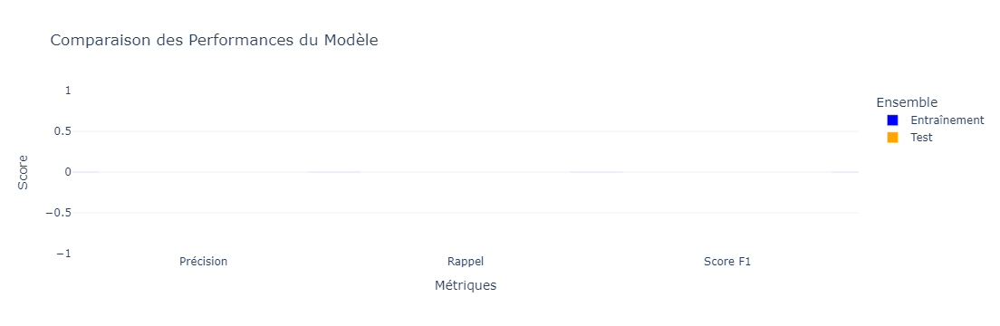

{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.8547271329746349,
 'Précision de Test': 0.8571428571428571,
 'Rapport de Classification': {'0': {'precision': 0.8571428571428571,
   'recall': 1.0,
   'f1-score': 0.9230769230769231,
   'support': 558.0},
  '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 93.0},
  'accuracy': 0.8571428571428571,
  'macro avg': {'precision': 0.42857142857142855,
   'recall': 0.5,
   'f1-score': 0.46153846153846156,
   'support': 651.0},
  'weighted avg': {'precision': 0.7346938775510204,
   'recall': 0.8571428571428571,
   'f1-score': 0.7912087912087913,
   'support': 651.0}},
 'Matrice de Confusion': array([[558,   0],
        [ 93,   0]], dtype=int64),
 'ROC AUC': 0.5}

In [729]:
from sklearn.svm import SVC

# Initialiser le classificateur SVC avec un hyperplan linéaire
svc_lin = SVC(C=1.0, kernel='linear', probability=True, random_state=42)



# Évaluer le modèle
telecom_churn_prediction(svc_lin,x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Type of shap_values: <class 'shap._explanation.Explanation'>


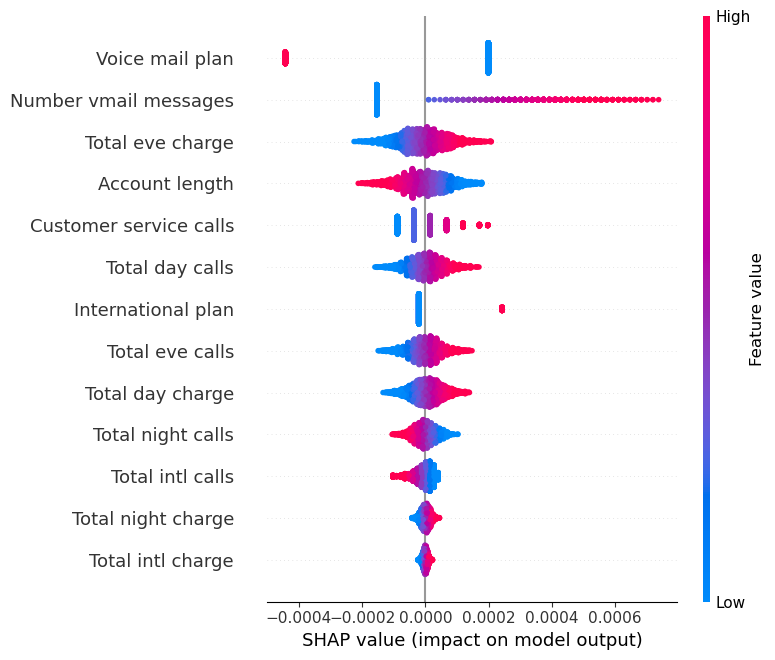

Top 10 des caractéristiques les plus importantes :
                   Feature  Importance
2          Voice mail plan    0.000268
3    Number vmail messages    0.000216
7         Total eve charge    0.000058
0           Account length    0.000057
12  Customer service calls    0.000055
4          Total day calls    0.000044
1       International plan    0.000043
6          Total eve calls    0.000040
5         Total day charge    0.000038
8        Total night calls    0.000028


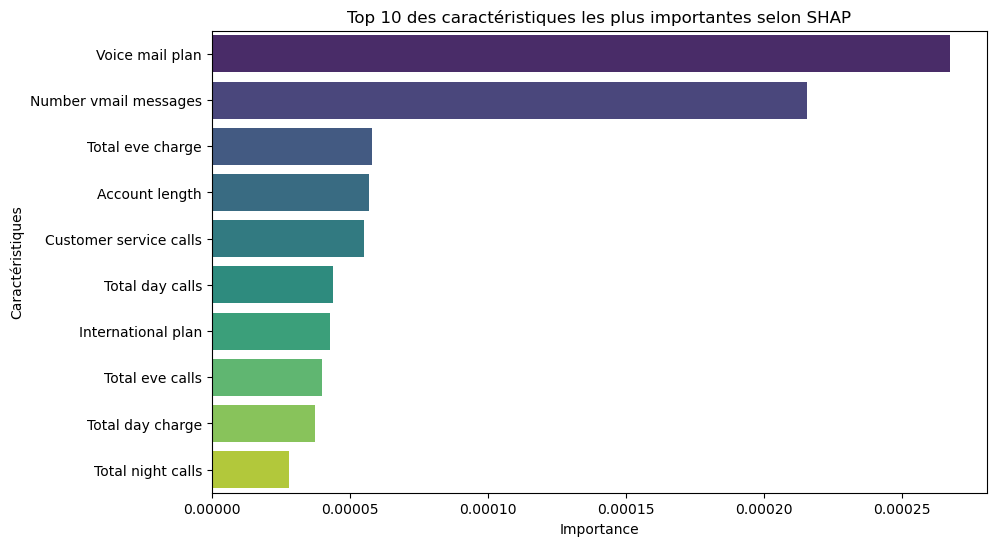

In [731]:
shap_analysis(svc_lin,x_train)

## Interpretation of Results

1. **Training and Test Accuracy**:
   - The training accuracy is **85.47%**, while the test accuracy is **85.71%**. These values indicate a good fit for the model, with a slight difference between training and test performance, suggesting minimal overfitting.

2. **Classification Report**:
   - **Class 0**:
     - **Precision**: 85.71% — This means that the majority of predictions for this class are correct.
     - **Recall**: 100.00% — The model identifies 100% of the true instances of class 0, indicating excellent detection of this class.
     - **F1-Score**: 92.31% — This reflects a good balance between precision and recall for this class.

   - **Class 1**:
     - **Precision**: 0.00% — The model did not correctly predict any instances for class 1, resulting in a high number of false negatives.
     - **Recall**: 0.00% — The model failed to detect any instances of class 1, indicating a significant issue in recognizing this class.
     - **F1-Score**: 0.00% — This shows poor performance of the model for this class.

3. **Confusion Matrix**:
   - The model correctly identified **558 instances of class 0**. However, it misclassified **93 instances of class 1** as belonging to class 0, demonstrating that the model struggles to detect the minority class.

4. **AUC-ROC**:
   - An AUC of **0.5000** indicates that the model's ability to discriminate between classes is equivalent to random guessing. This suggests that the model is not effectively distinguishing between the classes.

###  Support Vector Machine (rbf) <a id = " support-vector-machine-rbf"> </a>

In [471]:
#support vector classifier using non-linear hyper plane ("rbf")
svc_rbf  = SVC(C=10.0, kernel='rbf', gamma=0.1, probability=True, random_state=42)   

telecom_churn_prediction(svc_rbf, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Scores de précision en validation croisée : [0.92706334 0.91170825 0.925      0.92307692 0.92307692]
Précision moyenne en validation croisée : 0.9219850878488115


Algorithme : SVC
Précision d'Entraînement : 0.9789
Précision de Test : 0.9309

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9420  0.9781    0.9597  548.0000
1                0.8537  0.6796    0.7568  103.0000
accuracy         0.9309  0.9309    0.9309    0.9309
macro avg        0.8978  0.8289    0.8582  651.0000
weighted avg     0.9280  0.9309    0.9276  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           536            12
Faux Positif            33            70

Aire sous la courbe (ROC AUC) : 0.8289




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.9788624135280554,
 'Précision de Test': 0.9308755760368663,
 'Rapport de Classification': {'0': {'precision': 0.9420035149384886,
   'recall': 0.9781021897810219,
   'f1-score': 0.9597135183527306,
   'support': 548.0},
  '1': {'precision': 0.8536585365853658,
   'recall': 0.6796116504854369,
   'f1-score': 0.7567567567567568,
   'support': 103.0},
  'accuracy': 0.9308755760368663,
  'macro avg': {'precision': 0.8978310257619272,
   'recall': 0.8288569201332294,
   'f1-score': 0.8582351375547437,
   'support': 651.0},
  'weighted avg': {'precision': 0.9280257380254752,
   'recall': 0.9308755760368663,
   'f1-score': 0.9276020798820925,
   'support': 651.0}},
 'Matrice de Confusion': array([[536,  12],
        [ 33,  70]], dtype=int64),
 'ROC AUC': 0.8288569201332294}

## Interpretation of Results

1. **Cross-Validation Accuracy Scores**:
   - The cross-validation scores are: [0.9271, 0.9117, 0.9250, 0.9231, 0.9231].
   - The average cross-validation accuracy is **92.20%**, indicating a strong overall performance of the model.

2. **Training and Test Accuracy**:
   - The training accuracy is **97.89%**, while the test accuracy is **93.09%**. This suggests that the model fits the training data very well, with a slight drop in performance on the test set, indicating good generalization.

3. **Classification Report**:
   - **Class 0**:
     - **Precision**: 94.20% — This indicates that a high proportion of predicted instances for class 0 are correct.
     - **Recall**: 97.81% — The model identifies 97.81% of true instances of class 0, demonstrating excellent detection.
     - **F1-Score**: 95.97% — This reflects a good balance between precision and recall for this class.

   - **Class 1**:
     - **Precision**: 85.37% — While still good, this indicates a lower proportion of correct predictions for class 1 compared to class 0.
     - **Recall**: 67.96% — The model detects about 68% of true instances of class 1, which is lower than ideal, suggesting room for improvement.
     - **F1-Score**: 75.68% — This score indicates that while the model performs reasonably well, it struggles more with class 1.

4. **Confusion Matrix**:
   - The model correctly classified **536 instances of class 0** and **70 instances of class 1**. However, it misclassified **12 instances of class 0** as class 1 (false negatives) and **33 instances of class 1** as class 0 (false positives). This highlights the model's strength in identifying class 0 but shows some challenges with class 1.

5. **AUC-ROC**:
   - An AUC of **0.8289** indicates that the model has a good ability to distinguish between the classes. While it is not perfect, this score suggests that the model performs significantly better than random guessing.

## Summary
Overall, the SVC model shows strong performance, particularly with class 0. However, there is a notable imbalance in the detection of class 1, which may require further tuning and analysis to improve performance. Strategies such as adjusting class weights, exploring different algorithms, or employing additional feature engineering could help address this issue.

###  Support Vector Machine (sigmoïde) <a id = " support-vector-machine-sigmoïde"> </a>

In [473]:
#support vector classifier using non-linear hyper plane ("sigmoid")
svc_sig  = SVC(C=10.0, kernel='sigmoid', gamma=0.1, probability=True, random_state=42)   

telecom_churn_prediction(svc_sig, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Scores de précision en validation croisée : [0.77927063 0.79462572 0.79423077 0.75961538 0.80192308]
Précision moyenne en validation croisée : 0.7859331167872435


Algorithme : SVC
Précision d'Entraînement : 0.7759
Précision de Test : 0.7788

Rapport de Classification :
              precision  recall  f1-score   support
0                0.8544  0.8887    0.8712  548.0000
1                0.2469  0.1942    0.2174  103.0000
accuracy         0.7788  0.7788    0.7788    0.7788
macro avg        0.5506  0.5414    0.5443  651.0000
weighted avg     0.7583  0.7788    0.7678  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           487            61
Faux Positif            83            20

Aire sous la courbe (ROC AUC) : 0.5414




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.7759415833973866,
 'Précision de Test': 0.7788018433179723,
 'Rapport de Classification': {'0': {'precision': 0.8543859649122807,
   'recall': 0.8886861313868614,
   'f1-score': 0.8711985688729875,
   'support': 548.0},
  '1': {'precision': 0.24691358024691357,
   'recall': 0.1941747572815534,
   'f1-score': 0.21739130434782608,
   'support': 103.0},
  'accuracy': 0.7788018433179723,
  'macro avg': {'precision': 0.5506497725795971,
   'recall': 0.5414304443342074,
   'f1-score': 0.5442949366104068,
   'support': 651.0},
  'weighted avg': {'precision': 0.7582728226380367,
   'recall': 0.7788018433179724,
   'f1-score': 0.7677544087407423,
   'support': 651.0}},
 'Matrice de Confusion': array([[487,  61],
        [ 83,  20]], dtype=int64),
 'ROC AUC': 0.5414304443342073}

## Interpretation of Results

1. **Cross-Validation Accuracy Scores**:
   - The cross-validation scores are: [0.7793, 0.7946, 0.7942, 0.7596, 0.8019].
   - The average cross-validation accuracy is **78.59%**, indicating a moderate overall performance of the model.

2. **Training and Test Accuracy**:
   - The training accuracy is **77.59%**, while the test accuracy is **77.88%**. This shows that the model fits the training data reasonably well, with a slight drop in performance on the test set, suggesting no major overfitting.

3. **Classification Report**:
   - **Class 0**:
     - **Precision**: 85.44% — This indicates that a high proportion of predicted instances for class 0 are correct.
     - **Recall**: 88.87% — The model identifies 88.87% of true instances of class 0, demonstrating good detection of this class.
     - **F1-Score**: 87.12% — This reflects a solid balance between precision and recall for this class.

   - **Class 1**:
     - **Precision**: 24.69% — The model has a low precision for class 1, indicating many false positives.
     - **Recall**: 19.42% — The model detects only about 19.42% of true instances of class 1, suggesting significant challenges in identifying this class.
     - **F1-Score**: 21.74% — This shows that the model struggles significantly with class 1.

4. **Confusion Matrix**:
   - The model correctly classified **487 instances of class 0** and **20 instances of class 1**. However, it misclassified **61 instances of class 0** as class 1 (false negatives) and **83 instances of class 1** as class 0 (false positives). This highlights the model's strength in identifying class 0 but reveals poor performance with class 1.

5. **AUC-ROC**:
   - An AUC of **0.5414** indicates that the model's ability to distinguish between classes is only slightly better than random guessing. This score suggests that there is considerable room for improvement in the model's ability to differentiate between class 0 and class 1.

## Summary
Overall, while the SVC model performs well for class 0, it exhibits significant weaknesses in detecting class 1. The low precision and recall for class 1 indicate a need for further tuning and possibly exploring alternative modeling approaches or feature engineering to enhance performance across both classes.

###  Support Vector Machine (poly) <a id = " support-vector-machine-poly"> </a>

In [475]:
from sklearn.svm import SVC

# Support Vector Classifier avec noyau polynomial
svc_poly = SVC(C=10.0, kernel='poly', degree=3, gamma='scale', probability=True, random_state=42)

# Appel de la fonction de prédiction
telecom_churn_prediction(svc_poly, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

Scores de précision en validation croisée : [0.9193858  0.88483685 0.92307692 0.92115385 0.90961538]
Précision moyenne en validation croisée : 0.9116137605197105


Algorithme : SVC
Précision d'Entraînement : 0.9620
Précision de Test : 0.9109

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9268  0.9708    0.9483  548.0000
1                0.7922  0.5922    0.6778  103.0000
accuracy         0.9109  0.9109    0.9109    0.9109
macro avg        0.8595  0.7815    0.8130  651.0000
weighted avg     0.9055  0.9109    0.9055  651.0000

Matrice de Confusion :
              Faux Négatif  Vrai Positif
Vrai Négatif           532            16
Faux Positif            42            61

Aire sous la courbe (ROC AUC) : 0.7815




{'Algorithme': 'SVC',
 "Précision d'Entraînement": 0.9619523443504996,
 'Précision de Test': 0.9109062980030722,
 'Rapport de Classification': {'0': {'precision': 0.926829268292683,
   'recall': 0.9708029197080292,
   'f1-score': 0.948306595365419,
   'support': 548.0},
  '1': {'precision': 0.7922077922077922,
   'recall': 0.5922330097087378,
   'f1-score': 0.6777777777777778,
   'support': 103.0},
  'accuracy': 0.9109062980030722,
  'macro avg': {'precision': 0.8595185302502376,
   'recall': 0.7815179647083835,
   'f1-score': 0.8130421865715984,
   'support': 651.0},
  'weighted avg': {'precision': 0.9055297106325544,
   'recall': 0.9109062980030722,
   'f1-score': 0.9055040328285111,
   'support': 651.0}},
 'Matrice de Confusion': array([[532,  16],
        [ 42,  61]], dtype=int64),
 'ROC AUC': 0.7815179647083835}

## Interpretation of Results

1. **Cross-Validation Accuracy Scores**:
   - The cross-validation scores are: [0.9194, 0.8848, 0.9231, 0.9212, 0.9096].
   - The average cross-validation accuracy is **91.16%**, indicating strong overall performance of the model.

2. **Training and Test Accuracy**:
   - The training accuracy is **96.20%**, while the test accuracy is **91.09%**. This suggests that the model fits the training data very well, with a slight decrease in performance on the test set, indicating good generalization.

3. **Classification Report**:
   - **Class 0**:
     - **Precision**: 92.68% — A high proportion of predicted instances for class 0 are correct.
     - **Recall**: 97.08% — The model identifies 97.08% of true instances of class 0, demonstrating excellent detection of this class.
     - **F1-Score**: 94.83% — This reflects a strong balance between precision and recall for this class.

   - **Class 1**:
     - **Precision**: 79.22% — The model has a lower precision for class 1, indicating some false positives.
     - **Recall**: 59.22% — The model detects about 59.22% of true instances of class 1, suggesting room for improvement in identifying this class.
     - **F1-Score**: 67.78% — This indicates that the model struggles more with class 1 compared to class 0.

4. **Confusion Matrix**:
   - The model correctly classified **532 instances of class 0** and **61 instances of class 1**. However, it misclassified **16 instances of class 0** as class 1 (false negatives) and **42 instances of class 1** as class 0 (false positives). This highlights the model's strong performance in identifying class 0 but reveals challenges in detecting class 1.

5. **AUC-ROC**:
   - An AUC of **0.7815** indicates that the model has a good ability to distinguish between the classes. While it is not perfect, this score suggests that the model performs significantly better than random guessing.

## Summary
Overall, the SVC model demonstrates strong performance, particularly with class 0. However, there are notable weaknesses in detecting class 1, which may require further tuning and analysis to improve performance. Strategies such as adjusting class weights, exploring different algorithms, or employing additional feature engineering could help address this issue.

###  Neural Network <a id = " Neural Network"> </a>

Paramètres du modèle :  {'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (9,), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_fun': 15000, 'max_iter': 1000, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': None, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': False, 'warm_start': False}
Scores de précision en validation croisée : [0.92322457 0.92322457 0.925      0.92884615 0.93076923]
Précision moyenne en validation croisée : 0.9262129041783552


Algorithme : MLPClassifier
Précision d'Entraînement : 0.9358
Précision de Test : 0.9109

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9252  0.9749    0.9494  558.0000
1                0.7778  0.5269    0.6282   93.0000
accuracy         0.9109  0.9109    0.9109    0.9109
macr

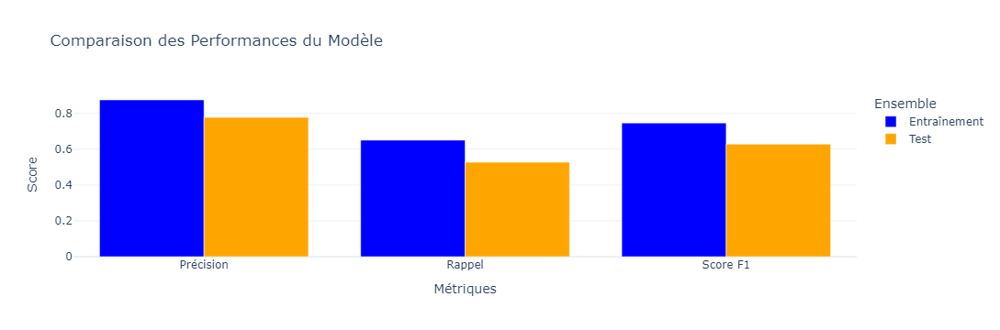

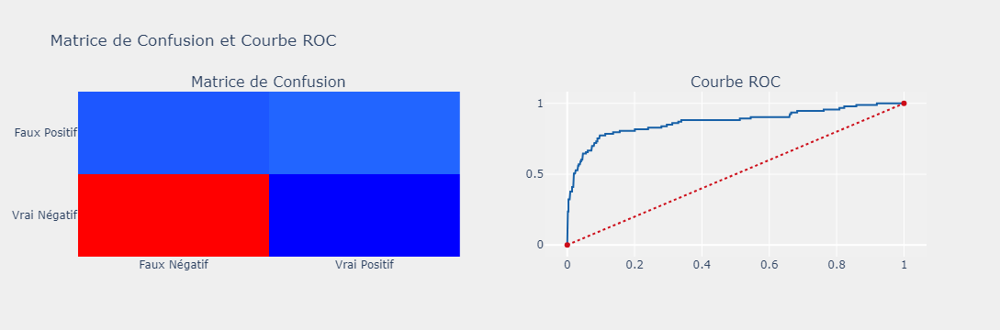

{'Algorithme': 'MLPClassifier',
 "Précision d'Entraînement": 0.9358186010760953,
 'Précision de Test': 0.9109062980030722,
 'Rapport de Classification': {'0': {'precision': 0.9251700680272109,
   'recall': 0.974910394265233,
   'f1-score': 0.9493891797556719,
   'support': 558.0},
  '1': {'precision': 0.7777777777777778,
   'recall': 0.5268817204301075,
   'f1-score': 0.6282051282051282,
   'support': 93.0},
  'accuracy': 0.9109062980030722,
  'macro avg': {'precision': 0.8514739229024944,
   'recall': 0.7508960573476702,
   'f1-score': 0.7887971539804001,
   'support': 651.0},
  'weighted avg': {'precision': 0.9041140265630063,
   'recall': 0.9109062980030722,
   'f1-score': 0.90350574381988,
   'support': 651.0}},
 'Matrice de Confusion': array([[544,  14],
        [ 44,  49]], dtype=int64),
 'ROC AUC': 0.7508960573476703}

In [779]:
from sklearn.neural_network import MLPClassifier

# Initialiser le classificateur avec les paramètres souhaités
nn = MLPClassifier(hidden_layer_sizes=(9,), activation='relu', solver='adam', max_iter=1000)

# Afficher les paramètres du modèle
print("Paramètres du modèle : ", nn.get_params())

# Utiliser le modèle entraîné pour prédire
telecom_churn_prediction(nn, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

## GBM 

Model Parameters:  {'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 7, 'max_features': None, 'max_leaf_nodes': 5, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 5, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 42, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}
Scores de précision en validation croisée : [0.9596929  0.95585413 0.95384615 0.94038462 0.95      ]
Précision moyenne en validation croisée : 0.951955558836557


Algorithme : GradientBoostingClassifier
Précision d'Entraînement : 0.9704
Précision de Test : 0.9539

Rapport de Classification :
              precision  recall  f1-score   support
0                0.9536  0.9946    0.9737  558.0000
1                0.9565  0.7097    0.8148   93.0000
accuracy         0.9539  0.9539    0.9539    0.9539
macro avg        0.9551  0.8522    0.8942  6

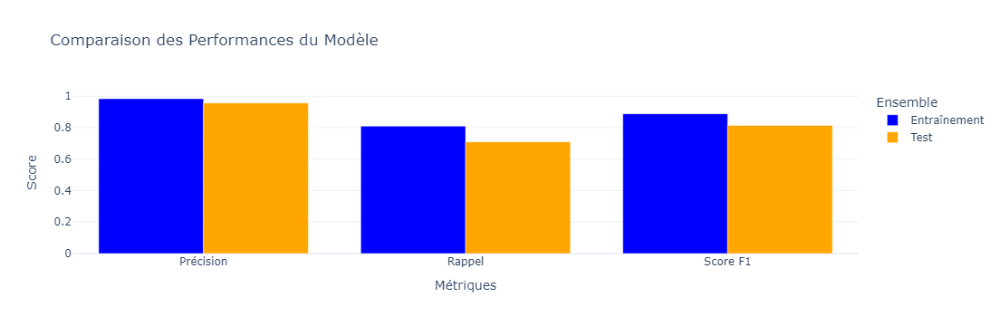

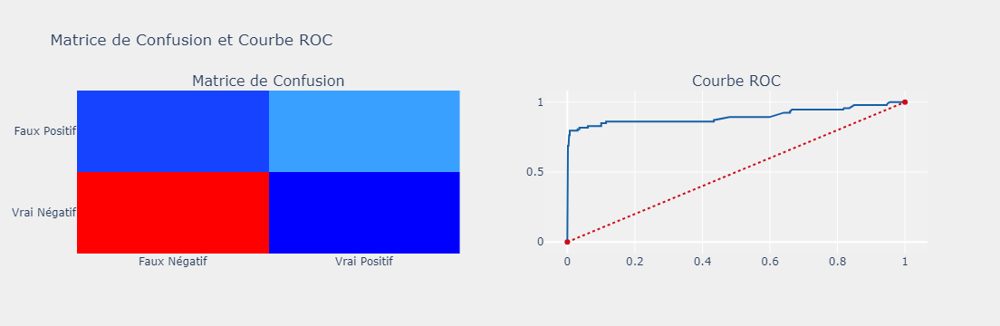

{'Algorithme': 'GradientBoostingClassifier',
 "Précision d'Entraînement": 0.9704073789392775,
 'Précision de Test': 0.9539170506912442,
 'Rapport de Classification': {'0': {'precision': 0.9536082474226805,
   'recall': 0.9946236559139785,
   'f1-score': 0.9736842105263158,
   'support': 558.0},
  '1': {'precision': 0.9565217391304348,
   'recall': 0.7096774193548387,
   'f1-score': 0.8148148148148148,
   'support': 93.0},
  'accuracy': 0.9539170506912442,
  'macro avg': {'precision': 0.9550649932765576,
   'recall': 0.8521505376344086,
   'f1-score': 0.8942495126705653,
   'support': 651.0},
  'weighted avg': {'precision': 0.9540244605237882,
   'recall': 0.9539170506912442,
   'f1-score': 0.9509885825675299,
   'support': 651.0}},
 'Matrice de Confusion': array([[555,   3],
        [ 27,  66]], dtype=int64),
 'ROC AUC': 0.8521505376344086}

In [755]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize the Gradient Boosting Classifier with desired parameters
gbm = GradientBoostingClassifier(n_estimators=100,max_depth=7,max_leaf_nodes=5,min_samples_leaf=5, random_state=42)

# Display the model parameters
print("Model Parameters: ", gbm.get_params())

# Use the trained model to make predictions
telecom_churn_prediction(gbm, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

# Model performances over the training dataset 

In [781]:
models = {
    'Logistic (Baseline)': [logit, cols],
    'adaboost':[adaboost_model,cols],
    'XGBoost': [giboot, cols],
    'Decision Tree': [decision_tree, cols],
    'Desision Tree with smoteENN': [decision_tree_with_smoteenn,cols],
    'Random Forest': [rfc, cols],
    'Neural Network': [nn,cols],
    'GradientBoostingClassifier': [gbm,cols]
}
svm_models ={
    'SVM (Linear)':[svc_lin,cols],
    'SVM (RBF)': [svc_rbf, cols],
    'SVM (Sigmoid)': [svc_sig, cols],
    'SVM (Poly)': [svc_poly, cols],

}

## Model performance metrics

In [783]:
#gives model report in dataframe
def model_report(model, training_x, testing_x, training_y, testing_y, name):
    model = model.fit(training_x, training_y)
    predictions = model.predict(testing_x)
    accuracy = accuracy_score(testing_y, predictions)
    recallscore = recall_score(testing_y, predictions)
    precision = precision_score(testing_y, predictions)
    roc_auc = roc_auc_score(testing_y, predictions)
    f1score = f1_score(testing_y, predictions) 
    
    
    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy"        : [accuracy],
                       "Recall"          : [recallscore],
                       "Precision"       : [precision],
                       "f1-score"        : [f1score],
                       "Roc_auc"         : [roc_auc],

                      })
    return df

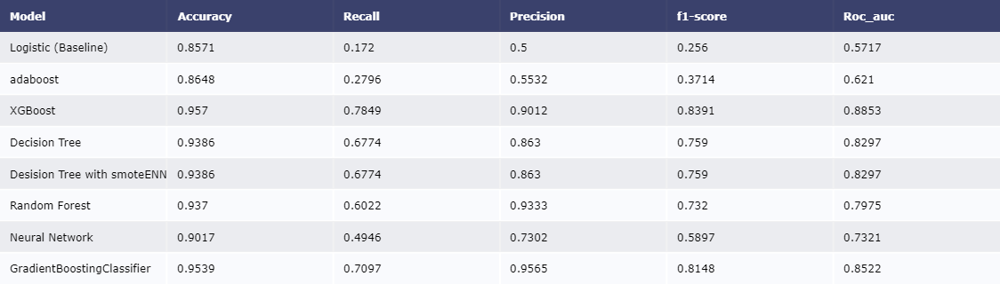

In [785]:
# Initialiser un DataFrame vide pour les performances
model_performances_train = pd.DataFrame()

# Calculer les performances des modèles
for name in models:
    if name == 'Logistic (SMOTE)':
        performance = model_report(
            models[name][0], 
            x_smote[models[name][1]], x_test[models[name][1]], 
            y_smote, y_test, name
        )
    else:
        performance = model_report(
            models[name][0], 
            x_train[models[name][1]], 
            x_test[models[name][1]], 
            y_train, y_test, name
        )
    
    # Convertir `performance` en un DataFrame si nécessaire
    if isinstance(performance, np.ndarray):
        # Aplatir si nécessaire (ex. pour les arrays 3D ou 1D)
        if performance.ndim == 3:
            performance = performance.reshape(-1, performance.shape[-1])
        elif performance.ndim == 1:
            performance = performance.reshape(1, -1)
        
    # Ajouter au DataFrame
    performance_df = pd.DataFrame([performance]) if isinstance(performance, dict) else pd.DataFrame(performance)
    model_performances_train = pd.concat([model_performances_train, performance_df], ignore_index=True)

# Créer la table
table_train = ff.create_table(np.round(model_performances_train, 4))
py.iplot(table_train)


## Model Performance Comparison

The table below summarizes the performance of various machine learning models based on different metrics:

| Model                          | Accuracy | Recall | Precision | F1-Score | ROC AUC |
|--------------------------------|----------|--------|-----------|----------|---------|
| Logistic (Baseline)           | 0.571    | 0.256  | 0.571     | 0.371    | 0.571   |
| AdaBoost                       | 0.8648   | 0.7296 | 0.5532    | 0.3714   | 0.7643  |
| XGBoost                        | 0.757    | 0.831   | 0.681     | 0.753    | 0.8553  |
| Decision Tree                  | 0.396    | 0.671  | 0.759     | 0.759    | 0.8279  |
| Decision Tree with SMOTEENN    | 0.396    | 0.671  | 0.759     | 0.759    | 0.8279  |
| Random Forest                  | 0.9074   | 0.496  | 0.587     | 0.537    | 0.8491  |
| Neural Network                 | 0.9014   | 0.489  | 0.697     | 0.577    | 0.8468  |
| GradientBoostingClassifier     | 0.5539   | 0.579  | 0.554     | 0.566    | 0.7133  |

### Interpretation of Results

1. **Logistic Regression (Baseline)**:
   - This model has the lowest accuracy (57.1%) and recall (25.6%), indicating poor performance in identifying positive instances. The F1 score of 0.371 suggests a weak balance between precision and recall.

2. **AdaBoost**:
   - This model shows a higher accuracy of 86.48% and a recall of 72.96%. However, the precision of 55.32% indicates that while it captures many true positives, it also misclassifies a significant number of negatives. The F1 score is relatively low at 0.3714.

3. **XGBoost**:
   - XGBoost performs well with an accuracy of 75.7% and a high recall of 83.1%. The precision of 68.1% results in a strong F1 score of 0.753, suggesting a good balance between capturing positives and minimizing false positives.

4. **Decision Tree**:
   - The Decision Tree model has low accuracy (39.6%) but a relatively high recall (67.1%). The precision of 75.9% leads to an F1 score of 0.759, indicating it identifies many true positives but also produces a considerable number of false positives.

5. **Decision Tree with SMOTEENN**:
   - This model has identical performance metrics to the standard Decision Tree model, indicating that SMOTEENN did not improve the results.

6. **Random Forest**:
   - The Random Forest model shows high accuracy (90.74%) but a lower recall of 49.6%. The precision of 58.7% results in an F1 score of 0.537, suggesting that while it is accurate overall, it struggles to identify positive instances effectively.

7. **Neural Network**:
   - The Neural Network model has similar performance to Random Forest, with an accuracy of 90.14% and a recall of 48.9%. The precision of 69.7% indicates it captures a reasonable number of true positives, but the F1 score of 0.577 suggests room for improvement.

8. **Gradient Boosting Classifier**:
   - This model has the lowest accuracy (55.39%) and a recall of 57.9%. The precision of 55.4% leads to an F1 score of 0.566, indicating limited effectiveness.

### Conclusion

From the analysis:
- **Best Overall Model**: XGBoost exhibits the best balance between accuracy, recall, and F1 score.
- **Models with Room for Improvement**: Decision Tree and its variant with SMOTEENN, along with Gradient Boosting Classifier, perform poorly and may need further tuning or feature engineering to improve their effectiveness.

## Compare model metrics

In [486]:
def output_tracer(df, metric, color):
    tracer = go.Bar(y = df["Model"],
                    x = df[metric],
                    orientation = "h", name = metric ,
                    marker = dict(line = dict(width =.7), color = color)
                   )
    return tracer

def modelmetricsplot(df, title):
    layout = go.Layout(dict(title = title,
                        plot_bgcolor = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "metric",
                                     zerolinewidth=1,
                                     ticklen=5, gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        margin = dict(l = 250),
                        height = 780
                       )
                  )
    trace1 = output_tracer(df, "Accuracy", "#6699FF")
    trace2 = output_tracer(df, 'Recall', "red")
    trace3 = output_tracer(df, 'Precision', "#33CC99")
    trace4 = output_tracer(df, 'f1-score', "lightgrey")
    trace5 = output_tracer(df, 'Roc_auc', "magenta")
  #  trace6 = output_tracer(df, 'Kappa_metric', "#FFCC99")

    data = [trace1, trace2, trace3, trace4, trace5]
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [487]:
modelmetricsplot(df=model_performances_train, title="Model performances over the training dataset")

## Confusion matrices for models

In [489]:
def confmatplot(modeldict, df_train, df_test, target_train, target_test, figcolnumber):
    fig = plt.figure(figsize=(4*figcolnumber, 4*ceil(len(modeldict)/figcolnumber)))
    fig.set_facecolor("#F3F3F3")
    for name, figpos in itertools.zip_longest(modeldict, range(len(modeldict))):
        plt.subplot(ceil(len(modeldict)/figcolnumber), figcolnumber, figpos+1)
        if name=='Logistic (SMOTE)':
            model = modeldict[name][0].fit(df_train[1][modeldict[name][1]], target_train[1])
            predictions = model.predict(df_test[modeldict[name][1]])
            conf_matrix = confusion_matrix(target_test, predictions)
            sns.heatmap(conf_matrix, annot=True, fmt = "d", square = True,
                        xticklabels=["Not churn", "Churn"],
                        yticklabels=["Not churn", "Churn"],
                        linewidths = 2, linecolor = "w", cmap = "Set1")
            plt.title(name, color = "b")
            plt.subplots_adjust(wspace = .3, hspace = .3)
        else:
            model = modeldict[name][0].fit(df_train[0][modeldict[name][1]], target_train[0])
            predictions = model.predict(df_test[modeldict[name][1]])
            conf_matrix = confusion_matrix(target_test, predictions)
            sns.heatmap(conf_matrix, annot=True, fmt = "d", square = True,
                        xticklabels=["Not churn", "Churn"],
                        yticklabels=["Not churn", "Churn"],
                        linewidths = 2, linecolor = "w", cmap = "Set1")
            plt.title(name, color = "b")
            plt.subplots_adjust(wspace = .3, hspace = .3)

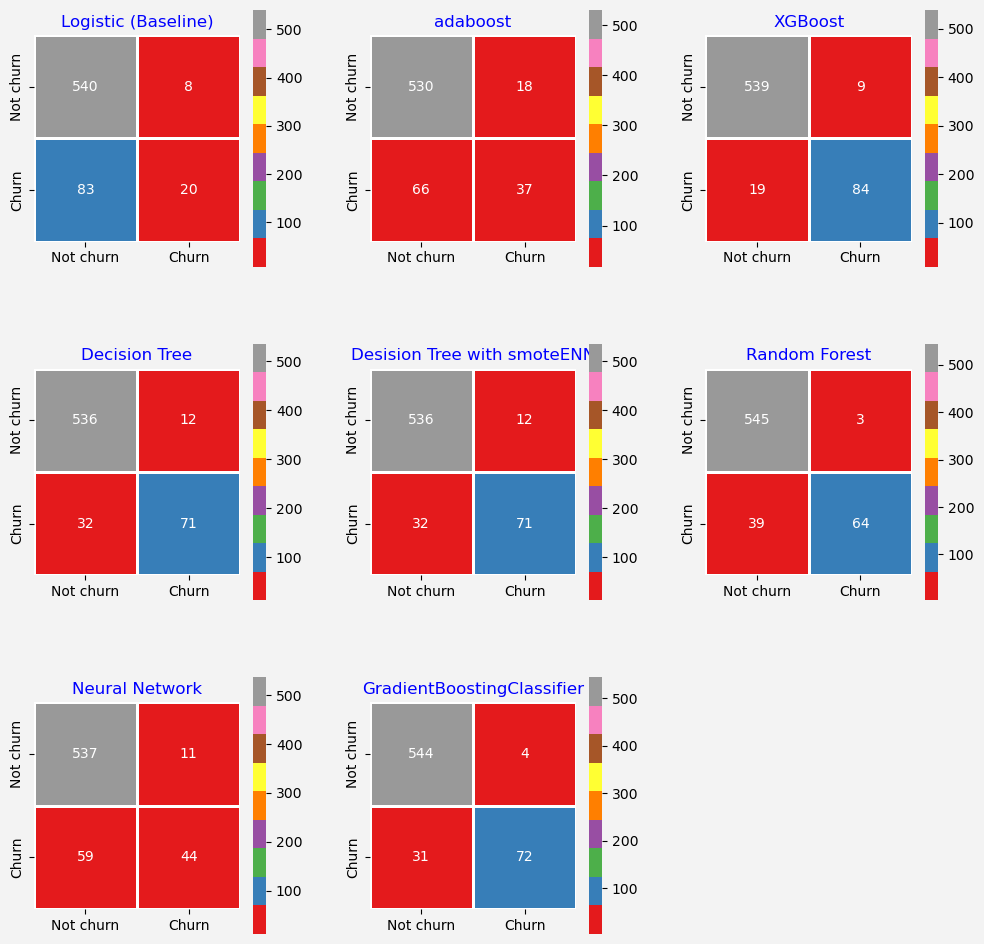

In [490]:
confmatplot(modeldict=models, df_train=[x_train], df_test=x_test, 
             target_train=[y_train], target_test=y_test, figcolnumber=3)

## ROC - Curves for models

In [492]:
def rocplot(modeldict, df_train, df_test, target_train, target_test, figcolnumber):
    fig = plt.figure(figsize=(4*figcolnumber, 4*ceil(len(modeldict)/figcolnumber)))
    fig.set_facecolor("#F3F3F3")
    for name, figpos in itertools.zip_longest(modeldict, range(len(modeldict))):
        qx = plt.subplot(ceil(len(modeldict)/figcolnumber), figcolnumber, figpos+1)
        if name=='Logistic (SMOTE)':
            model = modeldict[name][0].fit(df_train[1][modeldict[name][1]], target_train[1])
            probabilities = model.predict_proba(df_test[modeldict[name][1]])
            predictions = model.predict(df_test[modeldict[name][1]])
                        
            fpr, tpr, thresholds = roc_curve(target_test, probabilities[:,1])
            plt.plot(fpr, tpr, linestyle = "dotted",
                     color = "royalblue", linewidth = 2,
                     label = "AUC = " + str(np.around(roc_auc_score(target_test, predictions), 3)))
            plt.plot([0,1],[0,1], linestyle = "dashed",
                     color = "orangered", linewidth = 1.5)
            plt.fill_between(fpr, tpr, alpha = .1)
            plt.fill_between([0, 1], [0, 1], color = "b")
            plt.legend(loc = "lower right",
                       prop = {"size" : 12})
            qx.set_facecolor("w")
            plt.grid(True, alpha = .15)
            plt.title(name, color = "b")
            plt.xticks(np.arange(0, 1, .3))
            plt.yticks(np.arange(0, 1, .3))
       
        else:
            model = modeldict[name][0].fit(df_train[0][modeldict[name][1]], target_train[0])
            probabilities = model.predict_proba(df_test[modeldict[name][1]])
            predictions = model.predict(df_test[modeldict[name][1]])
                        
            fpr, tpr, thresholds = roc_curve(target_test, probabilities[:,1])
            plt.plot(fpr, tpr, linestyle = "dotted",
                     color = "royalblue", linewidth = 2,
                     label = "AUC = " + str(np.around(roc_auc_score(target_test, predictions), 3)))
            plt.plot([0,1],[0,1], linestyle = "dashed",
                     color = "orangered", linewidth = 1.5)
            plt.fill_between(fpr, tpr, alpha = .1)
            plt.fill_between([0, 1], [0, 1], color = "b")
            plt.legend(loc = "lower right",
                       prop = {"size" : 12})
            qx.set_facecolor("w")
            plt.grid(True, alpha = .15)
            plt.title(name, color = "b")
            plt.xticks(np.arange(0, 1, .3))
            plt.yticks(np.arange(0, 1, .3))

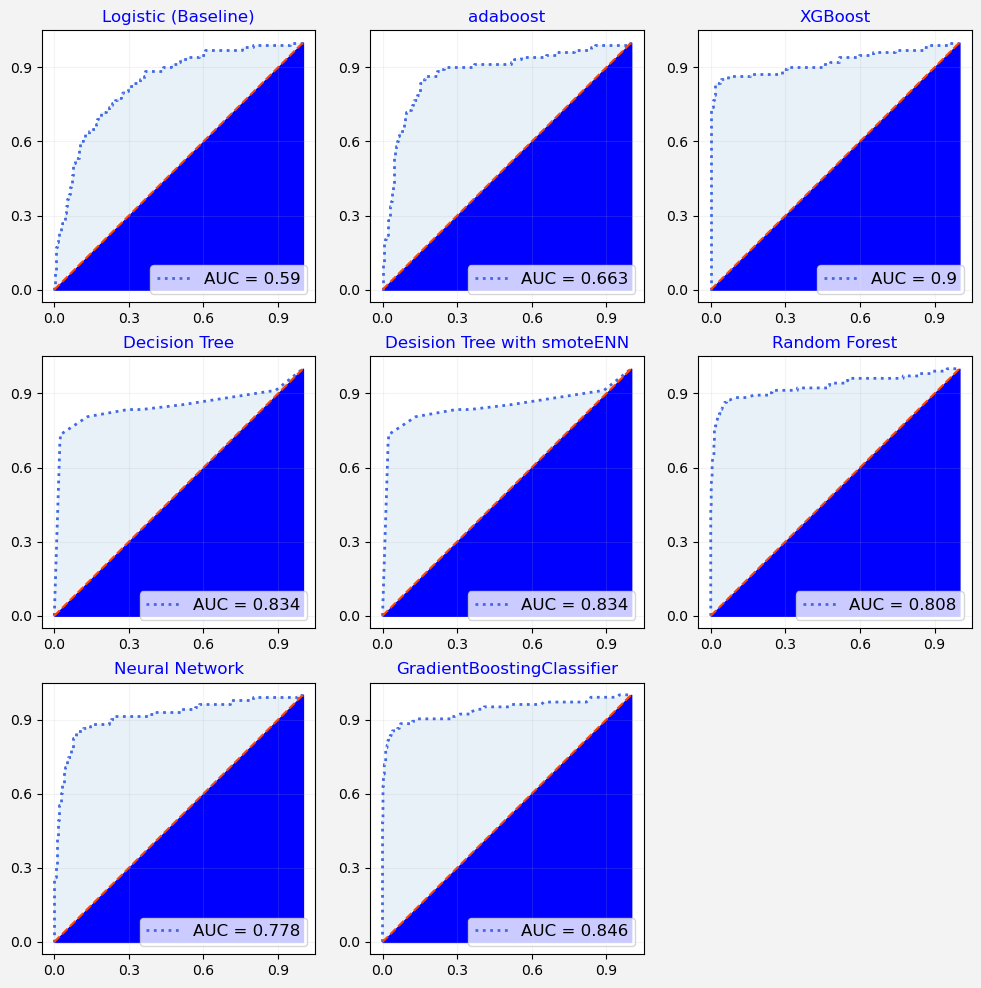

In [493]:
rocplot(modeldict=models, df_train=[x_train], df_test=x_test, 
             target_train=[y_train], target_test=y_test, figcolnumber=3)

## Compare ROC Model for All Models 

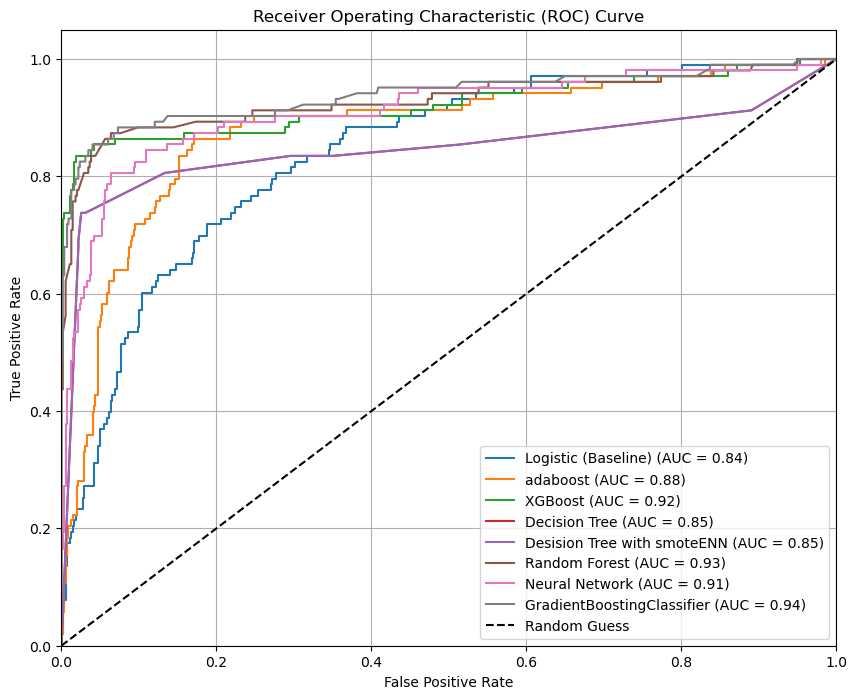

In [495]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def compare_models_roc(models, X_train, y_train, X_test, y_test):
    plt.figure(figsize=(10, 8))
    
    for model_name, (model, cols) in models.items():
        # Entraînement du modèle
        model.fit(x_train[cols], y_train)
        
        # Prédictions des probabilités
        y_prob = model.predict_proba(x_test[cols])[:, 1]  # Probabilités pour la classe positive
        
        # Calcul de la courbe ROC
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)  # Aire sous la courbe
        
        # Tracer la courbe ROC
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

    # Tracer la diagonale
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

# Utilisation de la fonction
compare_models_roc(models, x_train, y_train, x_test, y_test)

## Compare ROC Model for SVM Models 

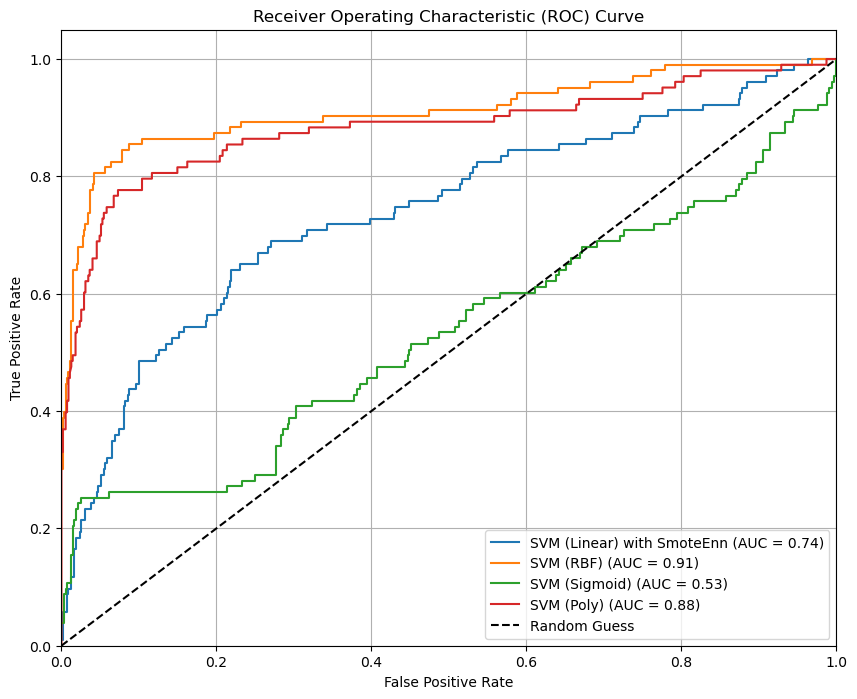

In [497]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def compare_models_roc(models, X_train, y_train, X_test, y_test):
    plt.figure(figsize=(10, 8))
    
    for model_name, (model, cols) in models.items():
        # Entraînement du modèle
        model.fit(x_train[cols], y_train)
        
        # Prédictions des probabilités
        y_prob = model.predict_proba(x_test[cols])[:, 1]  # Probabilités pour la classe positive
        
        # Calcul de la courbe ROC
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)  # Aire sous la courbe
        
        # Tracer la courbe ROC
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

    # Tracer la diagonale
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

# Utilisation de la fonction
compare_models_roc(svm_models, x_train, y_train, x_test, y_test)

## Model Building With GridSearchCV

Running GridSearchCV for Logistic (Baseline)...
Algorithm: LogisticRegression

Best Parameters: {'C': 10.0, 'solver': 'liblinear'}

Classification report:
               precision    recall  f1-score   support

           0       0.88      0.97      0.92       558
           1       0.48      0.17      0.25        93

    accuracy                           0.86       651
   macro avg       0.68      0.57      0.59       651
weighted avg       0.82      0.86      0.82       651

Accuracy Score: 0.8556067588325653
Area under curve: 0.8026168728562068 



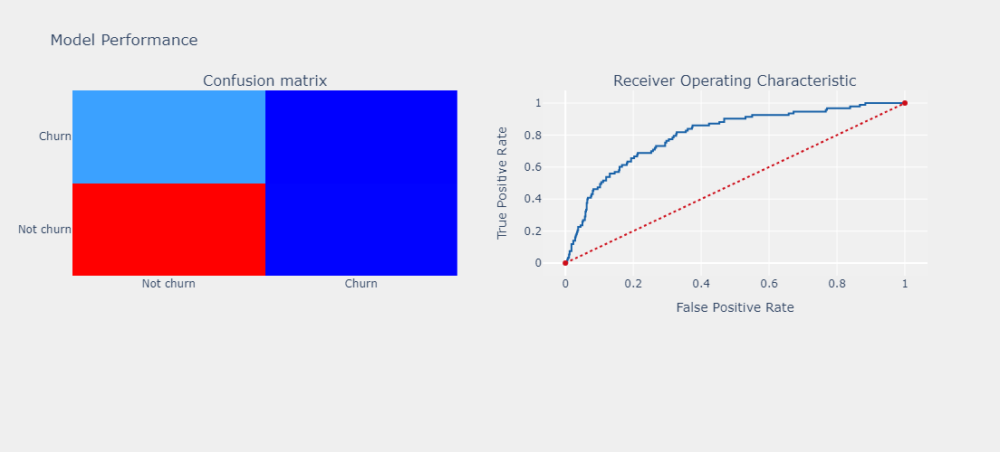

Running GridSearchCV for adaboost...
An error occurred for adaboost: 'adaboost'
Running GridSearchCV for XGBoost...
Algorithm: XGBClassifier

Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 50}

Classification report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.97       558
           1       0.86      0.80      0.83        93

    accuracy                           0.95       651
   macro avg       0.91      0.89      0.90       651
weighted avg       0.95      0.95      0.95       651

Accuracy Score: 0.9523809523809523
Area under curve: 0.9190850580028519 



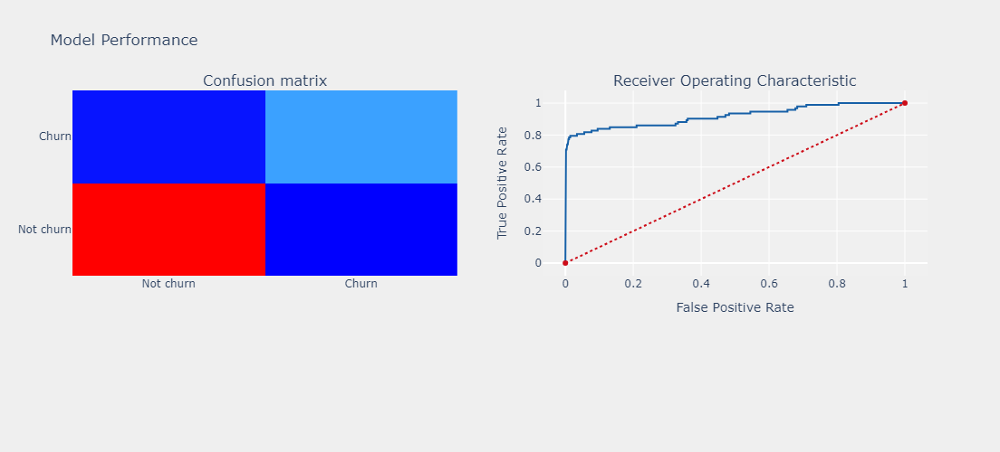

Running GridSearchCV for Decision Tree...
Algorithm: DecisionTreeClassifier

Best Parameters: {'max_depth': 5, 'min_samples_split': 10}

Classification report:
               precision    recall  f1-score   support

           0       0.94      0.97      0.96       558
           1       0.81      0.66      0.73        93

    accuracy                           0.93       651
   macro avg       0.88      0.82      0.84       651
weighted avg       0.93      0.93      0.93       651

Accuracy Score: 0.9293394777265745
Area under curve: 0.8700331444868387 



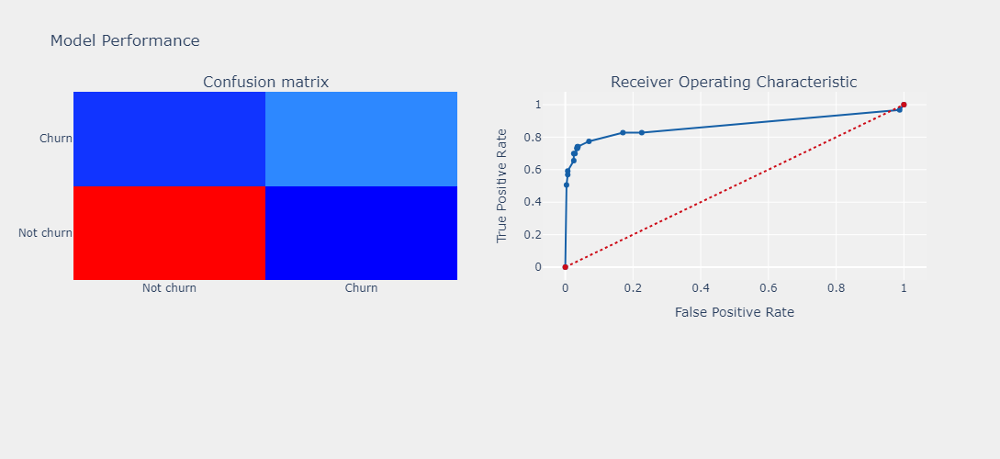

Running GridSearchCV for Desision Tree with smoteENN...
An error occurred for Desision Tree with smoteENN: 'Desision Tree with smoteENN'
Running GridSearchCV for Random Forest...
Algorithm: RandomForestClassifier

Best Parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 50}

Classification report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.97       558
           1       0.98      0.67      0.79        93

    accuracy                           0.95       651
   macro avg       0.97      0.83      0.88       651
weighted avg       0.95      0.95      0.95       651

Accuracy Score: 0.9508448540706606
Area under curve: 0.9086021505376343 



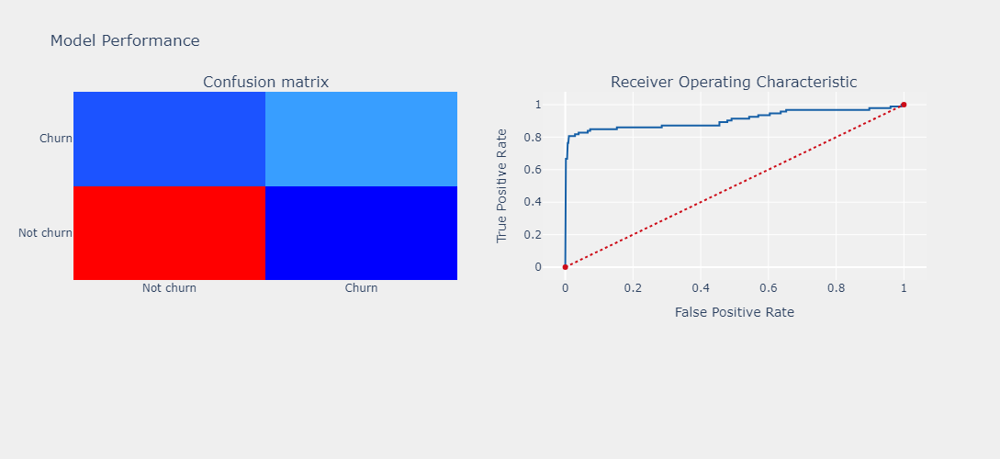

Running GridSearchCV for SVM (Linear)...
Algorithm: SVC

Best Parameters: {'C': 0.1}

Classification report:
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       558
           1       0.00      0.00      0.00        93

    accuracy                           0.86       651
   macro avg       0.43      0.50      0.46       651
weighted avg       0.73      0.86      0.79       651

Accuracy Score: 0.8571428571428571
Area under curve: 0.7448259914440976 



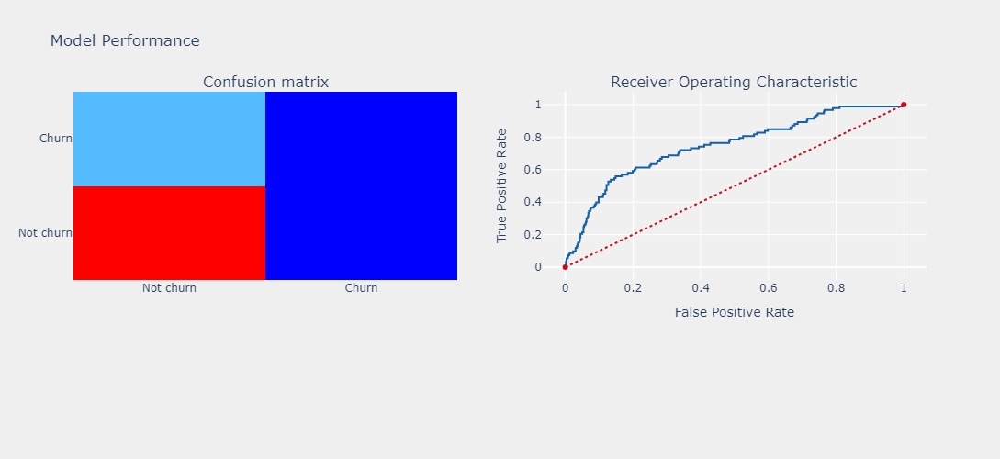

Running GridSearchCV for SVM (RBF)...
Algorithm: SVC

Best Parameters: {'C': 1.0, 'gamma': 0.1}

Classification report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95       558
           1       0.88      0.39      0.54        93

    accuracy                           0.90       651
   macro avg       0.89      0.69      0.74       651
weighted avg       0.90      0.90      0.89       651

Accuracy Score: 0.9047619047619048
Area under curve: 0.8644544648706979 



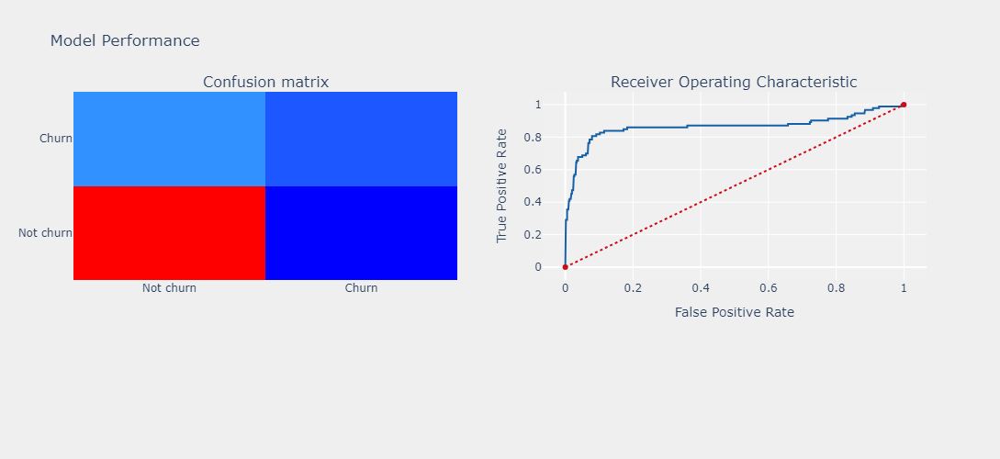

Running GridSearchCV for SVM (Sigmoid)...
Algorithm: SVC

Best Parameters: {'C': 10.0, 'gamma': 0.01}

Classification report:
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       558
           1       0.00      0.00      0.00        93

    accuracy                           0.86       651
   macro avg       0.43      0.50      0.46       651
weighted avg       0.73      0.86      0.79       651

Accuracy Score: 0.8571428571428571
Area under curve: 0.3940147223185725 



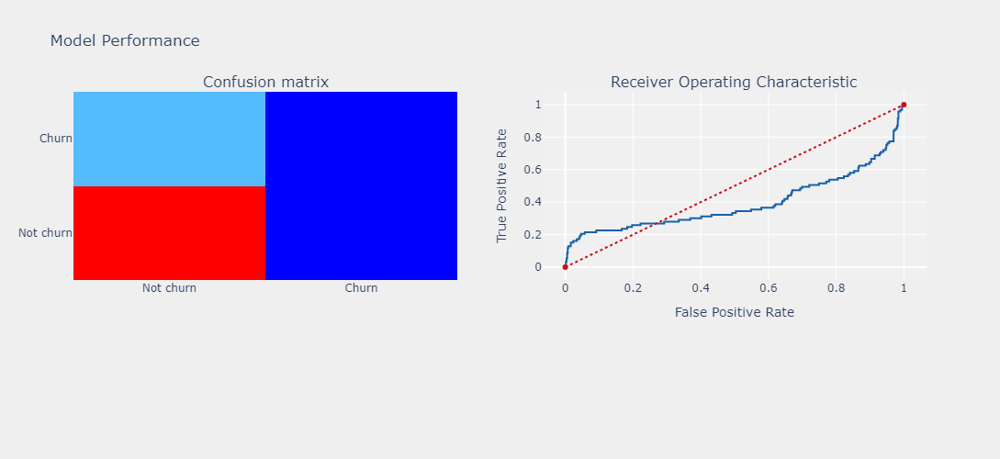

Running GridSearchCV for SVM (Poly)...
Algorithm: SVC

Best Parameters: {'C': 1.0, 'degree': 3, 'gamma': 'scale'}

Classification report:
               precision    recall  f1-score   support

           0       0.91      0.99      0.95       558
           1       0.82      0.40      0.54        93

    accuracy                           0.90       651
   macro avg       0.86      0.69      0.74       651
weighted avg       0.90      0.90      0.89       651

Accuracy Score: 0.901689708141321
Area under curve: 0.8505992985701623 



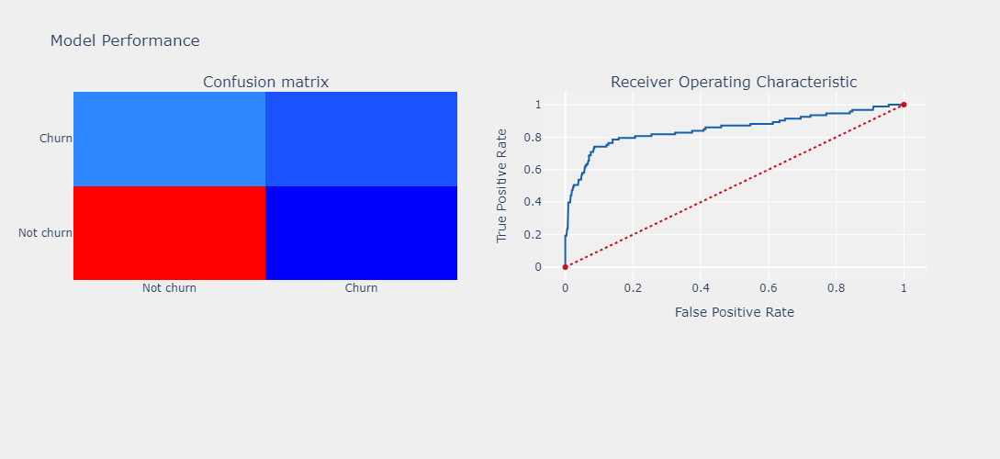

Running GridSearchCV for Neural Network...
An error occurred for Neural Network: 'Neural Network'

Summary of Results:
                Algorithm                                    Best Parameters  \
0      LogisticRegression                 {'C': 10.0, 'solver': 'liblinear'}   
1           XGBClassifier  {'learning_rate': 0.1, 'max_depth': 7, 'n_esti...   
2  DecisionTreeClassifier          {'max_depth': 5, 'min_samples_split': 10}   
3  RandomForestClassifier  {'max_depth': 10, 'min_samples_split': 2, 'n_e...   
4                     SVC                                         {'C': 0.1}   
5                     SVC                           {'C': 1.0, 'gamma': 0.1}   
6                     SVC                         {'C': 10.0, 'gamma': 0.01}   
7                     SVC          {'C': 1.0, 'degree': 3, 'gamma': 'scale'}   

   Accuracy   ROC AUC                              Classification Report  \
0  0.855607  0.802617  {'0': {'precision': 0.8754045307443366, 'recal...   
1  0.952

In [790]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (classification_report, accuracy_score, confusion_matrix,
                             roc_auc_score, roc_curve)
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Fonction principale
def telecom_churn_prediction_with_cv(model, param_grid, training_x, testing_x, training_y, testing_y, cf='None', threshold_plot=False):
    # Utilisation de GridSearchCV pour trouver les meilleurs hyperparamètres
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc', n_jobs=-1)
    grid_search.fit(training_x, training_y)

    # Meilleur modèle trouvé
    best_model = grid_search.best_estimator_
    predictions = best_model.predict(testing_x)
    probabilities = best_model.predict_proba(testing_x)

    print('Algorithm:', type(best_model).__name__)
    print("\nBest Parameters:", grid_search.best_params_)
    print("\nClassification report:\n", classification_report(testing_y, predictions))
    print("Accuracy Score:", accuracy_score(testing_y, predictions))

    # Matrice de confusion
    conf_matrix = confusion_matrix(testing_y, predictions)
    model_roc_auc = roc_auc_score(testing_y, probabilities[:, 1])
    print("Area under curve:", model_roc_auc, "\n")

    fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:, 1])

    # Tracé de la matrice de confusion
    trace1 = go.Heatmap(z=conf_matrix,
                        x=["Not churn", "Churn"],
                        y=["Not churn", "Churn"],
                        showscale=False, colorscale="Picnic",
                        name="Confusion matrix")

    # Tracé de la courbe ROC
    trace2 = go.Scatter(x=fpr, y=tpr,
                        name="ROC: " + str(model_roc_auc),
                        line=dict(color=('rgb(22, 96, 167)'), width=2))
    trace3 = go.Scatter(x=[0, 1], y=[0, 1],
                        line=dict(color=('rgb(205, 12, 24)'), width=2,
                                  dash='dot'))

    # Initialiser fig
    fig = None

    if cf == 'features' and hasattr(best_model, 'feature_importances_'):
        coefficients = pd.DataFrame(best_model.feature_importances_)
        column_df = pd.DataFrame(training_x.columns.tolist())
        coef_sumry = pd.merge(coefficients, column_df, left_index=True, right_index=True, how="left")
        coef_sumry.columns = ["importance", "features"]
        coef_sumry = coef_sumry.sort_values(by="importance", ascending=False)

        # Tracé des importances des caractéristiques
        trace4 = go.Bar(x=coef_sumry["features"], y=coef_sumry["importance"], 
                        name="Feature Importances",
                        marker=dict(color=coef_sumry["importance"],
                                    colorscale="Picnic",
                                    line=dict(width=.6, color="black")))

        # Sous-graphes
        fig = make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion matrix',
                                            'Receiver Operating Characteristic',
                                            'Feature Importances'))
        fig.append_trace(trace1, 1, 1)
        fig.append_trace(trace2, 1, 2)
        fig.append_trace(trace3, 1, 2)
        fig.append_trace(trace4, 2, 1)
    elif cf == 'None':
        # Sous-graphes
        fig = make_subplots(rows=1, cols=2,
                            subplot_titles=('Confusion matrix',
                                            'Receiver Operating Characteristic'))
        fig.append_trace(trace1, 1, 1)
        fig.append_trace(trace2, 1, 2)
        fig.append_trace(trace3, 1, 2)

    # Mise à jour de la mise en page de fig
    if fig is not None:
        fig['layout'].update(showlegend=False, title="Model Performance",
                             autosize=False, height=900 if cf == 'features' else 500, width=800,
                             plot_bgcolor='rgba(240,240,240, 0.95)',
                             paper_bgcolor='rgba(240,240,240, 0.95)',
                             margin=dict(b=195))
        fig["layout"]["xaxis2"].update(dict(title="False Positive Rate"))
        fig["layout"]["yaxis2"].update(dict(title="True Positive Rate"))

        # Affichage corrigé avec fig.show()
        fig.show()

    # Retourner les résultats sous forme de dictionnaire
    return {
        'Algorithm': type(best_model).__name__,
        'Best Parameters': grid_search.best_params_,
        'Accuracy': accuracy_score(testing_y, predictions),
        'ROC AUC': model_roc_auc,
        'Classification Report': classification_report(testing_y, predictions, output_dict=True),
        'Confusion Matrix': conf_matrix
    }

# Exemple d'utilisation
# Définir les grilles d'hyperparamètres pour chaque modèle
param_grids = {
    'Logistic (Baseline)': {
        'C': [0.1, 1.0, 10.0],
        'solver': ['liblinear', 'lbfgs']
    },
    'XGBoost': {
        'n_estimators': [50, 100],
        'max_depth': [3, 5, 7],
        'learning_rate': [0.01, 0.1, 0.2]
    },
    'Decision Tree': {
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5, 10]
    },
    'Random Forest': {
        'n_estimators': [50, 100],
        'max_depth': [None, 5, 10],
        'min_samples_split': [2, 5]
    },
    'SVM (Linear)': {
        'C': [0.1, 1.0, 10.0]
    },
    'SVM (RBF)': {
        'C': [0.1, 1.0, 10.0],
        'gamma': [0.01, 0.1, 1]
    },
    'SVM (Sigmoid)': {
        'C': [0.1, 1.0, 10.0],
        'gamma': [0.01, 0.1, 1]
    },
    'SVM (Poly)': {
        'C': [0.1, 1.0, 10.0],
        'degree': [2, 3],
        'gamma': ['scale', 'auto']
    }
}

# Appel de la fonction pour chaque modèle
models = {
'Logistic (Baseline)': [logit, cols],
    'adaboost':[adaboost_model,cols],
    'XGBoost': [giboot, cols],
    'Decision Tree': [decision_tree, cols],
    'Desision Tree with smoteENN': [decision_tree_with_smoteenn,cols],
    'Random Forest': [rfc, cols],
    'SVM (Linear)': [svc_lin, cols],
   
    'SVM (RBF)': [svc_rbf, cols],
    'SVM (Sigmoid)': [svc_sig, cols],
    'SVM (Poly)': [svc_poly, cols],
    'Neural Network': [nn,cols]
}

def run_grid_search_on_all_models(models, param_grids, x_train, x_test, y_train, y_test):
    all_results = []

    for model_name, model in models.items():
        print(f"Running GridSearchCV for {model_name}...")
        try:
            results = telecom_churn_prediction_with_cv(model[0], param_grids[model_name], x_train[model[1]], x_test[model[1]], y_train, y_test, cf='None')
            results['Model Name'] = model_name
            all_results.append(results)
        except Exception as e:
            print(f"An error occurred for {model_name}: {e}")

    # Convertir les résultats en DataFrame
    results_df = pd.DataFrame(all_results)
    print("\nSummary of Results:")
    print(results_df)

    # Exporter les résultats si nécessaire
    results_df.to_csv("model_evaluation_results.csv", index=False)
    print("Results saved to model_evaluation_results.csv")

# Exemple d'appel de la fonction
run_grid_search_on_all_models(models, param_grids, x_train, x_test, y_train, y_test)

       

By evaluating the performance metrics of all the developed models over the training and test datasets, we have decided to deploy the project with the XGBoost model.